# Pennylane test

In [6]:
import pennylane as qml
from pennylane import numpy as np
from pennylane.optimize import NesterovMomentumOptimizer
import matplotlib.pyplot as plt
from tqdm import tqdm
import time
from sklearn.metrics import mean_squared_error, r2_score

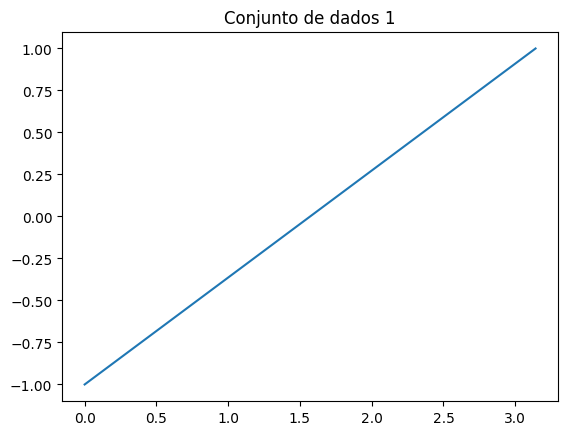

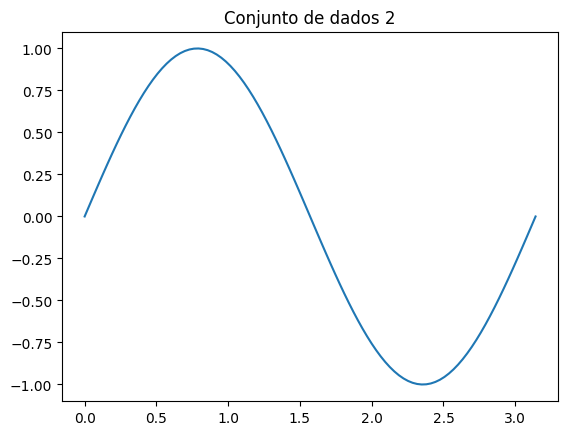

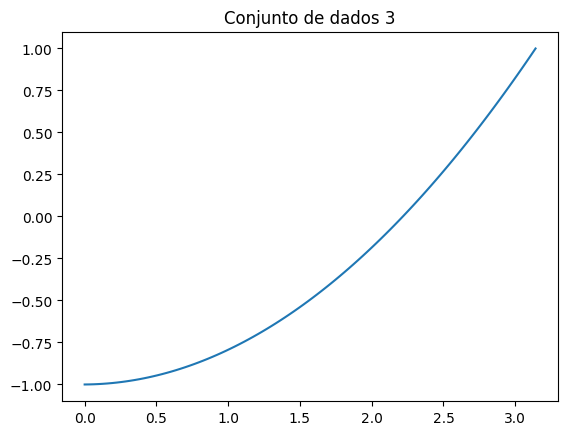

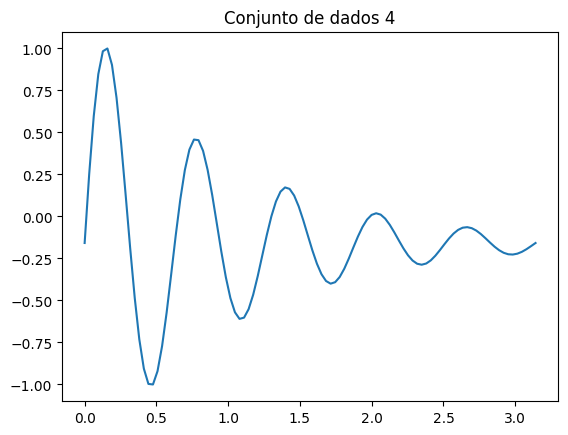

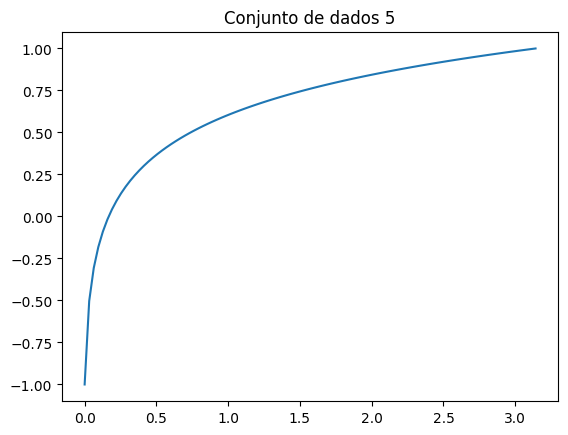

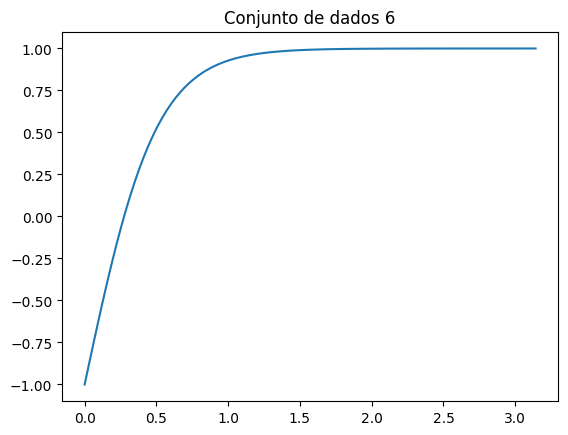

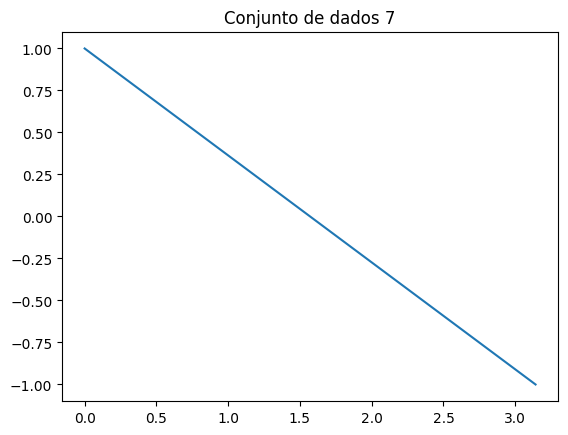

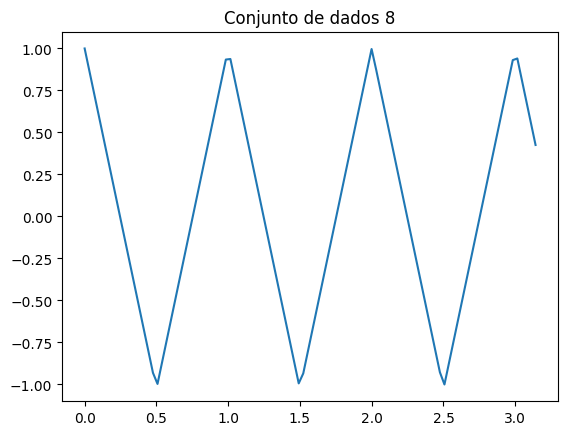

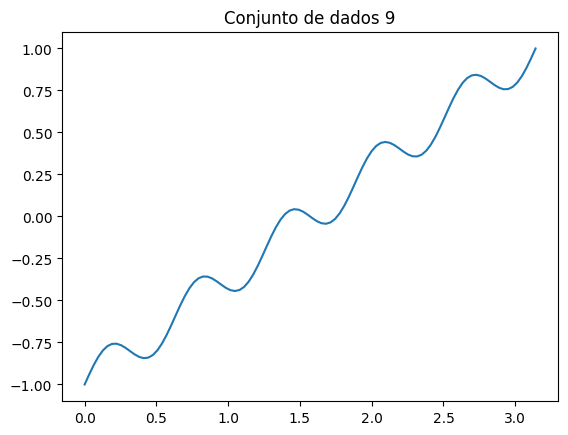

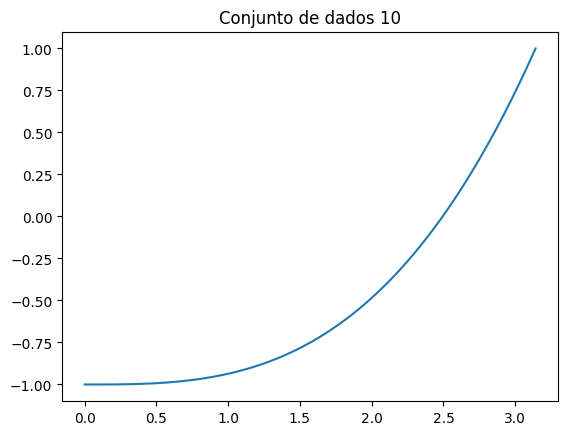

In [7]:
funcs = {
    0: lambda x: 2 * x + 1, # Linearidade simples
    1: lambda x: np.sin(x / 50), # Periodicidade
    2: lambda x: x**2 + 3 * x + 2, # Não linear com tendência crescente
    3: lambda x: np.exp(-x / 100) * np.sin(x / 10),  # damped sine wave
    4: lambda x: np.log1p(np.abs(x)),               # log-based growth
    5: lambda x: np.tanh(x / 50),                   # sigmoid-like nonlinearity
    6: lambda x: np.piecewise(x, [x < 0, x >= 0], [lambda x: x**2, lambda x: -x]),  # piecewise
    7: lambda x: np.abs(x % 100 - 50),              # triangular wave
    8: lambda x: 10 * np.sin(x / 10) + 0.5 * x,     # trend + periodicity
    9: lambda x: (x / 10)**3 - (x / 10),            # cubic polynomial
}

def min_max_norm(dataset):
    norm_dataset = {}
    X = dataset["x"]
    Y = dataset["y"]

    norm_dataset["x"] = ((X - np.min(X)) / (np.max(X) - np.min(X))) *np.pi
    norm_dataset["y"] = (Y - np.min(Y)) / (np.max(Y) - np.min(Y)) *2 -1

    return norm_dataset

def generate_dataset(func, x_min=0, x_max=100 * np.pi, num_samples=100):

    X = np.linspace(x_min, x_max, num_samples)
    y = func(X)
    return X, y

datasets = {}

for i in funcs:
    x, y = generate_dataset(funcs[i])
    datasets[i] = {}
    datasets[i]["x"] = x
    datasets[i]["y"] = y

    datasets[i] = min_max_norm(datasets[i])

for i in datasets:
    plt.title(f"Conjunto de dados {i+1}")
    plt.plot(datasets[i]['x'], datasets[i]['y'])
    plt.show()


In [9]:
class QuantumRegressor(object):
    def __init__(self, n_qubits=1, n_layers=3):
        """
        Initialize the QuantumRegressor.

        Inputs:
            n_qubits (int): Number of qubits to use in the quantum circuit.
            n_layers (int): Number of layers in the quantum circuit.

        Outputs:
            None
        """
        self.n_qubits = n_qubits
        self.n_layers = n_layers
        self.device = qml.device('default.qubit', wires=self.n_qubits)
        self.training_time = None
        self.circuit_depth = self._calculate_circuit_depth()
        self.training_time = -1

        if self.n_qubits > 1:
            shape = qml.StronglyEntanglingLayers.shape(n_layers=self.n_layers, n_wires=self.n_qubits)
            self.parameters = 0.01 * np.random.randn(*shape, requires_grad=True)
        else:
            self.parameters = 0.01 * np.random.randn(self.n_layers, 3, requires_grad=True)

        self.bias = np.array(0.0, requires_grad=True)

        @qml.qnode(self.device)
        def quantum_circuit(params, x_input):
            if len(x_input) != 2**self.n_qubits:
                raise ValueError(f"Input must have length {2**self.n_qubits} for AmplitudeEmbedding")

            qml.AmplitudeEmbedding(features=x_input, wires=range(self.n_qubits), normalize=True)

            if self.n_qubits > 1:
                qml.StronglyEntanglingLayers(weights=params, wires=range(self.n_qubits))
            else:
                for i in range(self.n_layers):
                    qml.Rot(*params[i], wires=0)
            return qml.expval(qml.PauliZ(0))

        self.qnode = quantum_circuit

    def _calculate_circuit_depth(self):
        """
        Calculate the depth of the quantum circuit.

        Inputs:
            None

        Outputs:
            int: The depth of the quantum circuit.
        """
        embedding_depth = 1
        if self.n_qubits > 1:
            processing_depth = self.n_layers * 2
        else:
            processing_depth = self.n_layers
        return embedding_depth + processing_depth

    @staticmethod
    def loss_fn(y_true, y_pred):
        """
        Compute the mean absolute error loss.

        Inputs:
            y_true (np.ndarray): True target values.
            y_pred (np.ndarray or list): Predicted values.

        Outputs:
            float: Mean absolute error between y_true and y_pred.
        """
        return np.mean(np.abs(y_true - y_pred))

    def compute_loss(self, X, y, params=None, bias=None):
        """
        Compute the loss for a given dataset and parameters.

        Inputs:
            X (np.ndarray): Input features, shape (num_samples, num_features).
            y (np.ndarray): Target values.
            params (np.ndarray, optional): Parameters for the quantum circuit. If None, uses self.parameters.
            bias (np.ndarray, optional): Bias term. If None, uses self.bias.

        Outputs:
            float: Computed loss value.
        """
        if params is None:
            params = self.parameters
        if bias is None:
            bias = self.bias
        expected_input_dim = 2 ** self.n_qubits
        if X.shape[1] != expected_input_dim:
            raise ValueError(f"Input features must have {expected_input_dim} columns for AmplitudeEmbedding, got {X.shape[1]}")

        y_pred = np.array([self.qnode(params, x) + bias for x in X])
        return self.loss_fn(y, y_pred)

    def forward(self, x_input, params=None, bias=None):
        """
        Perform a forward pass through the quantum circuit.

        Inputs:
            x_input (np.ndarray): Input features, length should be n_qubits.
            params (np.ndarray, optional): Parameters for the quantum circuit. If None, uses self.parameters.
            bias (np.ndarray, optional): Bias term. If None, uses self.bias.

        Outputs:
            float: Predicted value for the input.
        """
        if params is None:
            params = self.parameters
        if bias is None:
            bias = self.bias
        expected_input_dim = 2 ** self.n_qubits
        if len(x_input) != expected_input_dim:
            raise ValueError(f"Input must have {expected_input_dim} elements for AmplitudeEmbedding, got {len(x_input)}")

        return self.qnode(params, x_input) + bias

    def predict_single(self, x_input):
        """
        Predict the output for a single input value.

        Inputs:
            x_input (np.ndarray): Input features, length should be n_qubits.

        Outputs:
            float: Predicted value for the input.
        """
        return self.forward(x_input)

    def plot_circuit(self, expand_layers=True):
        """
        Plot the quantum circuit using matplotlib.

        Inputs:
            expand_layers (bool): If True, expands the StronglyEntanglingLayers to show individual gates.
                                  If False, shows the compact representation.

        Outputs:
            None
        """
        features = np.ones(self.n_qubits)
        if expand_layers:
            @qml.qnode(self.device)
            def expanded_circuit(params, x_input):
                features = np.array(x_input)
                qml.AngleEmbedding(features=features, wires=range(self.n_qubits), rotation='X')
                if self.n_qubits > 1:
                    for layer in range(self.n_layers):
                        for wire in range(self.n_qubits):
                            qml.Rot(*params[layer, wire, :3], wires=wire)
                        for wire in range(self.n_qubits - 1):
                            qml.CNOT(wires=[wire, wire + 1])
                        if self.n_qubits > 2:
                            qml.CNOT(wires=[self.n_qubits - 1, 0])
                else:
                    for i in range(self.n_layers):
                        qml.Rot(*params[i], wires=0)
                return qml.expval(qml.PauliZ(0))
            fig, ax = qml.draw_mpl(expanded_circuit)(self.parameters, features)
        else:
            fig, ax = qml.draw_mpl(self.qnode)(self.parameters, features)
        plt.show()

    def predict(self, X):
        """
        Predict outputs for multiple input samples.

        Inputs:
            X (np.ndarray): Input features, shape (num_samples, num_features).

        Outputs:
            list: List of predicted values for each input sample.
        """
        expected_input_dim = 2 ** self.n_qubits
        if X.shape[1] != expected_input_dim:
            raise ValueError(f"Input features must have {expected_input_dim} columns for AmplitudeEmbedding, got {X.shape[1]}")

        return [self.forward(x) for x in X]

    def batch_loss(self, params, bias, X_batch, y_batch):
        """
        Compute the loss for a batch of data.

        Inputs:
            params (np.ndarray): Parameters for the quantum circuit.
            bias (np.ndarray): Bias term.
            X_batch (np.ndarray): Batch of input features.
            y_batch (np.ndarray): Batch of target values.

        Outputs:
            float: Computed loss value for the batch.
        """
        return self.compute_loss(X_batch, y_batch, params, bias)


    def fit(self, X, y, epochs=100, batch_size=10, learning_rate=0.01):
        """
        Train the model on data (X, y) using NesterovMomentumOptimizer.

        Inputs:
            X (np.ndarray): Input features, shape (num_samples, num_features).
            y (np.ndarray): Target values.
            epochs (int): Number of training epochs.
            batch_size (int): Size of each training batch.
            learning_rate (float): Learning rate for the optimizer.

        Outputs:
            None
        """
        expected_input_dim = 2 ** self.n_qubits
        if X.shape[1] != expected_input_dim:
            raise ValueError(f"Input features must have {expected_input_dim} columns for AmplitudeEmbedding, got {X.shape[1]}")

        optimizer = NesterovMomentumOptimizer(learning_rate)
        params = self.parameters
        bias = self.bias
        n_samples = X.shape[0]
        best_params = params.copy()
        best_bias = bias.copy()
        best_loss = float('inf')
        start_time = time.time()
        with tqdm(range(epochs), desc=f"Model ({self.n_qubits}×{self.n_layers}) Training") as pbar:
            for epoch in pbar:
                actual_batch_size = min(batch_size, n_samples)
                batch_indices = np.random.choice(n_samples, actual_batch_size, replace=False)
                X_batch = X[batch_indices, :]
                y_batch = y[batch_indices]
                params, bias, _, _ = optimizer.step(
                    self.batch_loss, params, bias, X_batch, y_batch
                )
                loss = self.compute_loss(X, y, params, bias)
                pbar.set_postfix({"loss": f"{loss:.6f}"})
                if loss < best_loss:
                    best_loss = loss
                    best_params = params.copy()
                    best_bias = bias.copy()
        end_time = time.time()
        self.training_time = end_time - start_time
        self.parameters = best_params
        self.bias = best_bias

    def stats(self, y_pred, y_true, verbose=True):
        """
        Calculate and display statistics for the quantum regressor.

        Inputs:
            y_pred (array-like): Predicted values from the model.
            y_true (array-like): True/actual target values.
            verbose (bool, optional): Whether to print results to console.

        Outputs:
            dict: Dictionary containing calculated metrics (MSE, R2 score, training time, number of qubits, circuit depth).
        """
        mse = mean_squared_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
        results = {
            'MSE': mse,
            'R2_Score': r2,
            'Training_Time': self.training_time,
            'N_Qubits': self.n_qubits,
            'N_layers':self.n_layers,
            'Circuit_Depth': self.circuit_depth
        }
        spaces = 80
        if verbose:
            print(f"""
                    {'='*spaces}
                    QUANTUM REGRESSOR STATISTICS
                    {'='*spaces}
                    {'Metric':<25} {'Value':<20} {'Description'}
                    {'-'*spaces}
                    {'Mean Squared Error (MSE)':<25} {mse:<20.6f} {'Mean squared error of prediction'}
                    {'R² Score':<25} {r2:<20.6f} {'Coefficient of determination'}
                    {'Training Time (s)':<25} {self.training_time:<20.6f} {'Total training time'}
                    {'Number of Qubits':<25} {self.n_qubits:<20} {'Required resources'}
                    {'Number of Layers':<25} {self.n_layers:<20} {'Required resources'}
                    {'Circuit Depth':<25} {self.circuit_depth:<20} {'Generated circuit complexity'}
                    {'='*spaces}
                    """)
        return results

In [10]:
import warnings
warnings.filterwarnings("ignore")

Model (1×1) Training: 100%|██████████| 200/200 [00:31<00:00,  6.30it/s, loss=0.185443]


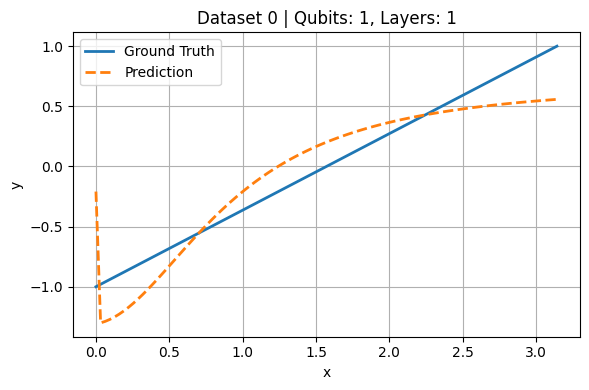

Model (1×1) Training: 100%|██████████| 200/200 [00:31<00:00,  6.28it/s, loss=0.364944]


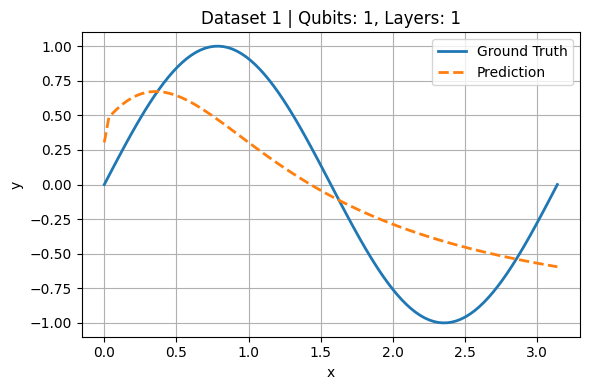

Model (1×1) Training: 100%|██████████| 200/200 [00:32<00:00,  6.13it/s, loss=0.183814]


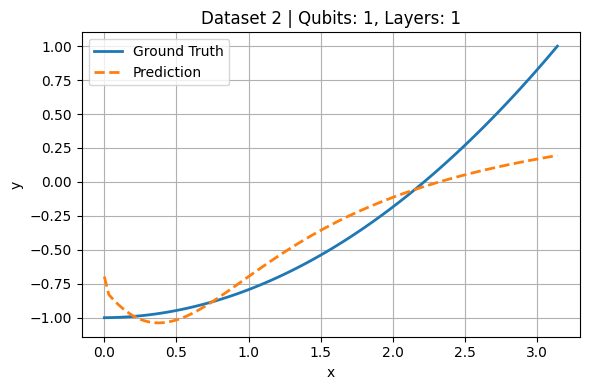

Model (1×1) Training: 100%|██████████| 200/200 [00:37<00:00,  5.35it/s, loss=0.345799]


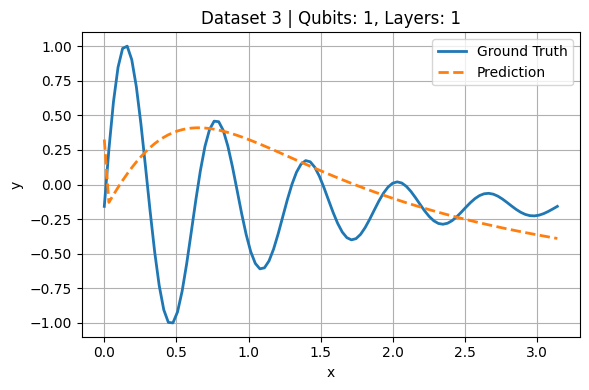

Model (1×1) Training: 100%|██████████| 200/200 [00:37<00:00,  5.32it/s, loss=0.137617]


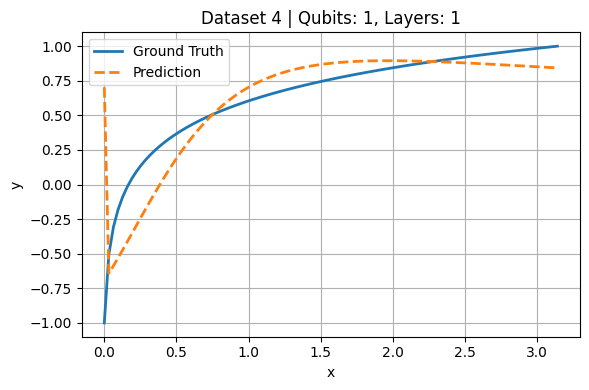

Model (1×1) Training: 100%|██████████| 200/200 [00:33<00:00,  5.90it/s, loss=0.083840]


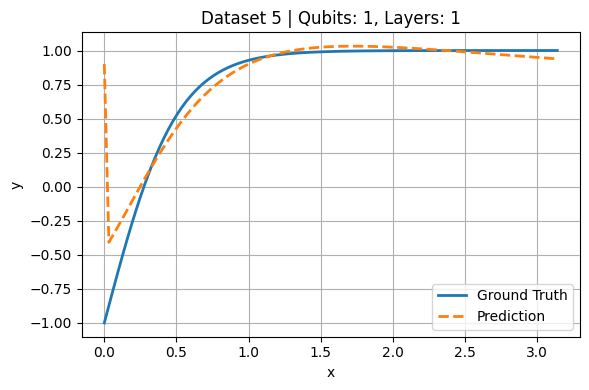

Model (1×1) Training: 100%|██████████| 200/200 [00:34<00:00,  5.87it/s, loss=0.112025]


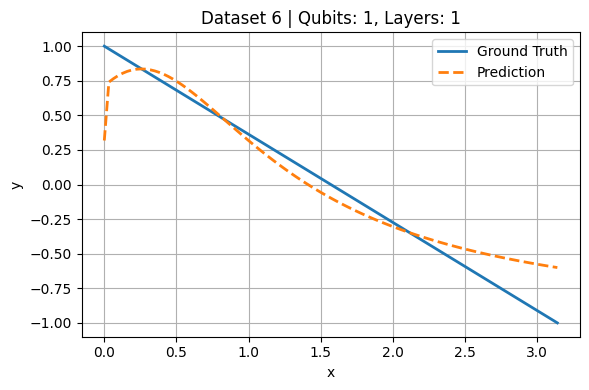

Model (1×1) Training: 100%|██████████| 200/200 [00:33<00:00,  5.93it/s, loss=0.561567]


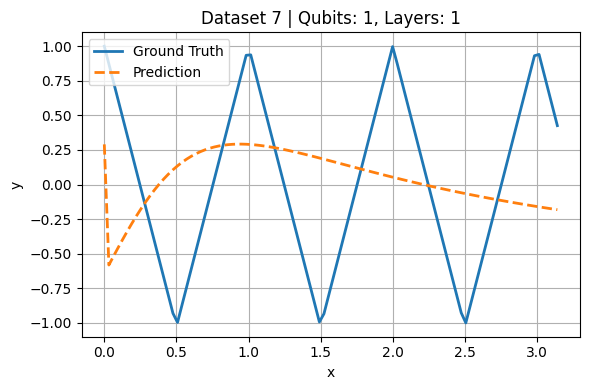

Model (1×1) Training: 100%|██████████| 200/200 [00:32<00:00,  6.15it/s, loss=0.196348]


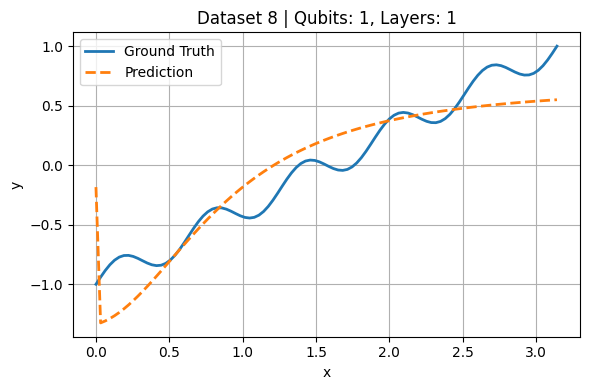

Model (1×1) Training: 100%|██████████| 200/200 [00:43<00:00,  4.63it/s, loss=0.212333]


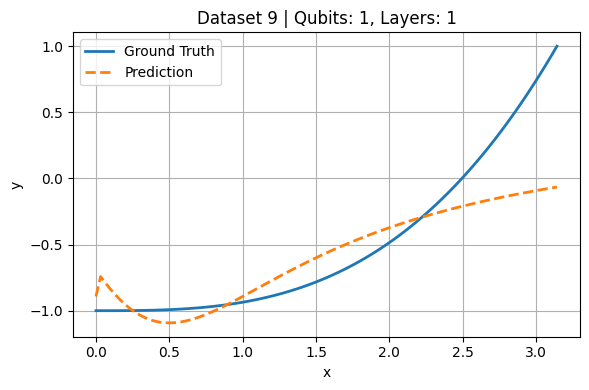

Model (2×1) Training: 100%|██████████| 200/200 [01:14<00:00,  2.69it/s, loss=0.612566]


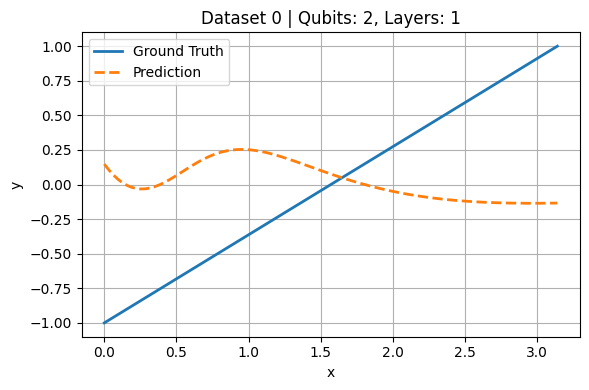

Model (2×1) Training: 100%|██████████| 200/200 [00:59<00:00,  3.37it/s, loss=0.465870]


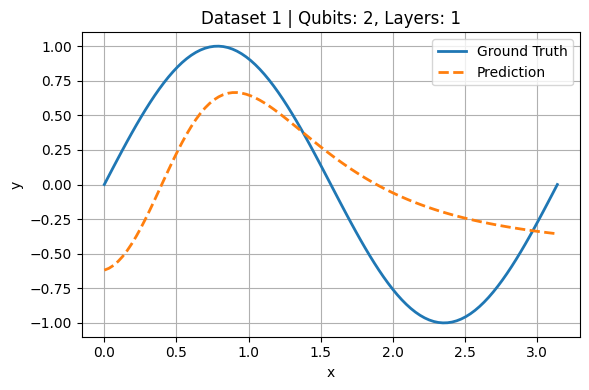

Model (2×1) Training: 100%|██████████| 200/200 [01:10<00:00,  2.82it/s, loss=0.358696]


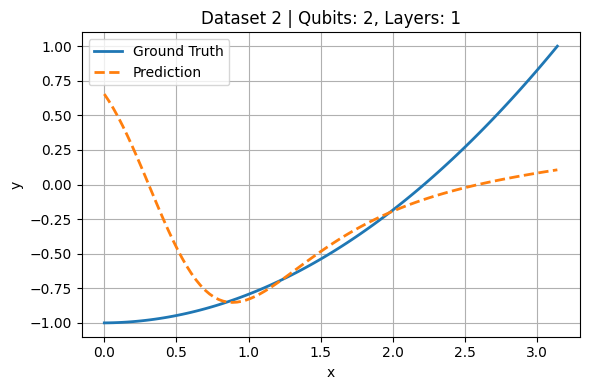

Model (2×1) Training: 100%|██████████| 200/200 [01:08<00:00,  2.93it/s, loss=0.246374]


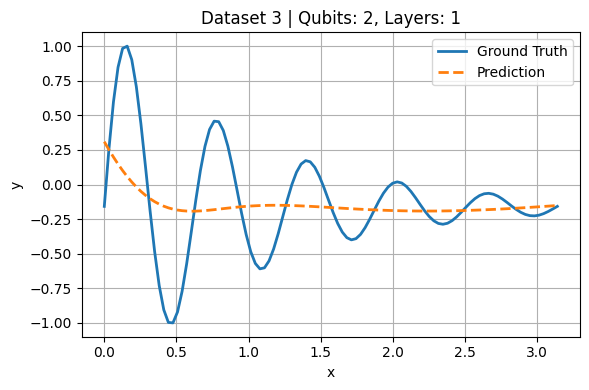

Model (2×1) Training: 100%|██████████| 200/200 [01:04<00:00,  3.08it/s, loss=0.162237]


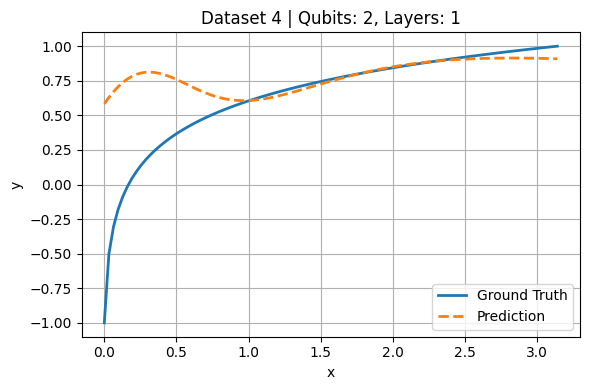

Model (2×1) Training: 100%|██████████| 200/200 [01:05<00:00,  3.06it/s, loss=0.199830]


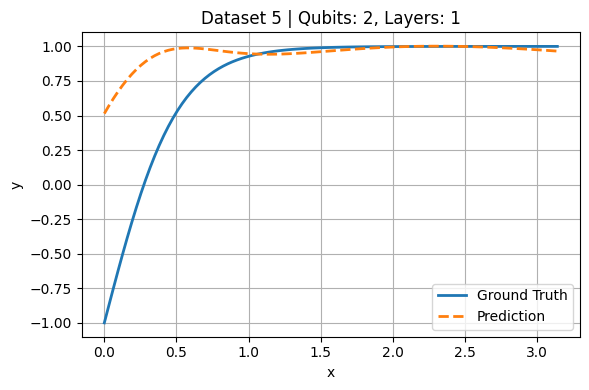

Model (2×1) Training: 100%|██████████| 200/200 [01:01<00:00,  3.25it/s, loss=0.326377]


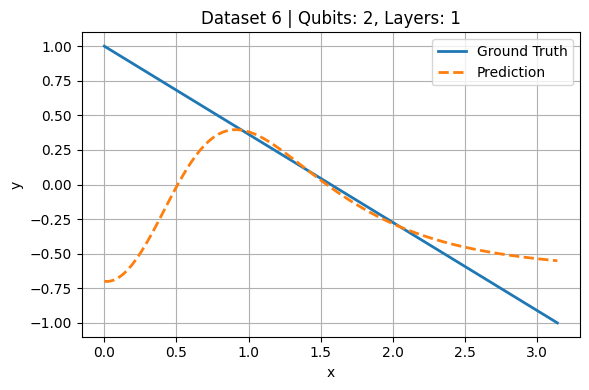

Model (2×1) Training: 100%|██████████| 200/200 [01:00<00:00,  3.31it/s, loss=0.502454]


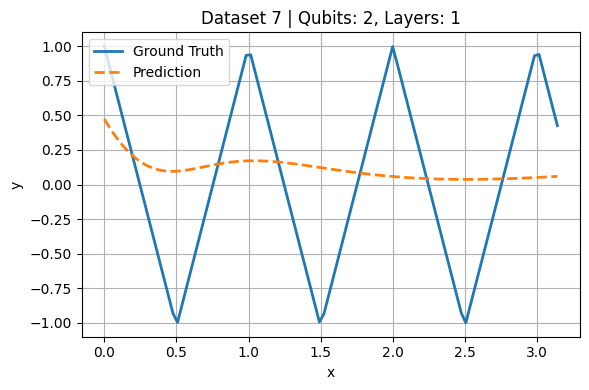

Model (2×1) Training: 100%|██████████| 200/200 [00:56<00:00,  3.55it/s, loss=0.584128]


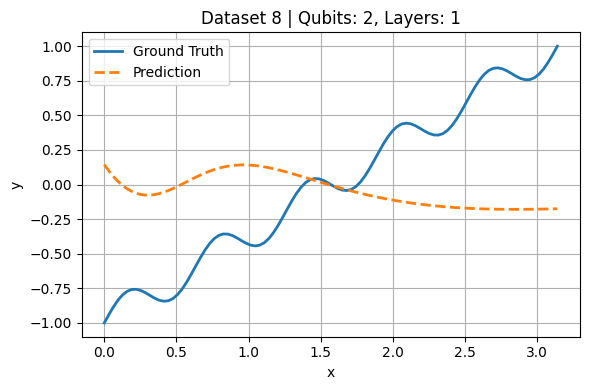

Model (2×1) Training: 100%|██████████| 200/200 [01:03<00:00,  3.16it/s, loss=0.343755]


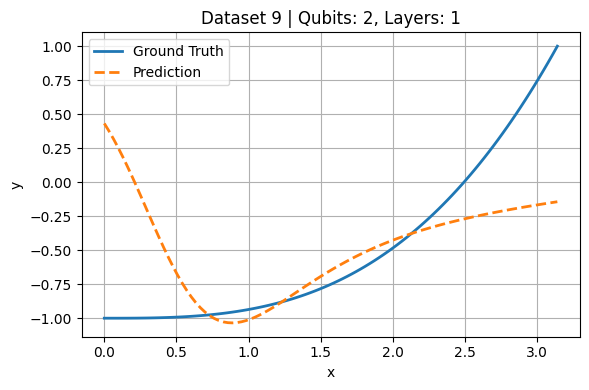

Model (3×1) Training: 100%|██████████| 200/200 [01:17<00:00,  2.59it/s, loss=0.148347]


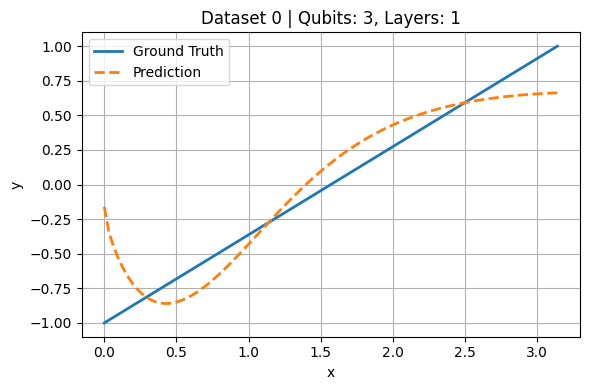

Model (3×1) Training: 100%|██████████| 200/200 [01:16<00:00,  2.60it/s, loss=0.292411]


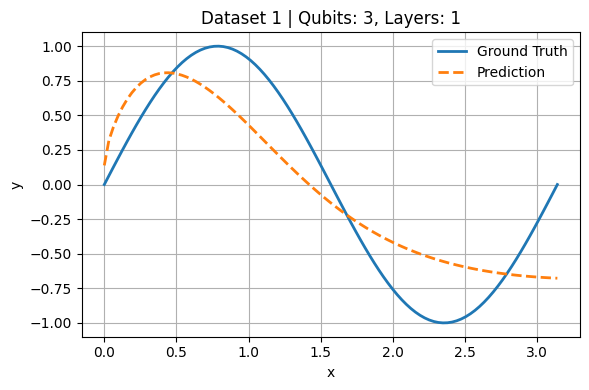

Model (3×1) Training: 100%|██████████| 200/200 [01:16<00:00,  2.61it/s, loss=0.190308]


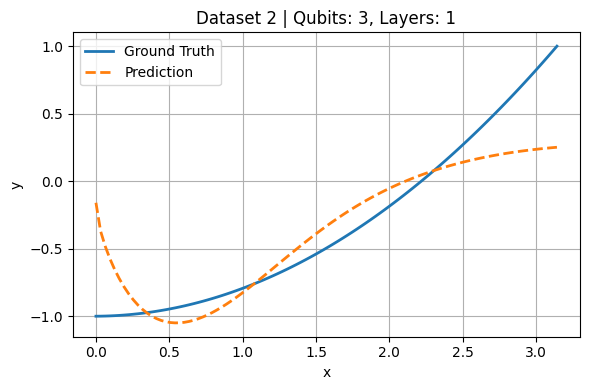

Model (3×1) Training: 100%|██████████| 200/200 [01:14<00:00,  2.68it/s, loss=0.246204]


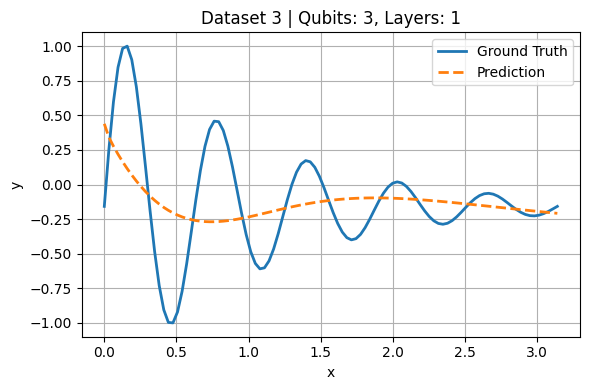

Model (3×1) Training: 100%|██████████| 200/200 [01:13<00:00,  2.72it/s, loss=0.139680]


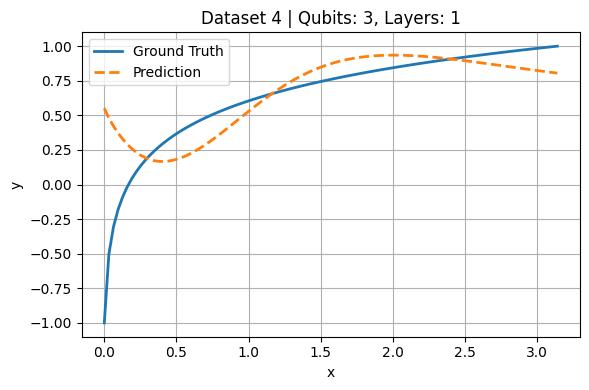

Model (3×1) Training: 100%|██████████| 200/200 [01:20<00:00,  2.47it/s, loss=0.094077]


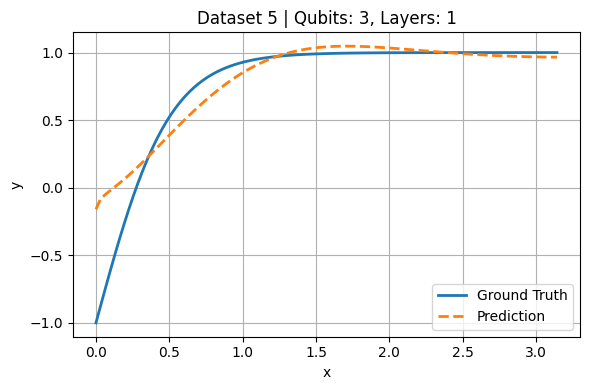

Model (3×1) Training: 100%|██████████| 200/200 [01:19<00:00,  2.51it/s, loss=0.135167]


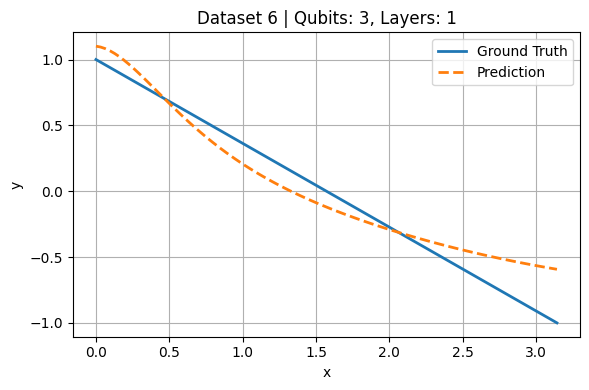

Model (3×1) Training: 100%|██████████| 200/200 [01:25<00:00,  2.34it/s, loss=0.501459]


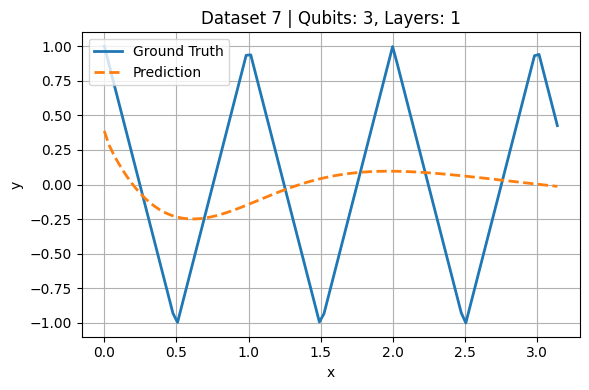

Model (3×1) Training: 100%|██████████| 200/200 [01:24<00:00,  2.38it/s, loss=0.145707]


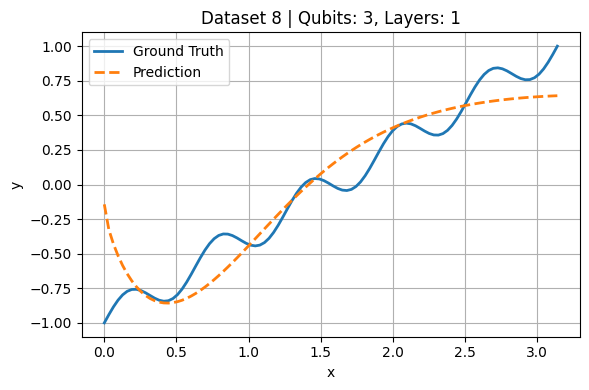

Model (3×1) Training: 100%|██████████| 200/200 [01:21<00:00,  2.46it/s, loss=0.225001]


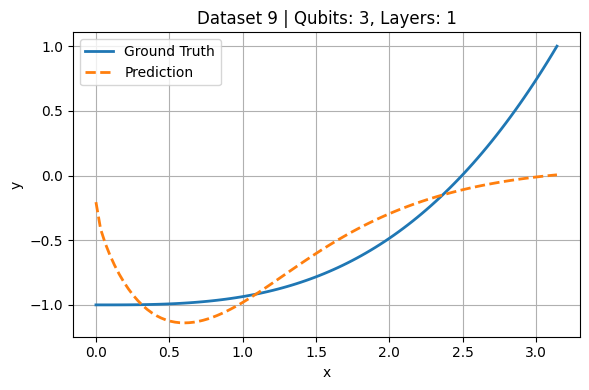

Model (4×1) Training: 100%|██████████| 200/200 [01:38<00:00,  2.03it/s, loss=0.328503]


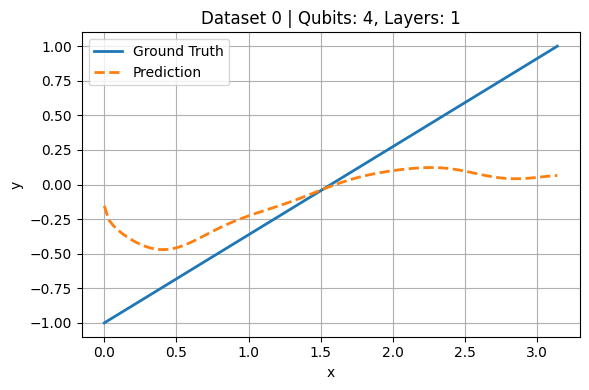

Model (4×1) Training: 100%|██████████| 200/200 [01:44<00:00,  1.91it/s, loss=0.301299]


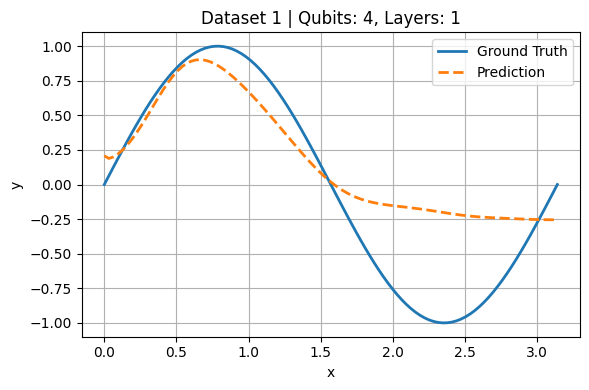

Model (4×1) Training: 100%|██████████| 200/200 [01:39<00:00,  2.01it/s, loss=0.329951]


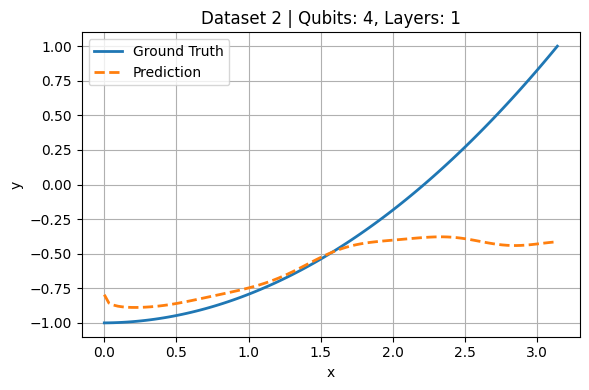

Model (4×1) Training: 100%|██████████| 200/200 [01:38<00:00,  2.03it/s, loss=0.262893]


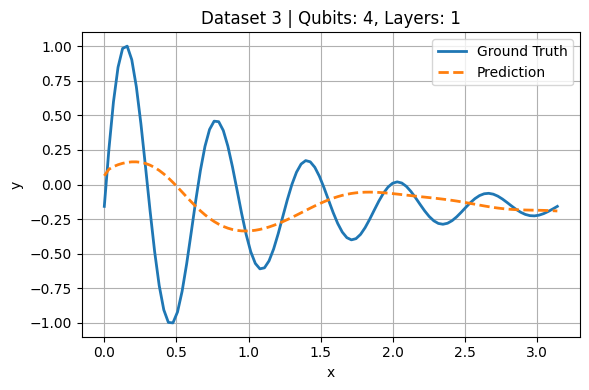

Model (4×1) Training: 100%|██████████| 200/200 [01:39<00:00,  2.00it/s, loss=0.105742]


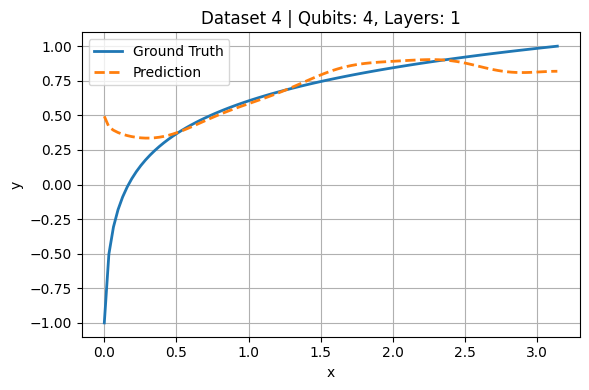

Model (4×1) Training: 100%|██████████| 200/200 [01:38<00:00,  2.02it/s, loss=0.133442]


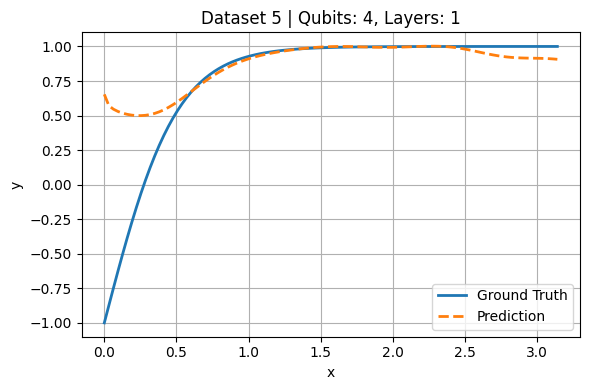

Model (4×1) Training: 100%|██████████| 200/200 [01:37<00:00,  2.06it/s, loss=0.209983]


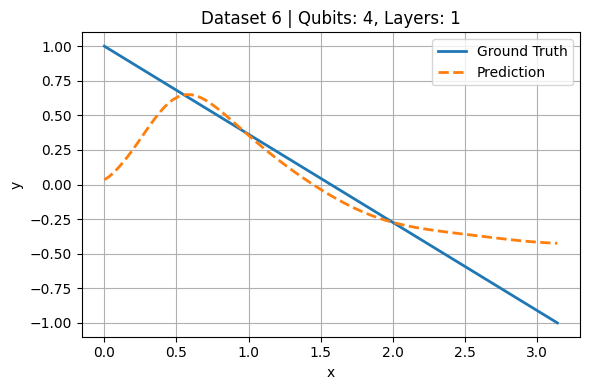

Model (4×1) Training: 100%|██████████| 200/200 [01:46<00:00,  1.88it/s, loss=0.574979]


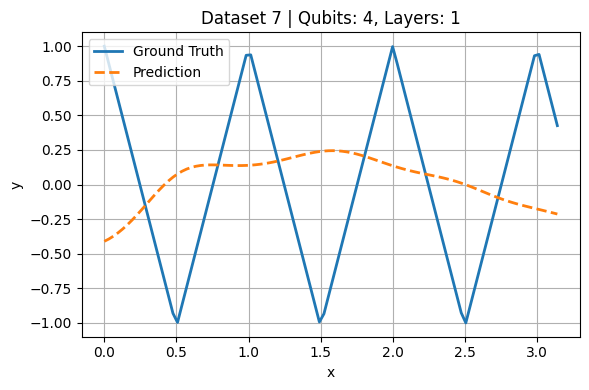

Model (4×1) Training: 100%|██████████| 200/200 [01:42<00:00,  1.95it/s, loss=0.325949]


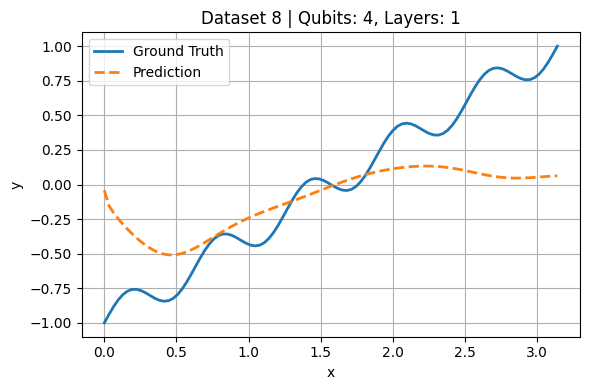

Model (4×1) Training: 100%|██████████| 200/200 [01:43<00:00,  1.94it/s, loss=0.280851]


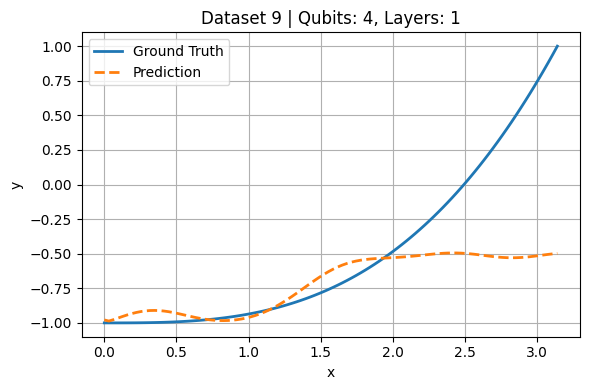

Model (5×1) Training: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s, loss=0.149462]


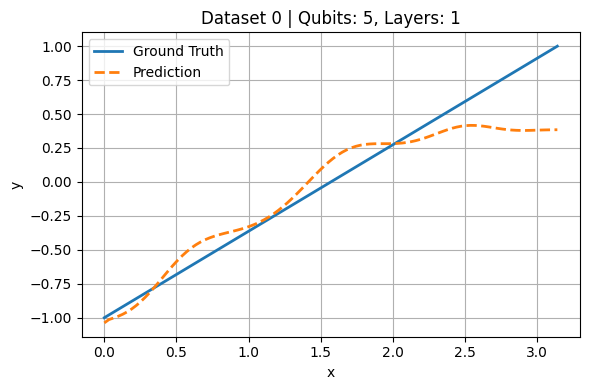

Model (5×1) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.298460]


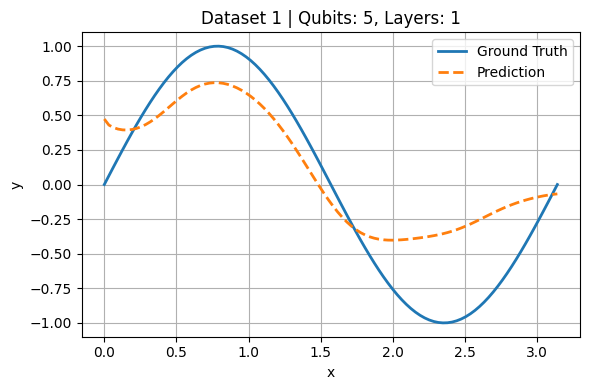

Model (5×1) Training: 100%|██████████| 200/200 [02:06<00:00,  1.58it/s, loss=0.323315]


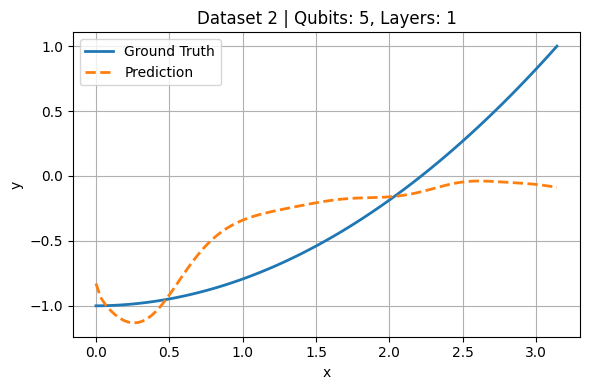

Model (5×1) Training: 100%|██████████| 200/200 [02:09<00:00,  1.55it/s, loss=0.252140]


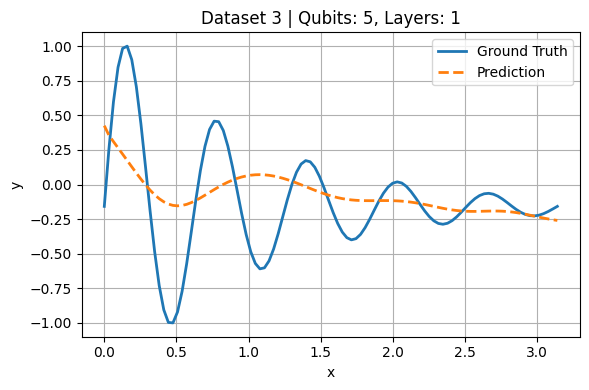

Model (5×1) Training: 100%|██████████| 200/200 [02:07<00:00,  1.57it/s, loss=0.048721]


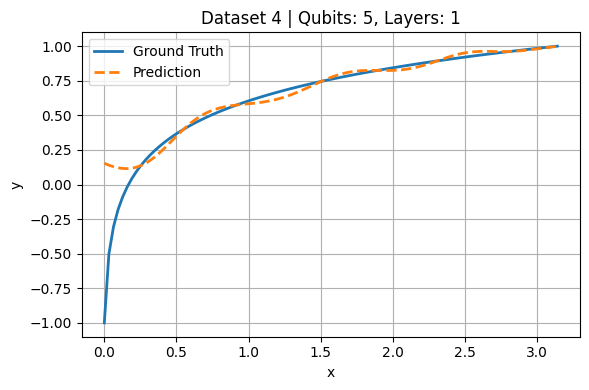

Model (5×1) Training: 100%|██████████| 200/200 [01:59<00:00,  1.68it/s, loss=0.113034]


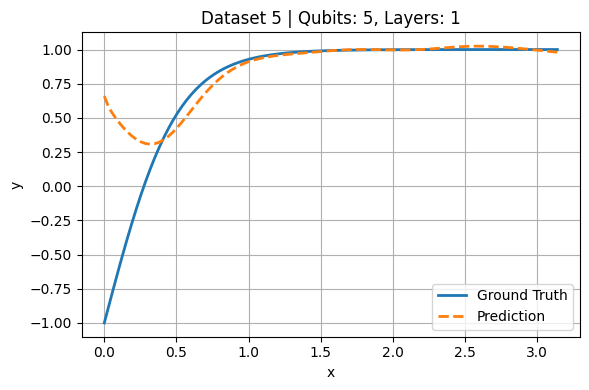

Model (5×1) Training: 100%|██████████| 200/200 [02:10<00:00,  1.53it/s, loss=0.143677]


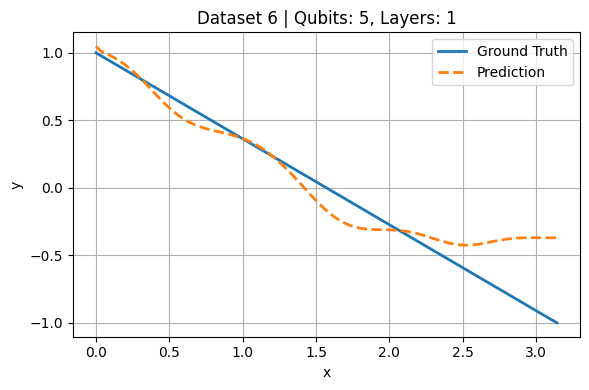

Model (5×1) Training: 100%|██████████| 200/200 [02:07<00:00,  1.57it/s, loss=0.483030]


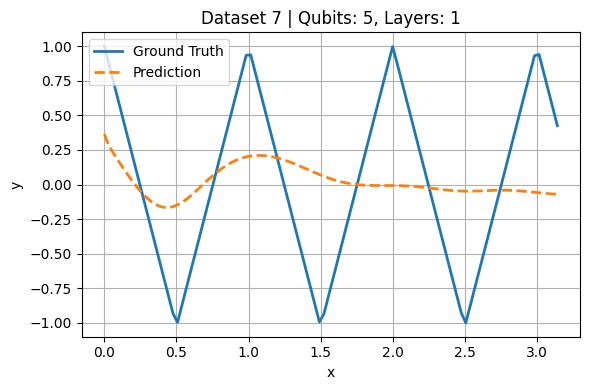

Model (5×1) Training: 100%|██████████| 200/200 [02:05<00:00,  1.59it/s, loss=0.171554]


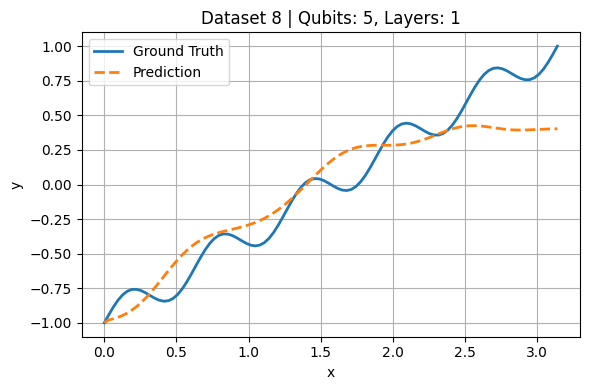

Model (5×1) Training: 100%|██████████| 200/200 [02:05<00:00,  1.59it/s, loss=0.360265]


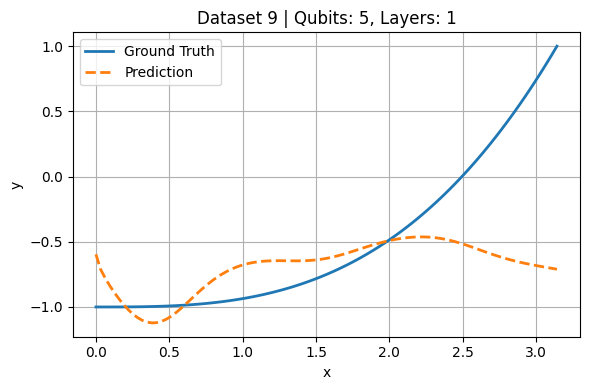

Model (1×2) Training: 100%|██████████| 200/200 [00:55<00:00,  3.59it/s, loss=0.111275]


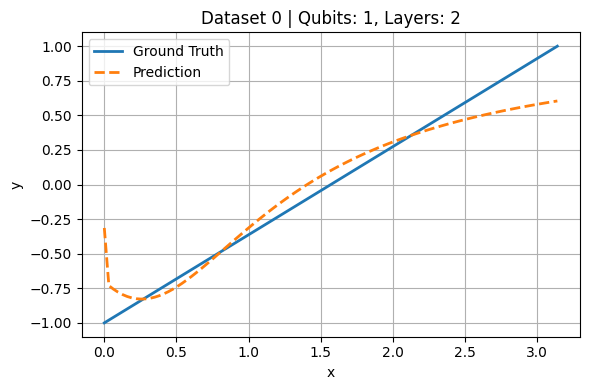

Model (1×2) Training: 100%|██████████| 200/200 [00:55<00:00,  3.58it/s, loss=0.361821]


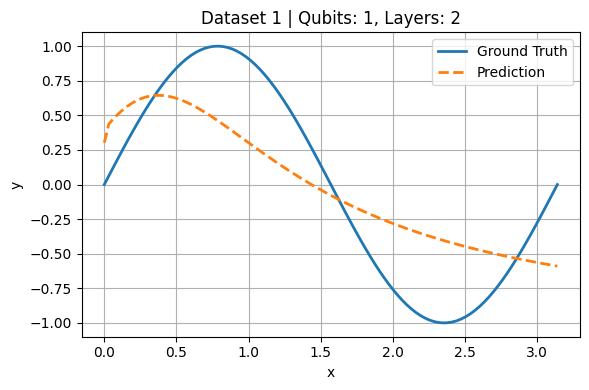

Model (1×2) Training: 100%|██████████| 200/200 [00:51<00:00,  3.87it/s, loss=0.186128]


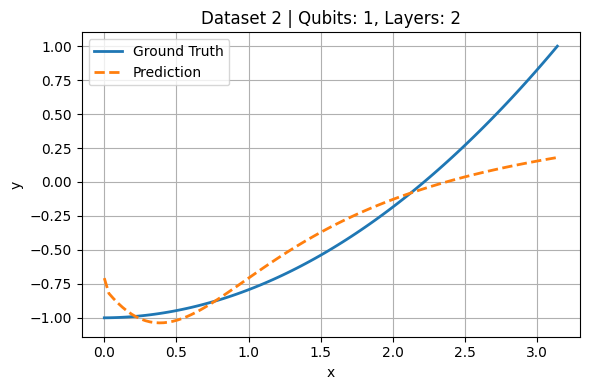

Model (1×2) Training: 100%|██████████| 200/200 [00:48<00:00,  4.15it/s, loss=0.322581]


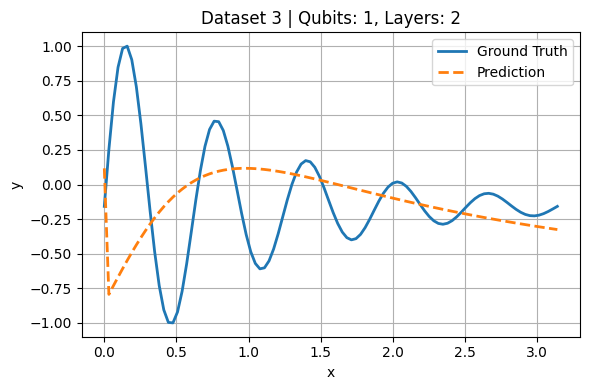

Model (1×2) Training: 100%|██████████| 200/200 [00:48<00:00,  4.11it/s, loss=0.111636]


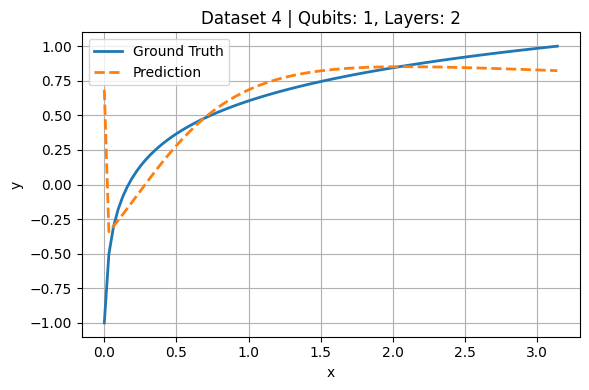

Model (1×2) Training: 100%|██████████| 200/200 [00:49<00:00,  4.08it/s, loss=0.075639]


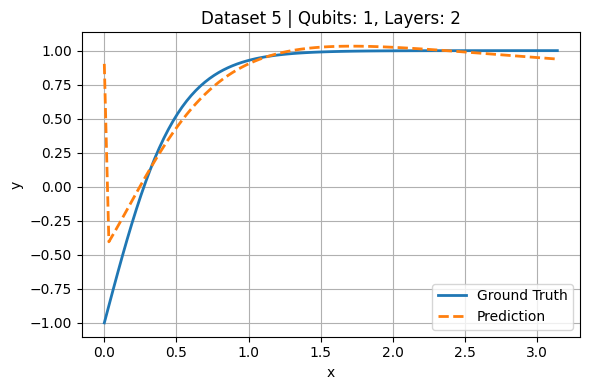

Model (1×2) Training: 100%|██████████| 200/200 [00:49<00:00,  4.01it/s, loss=0.111340]


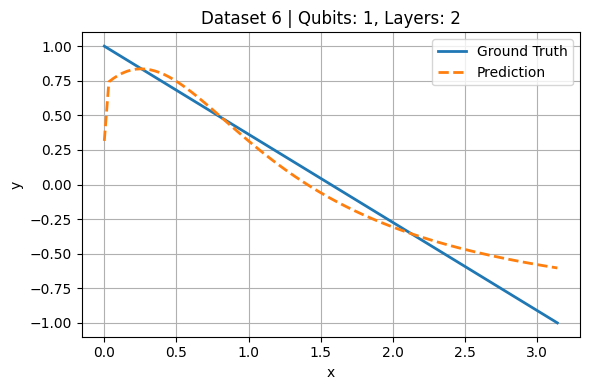

Model (1×2) Training: 100%|██████████| 200/200 [00:48<00:00,  4.15it/s, loss=0.558383]


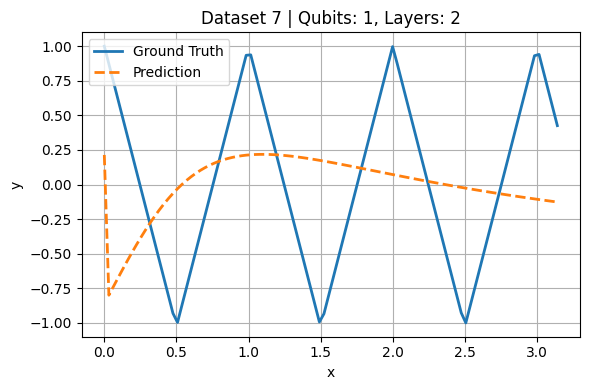

Model (1×2) Training: 100%|██████████| 200/200 [00:49<00:00,  4.08it/s, loss=0.125185]


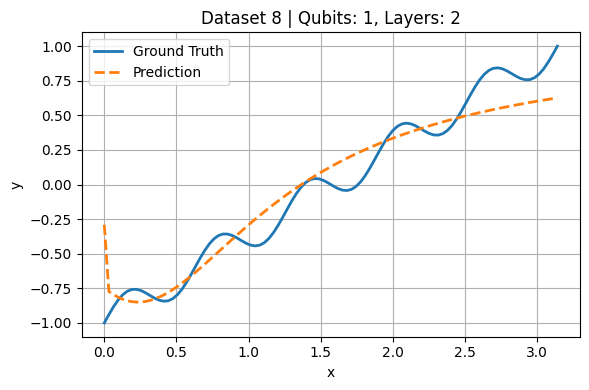

Model (1×2) Training: 100%|██████████| 200/200 [00:48<00:00,  4.09it/s, loss=0.227221]


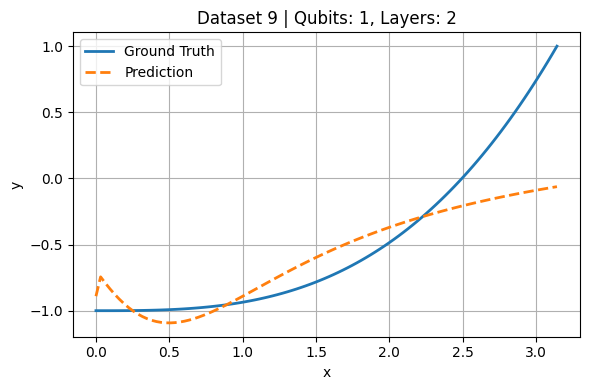

Model (2×2) Training: 100%|██████████| 200/200 [01:33<00:00,  2.14it/s, loss=0.131632]


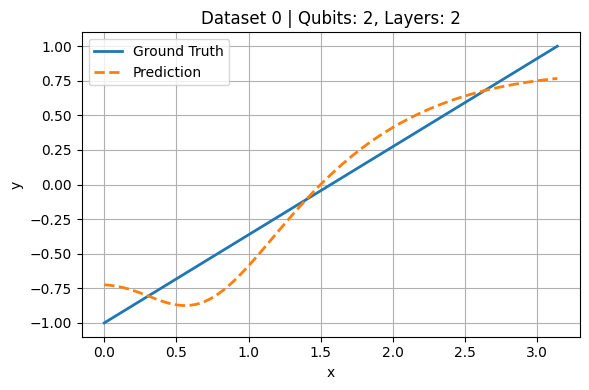

Model (2×2) Training: 100%|██████████| 200/200 [01:28<00:00,  2.26it/s, loss=0.215328]


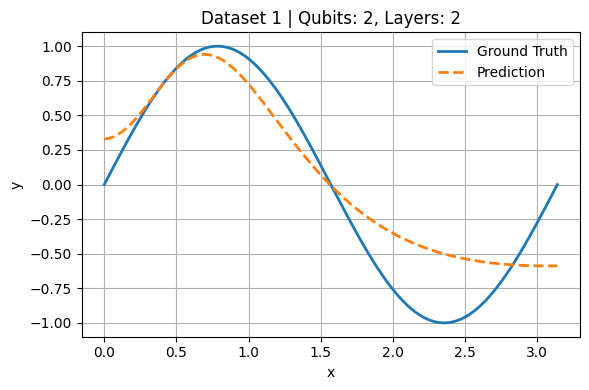

Model (2×2) Training: 100%|██████████| 200/200 [01:26<00:00,  2.31it/s, loss=0.116112]


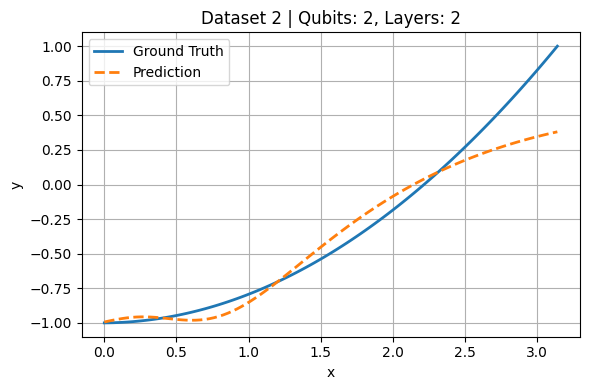

Model (2×2) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.247888]


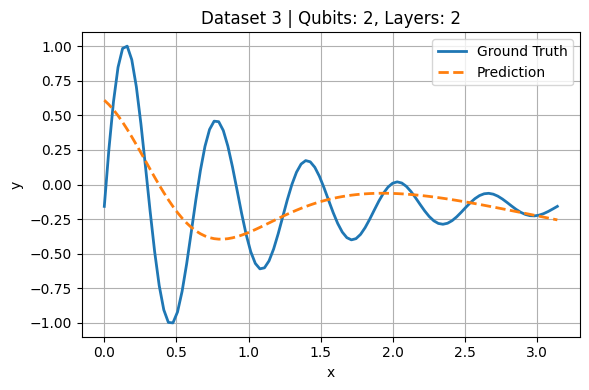

Model (2×2) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.181336]


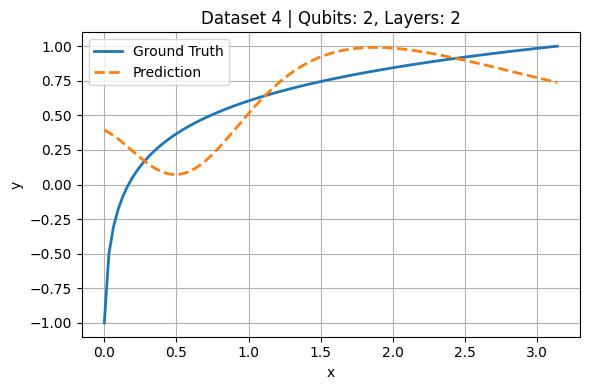

Model (2×2) Training: 100%|██████████| 200/200 [01:27<00:00,  2.28it/s, loss=0.142873]


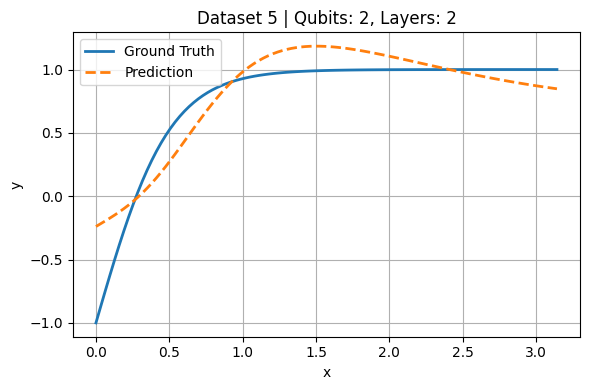

Model (2×2) Training: 100%|██████████| 200/200 [01:26<00:00,  2.32it/s, loss=0.068116]


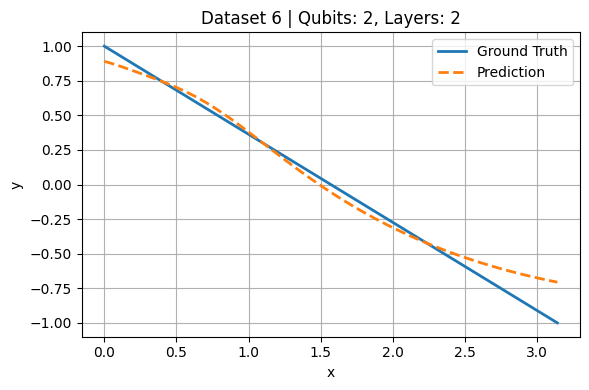

Model (2×2) Training: 100%|██████████| 200/200 [01:26<00:00,  2.32it/s, loss=0.495802]


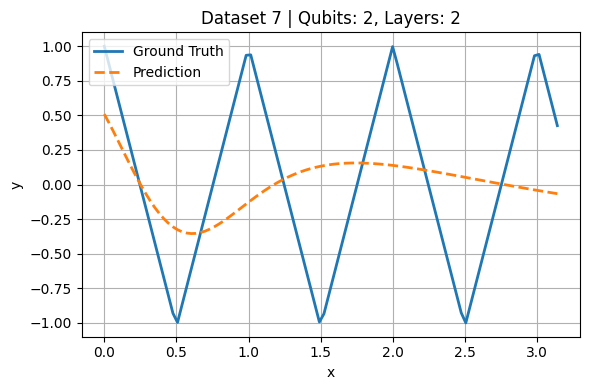

Model (2×2) Training: 100%|██████████| 200/200 [01:26<00:00,  2.31it/s, loss=0.119228]


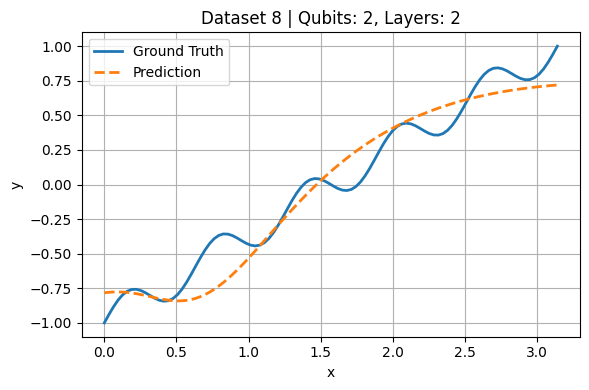

Model (2×2) Training: 100%|██████████| 200/200 [01:26<00:00,  2.32it/s, loss=0.260607]


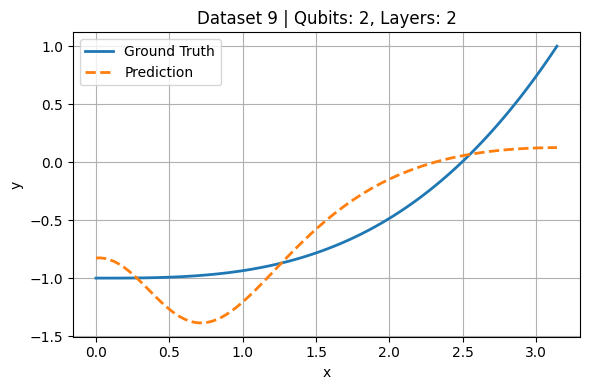

Model (3×2) Training: 100%|██████████| 200/200 [01:59<00:00,  1.68it/s, loss=0.113039]


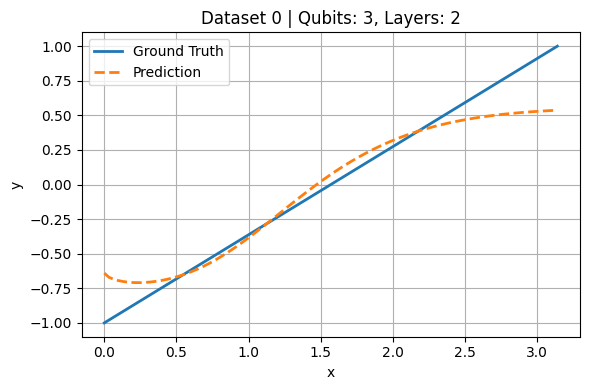

Model (3×2) Training: 100%|██████████| 200/200 [02:02<00:00,  1.64it/s, loss=0.310175]


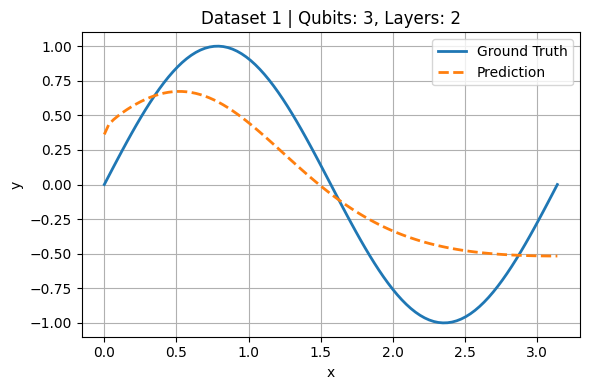

Model (3×2) Training: 100%|██████████| 200/200 [02:03<00:00,  1.61it/s, loss=0.161738]


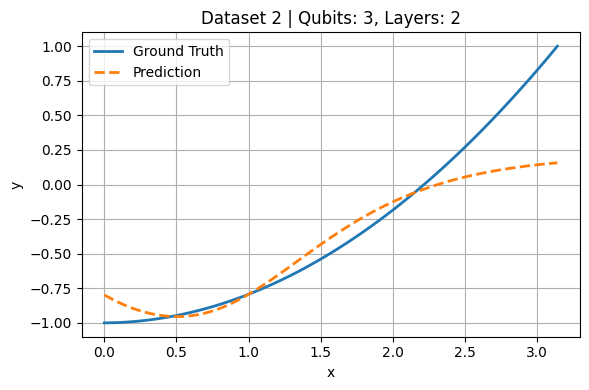

Model (3×2) Training: 100%|██████████| 200/200 [02:03<00:00,  1.61it/s, loss=0.244955]


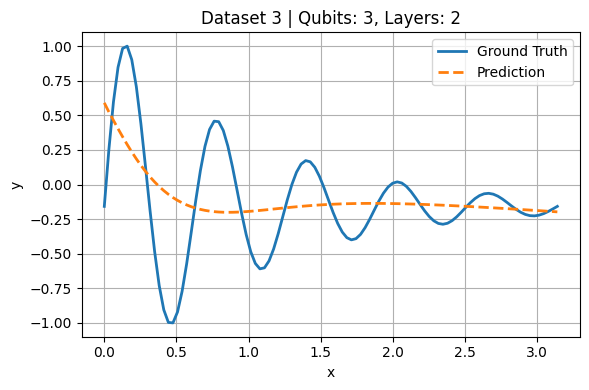

Model (3×2) Training: 100%|██████████| 200/200 [02:06<00:00,  1.58it/s, loss=0.110755]


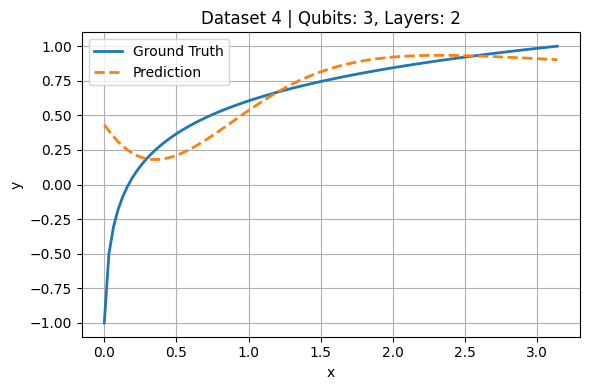

Model (3×2) Training: 100%|██████████| 200/200 [01:59<00:00,  1.67it/s, loss=0.156527]


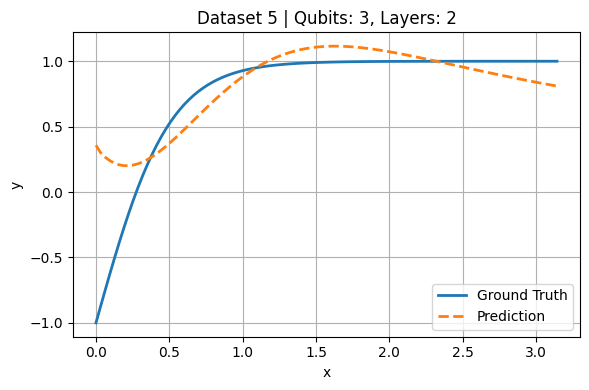

Model (3×2) Training: 100%|██████████| 200/200 [02:00<00:00,  1.67it/s, loss=0.114197]


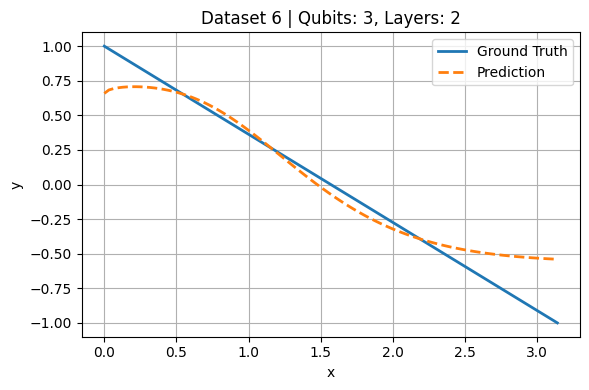

Model (3×2) Training: 100%|██████████| 200/200 [02:00<00:00,  1.66it/s, loss=0.494123]


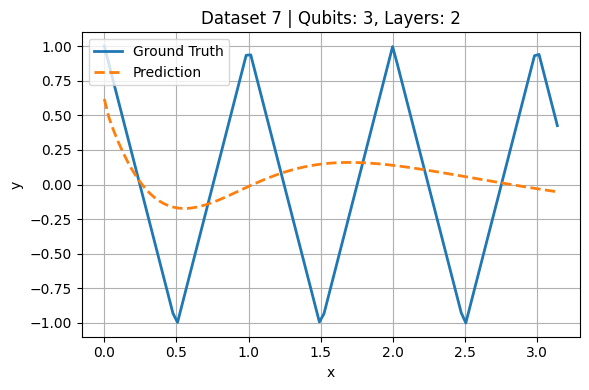

Model (3×2) Training: 100%|██████████| 200/200 [02:00<00:00,  1.66it/s, loss=0.130766]


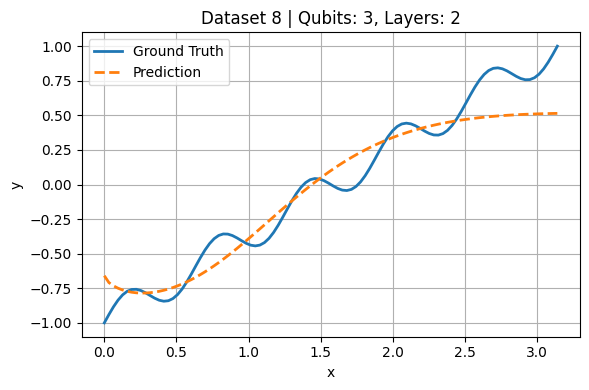

Model (3×2) Training: 100%|██████████| 200/200 [01:59<00:00,  1.67it/s, loss=0.218217]


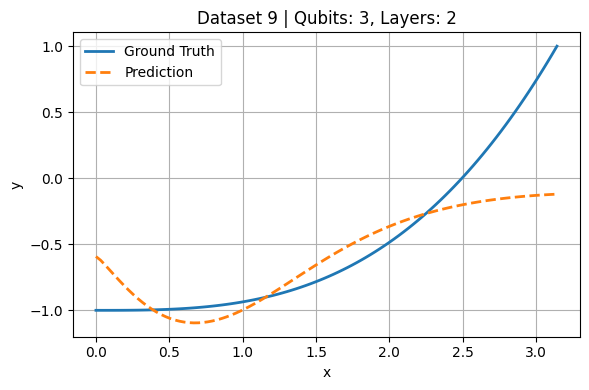

Model (4×2) Training: 100%|██████████| 200/200 [02:32<00:00,  1.31it/s, loss=0.095727]


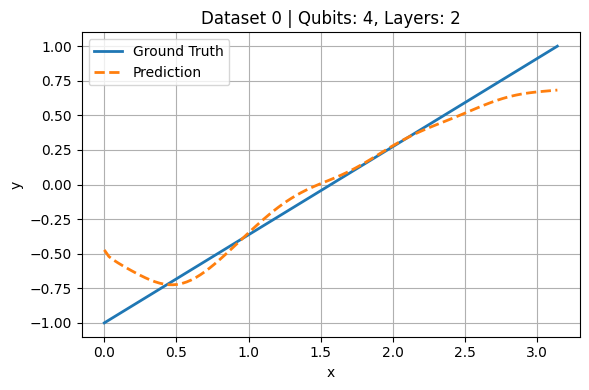

Model (4×2) Training: 100%|██████████| 200/200 [02:32<00:00,  1.31it/s, loss=0.282461]


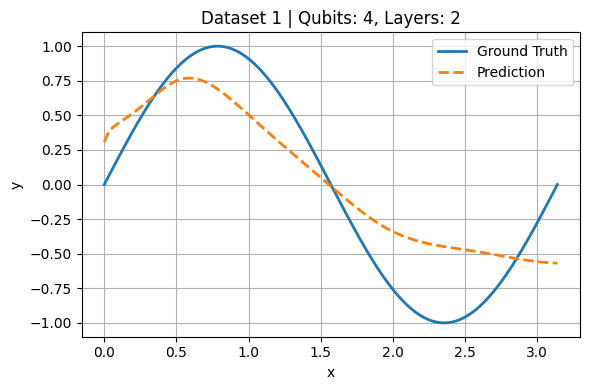

Model (4×2) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.143605]


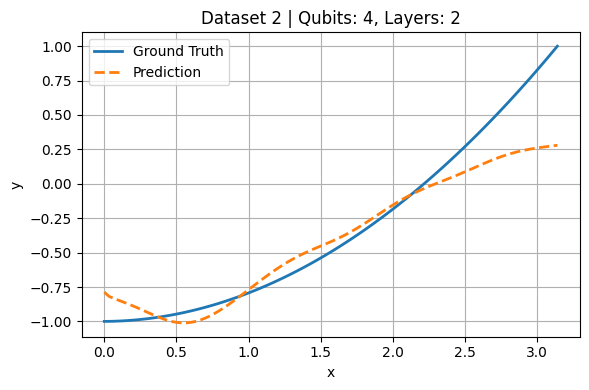

Model (4×2) Training: 100%|██████████| 200/200 [02:34<00:00,  1.30it/s, loss=0.255592]


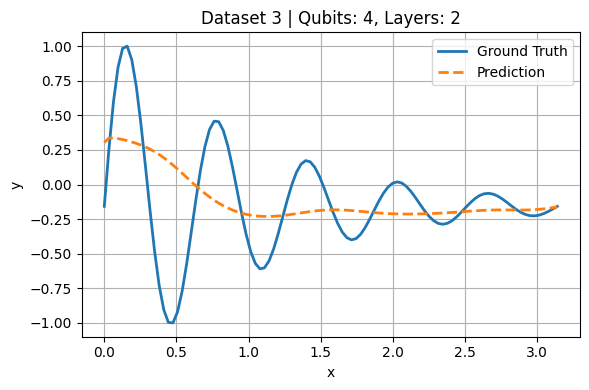

Model (4×2) Training: 100%|██████████| 200/200 [02:34<00:00,  1.29it/s, loss=0.084728]


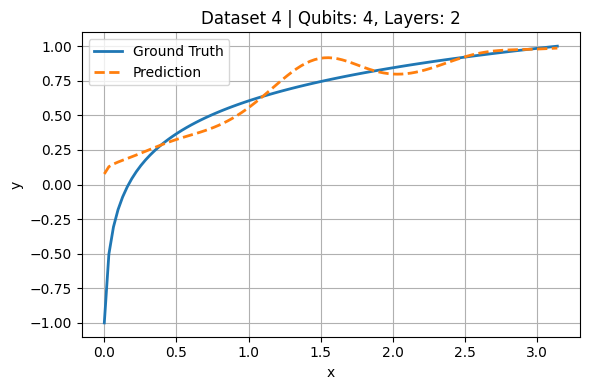

Model (4×2) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.128540]


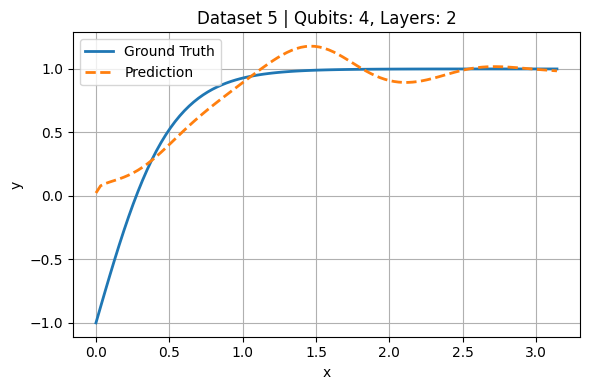

Model (4×2) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.113392]


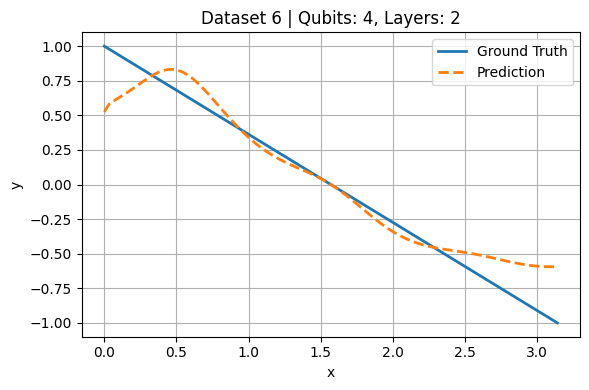

Model (4×2) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.516673]


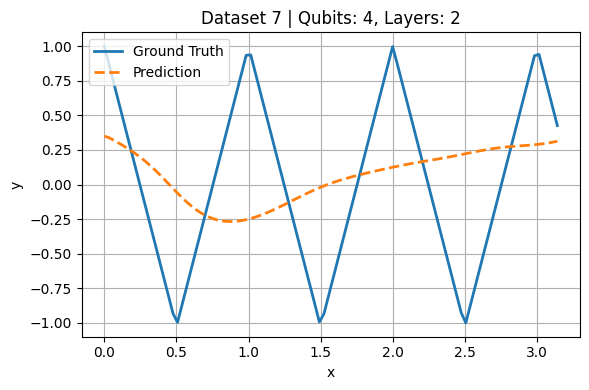

Model (4×2) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.118060]


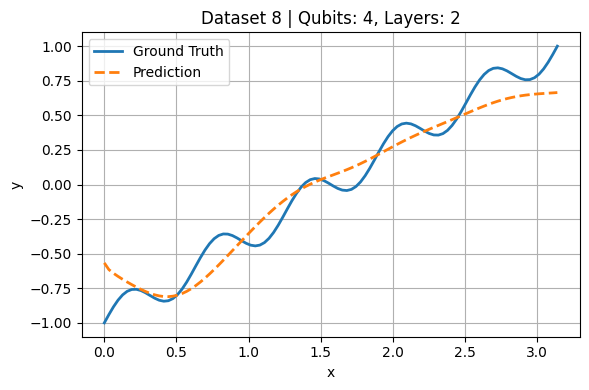

Model (4×2) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.163330]


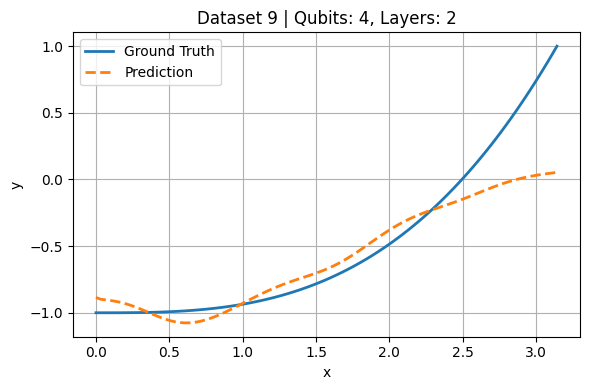

Model (5×2) Training: 100%|██████████| 200/200 [03:13<00:00,  1.04it/s, loss=0.217300]


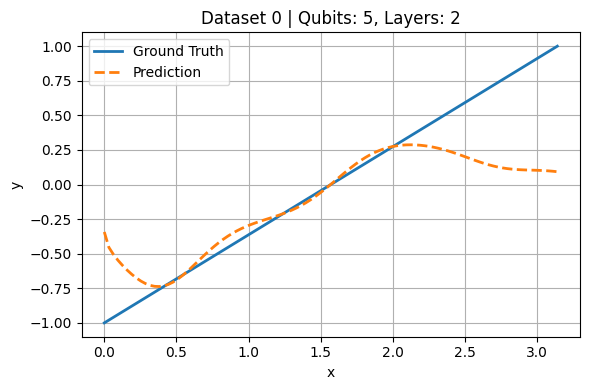

Model (5×2) Training: 100%|██████████| 200/200 [03:12<00:00,  1.04it/s, loss=0.247265]


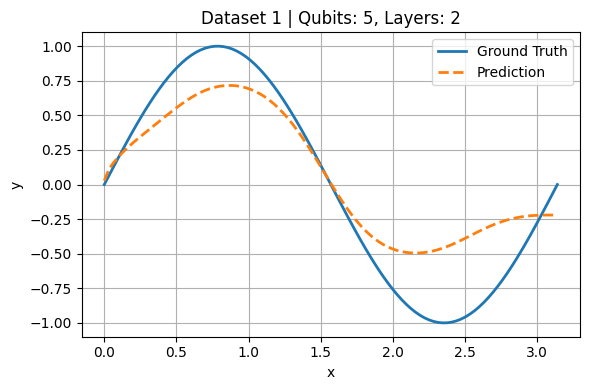

Model (5×2) Training: 100%|██████████| 200/200 [03:13<00:00,  1.04it/s, loss=0.254574]


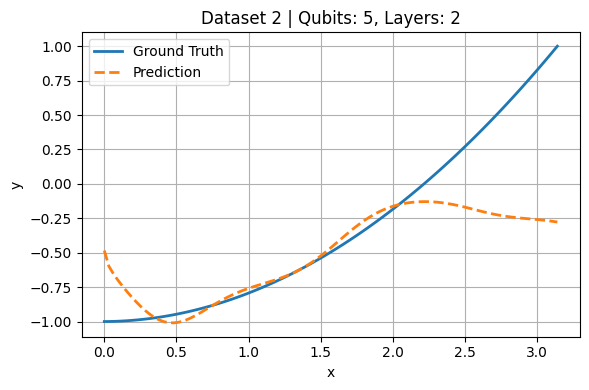

Model (5×2) Training: 100%|██████████| 200/200 [03:12<00:00,  1.04it/s, loss=0.250720]


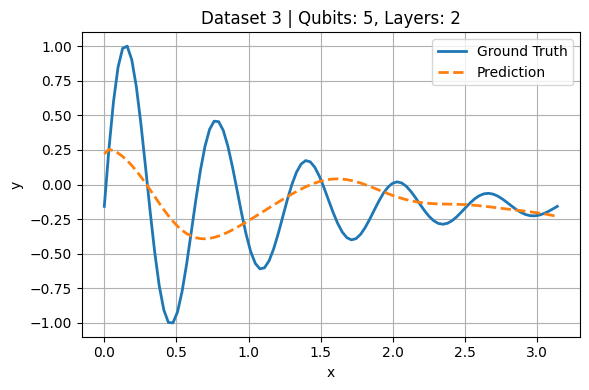

Model (5×2) Training: 100%|██████████| 200/200 [03:13<00:00,  1.04it/s, loss=0.080719]


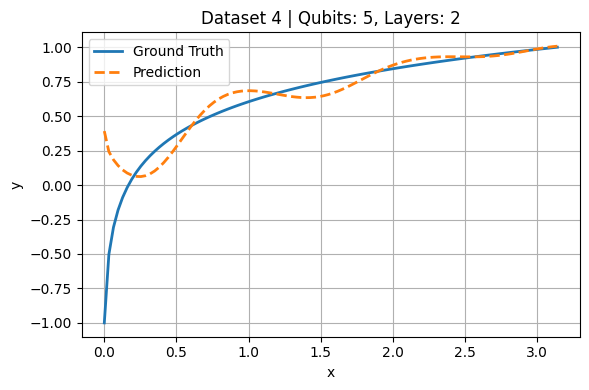

Model (5×2) Training: 100%|██████████| 200/200 [03:13<00:00,  1.04it/s, loss=0.090489]


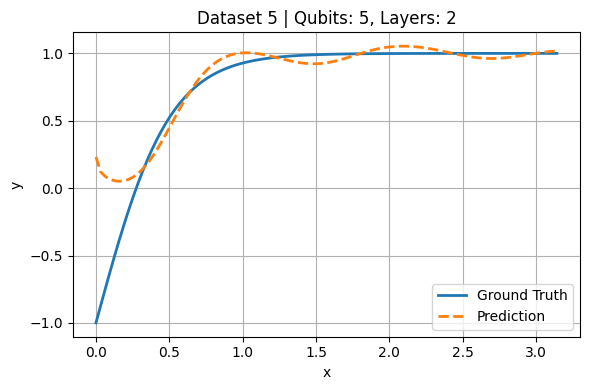

Model (5×2) Training: 100%|██████████| 200/200 [03:18<00:00,  1.01it/s, loss=0.274513]


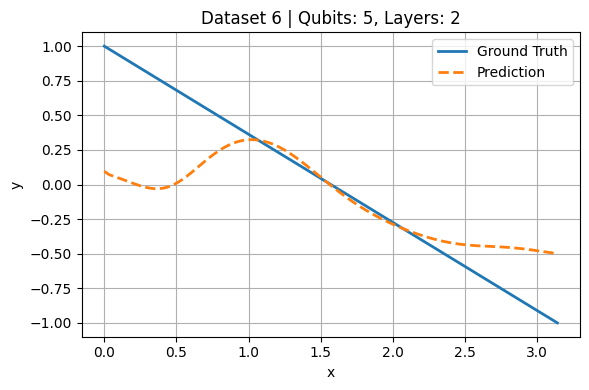

Model (5×2) Training: 100%|██████████| 200/200 [03:09<00:00,  1.06it/s, loss=0.496744]


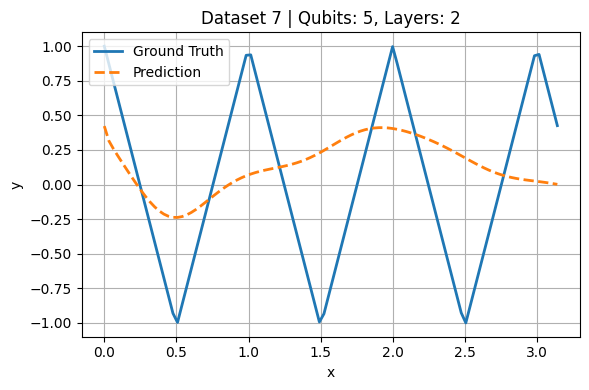

Model (5×2) Training: 100%|██████████| 200/200 [03:11<00:00,  1.05it/s, loss=0.237097]


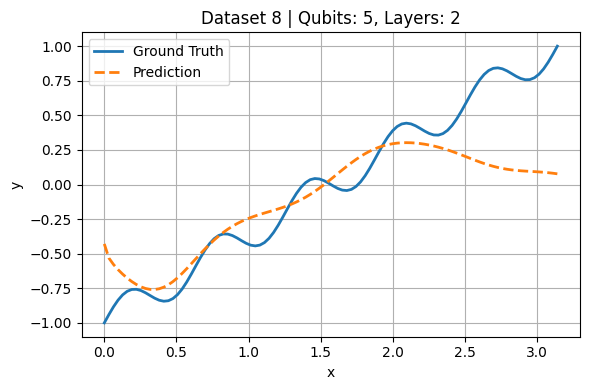

Model (5×2) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.268203]


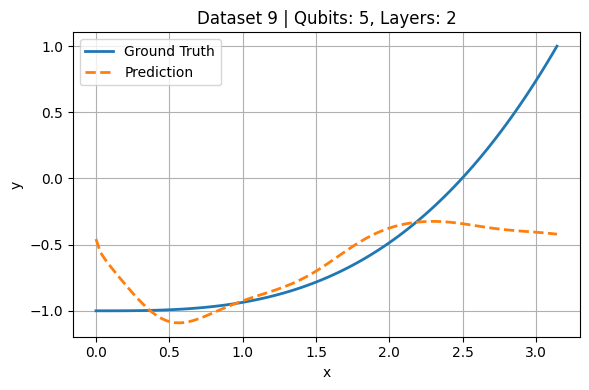

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.113766]


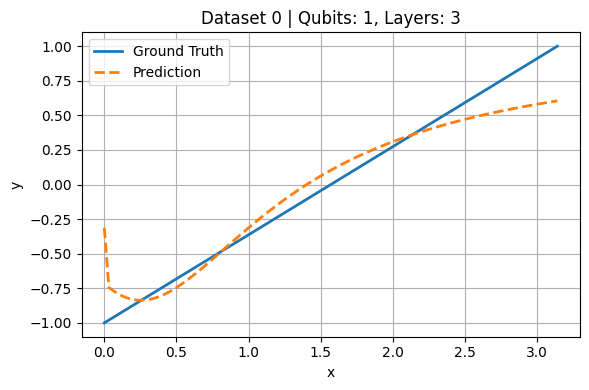

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.374622]


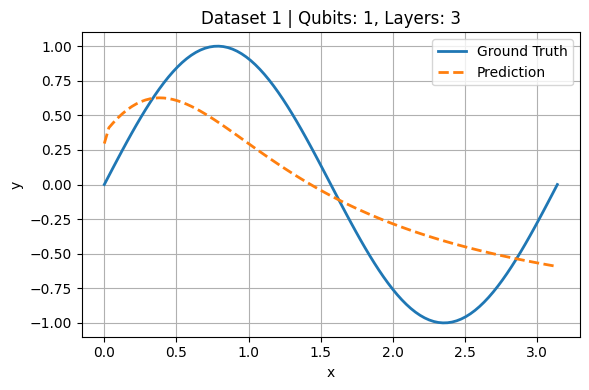

Model (1×3) Training: 100%|██████████| 200/200 [01:02<00:00,  3.22it/s, loss=0.184357]


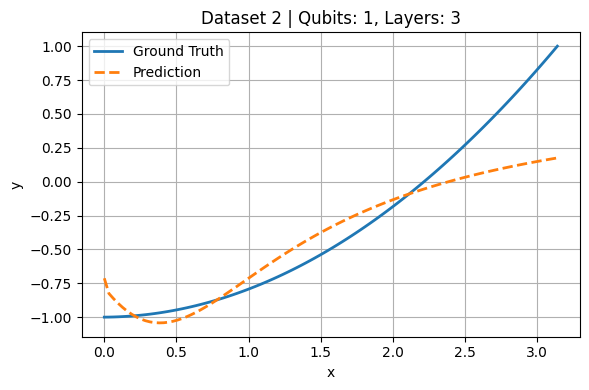

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.309778]


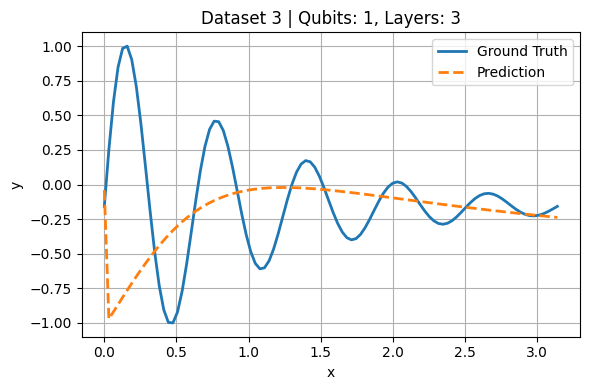

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.24it/s, loss=0.056989]


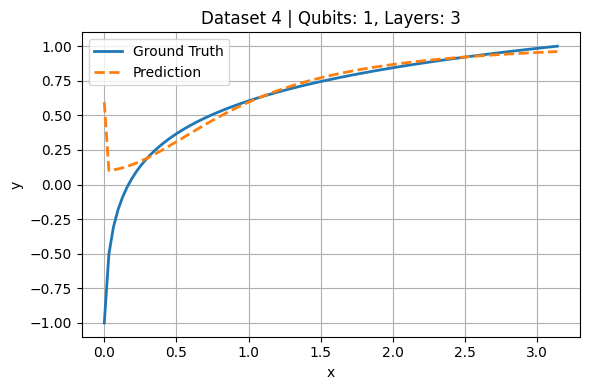

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.078830]


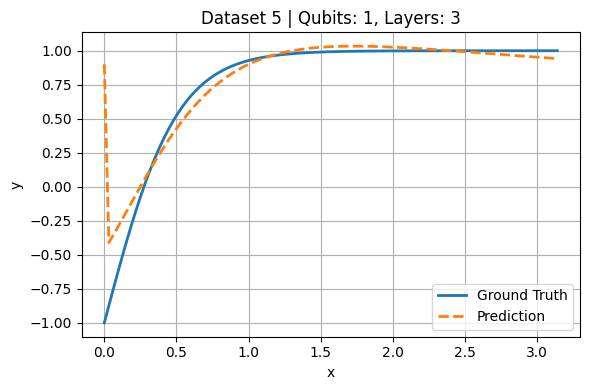

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.24it/s, loss=0.112421]


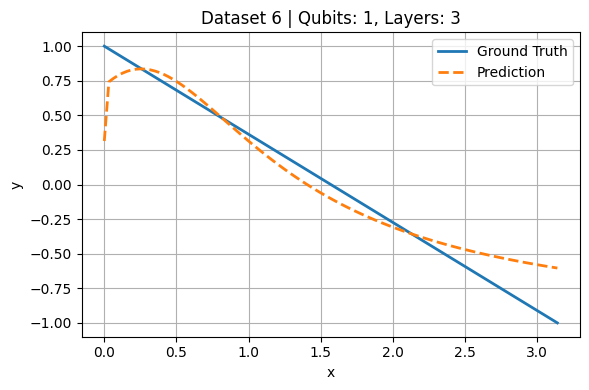

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.556390]


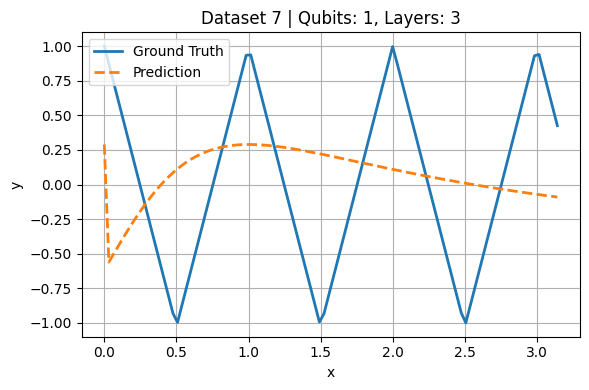

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.24it/s, loss=0.124614]


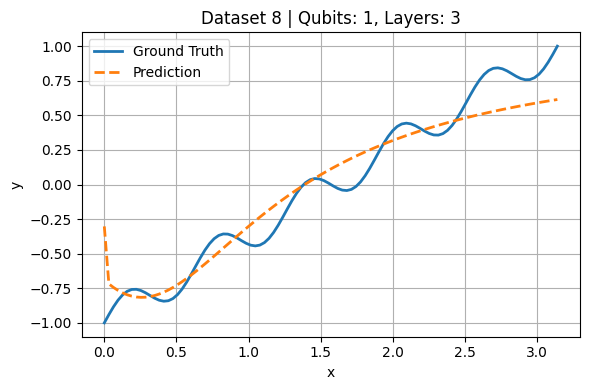

Model (1×3) Training: 100%|██████████| 200/200 [01:01<00:00,  3.23it/s, loss=0.225241]


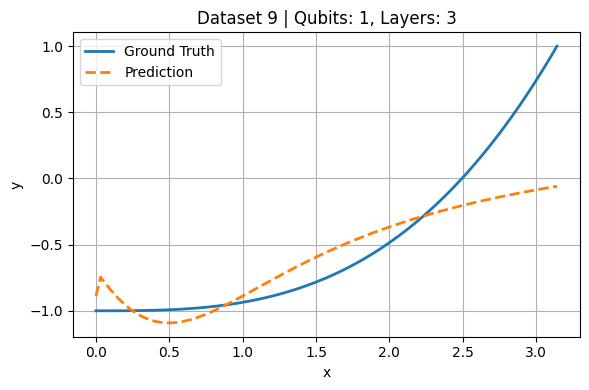

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.061280]


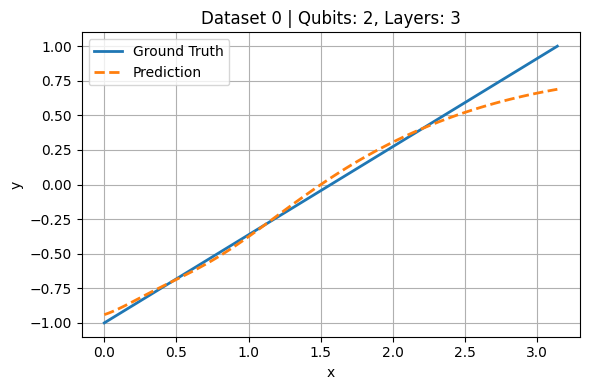

Model (2×3) Training: 100%|██████████| 200/200 [02:05<00:00,  1.60it/s, loss=0.199801]


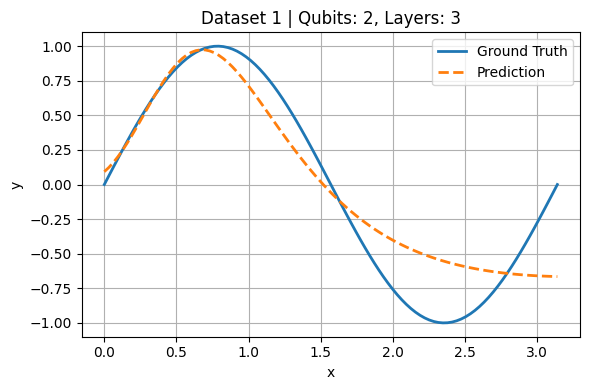

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.112960]


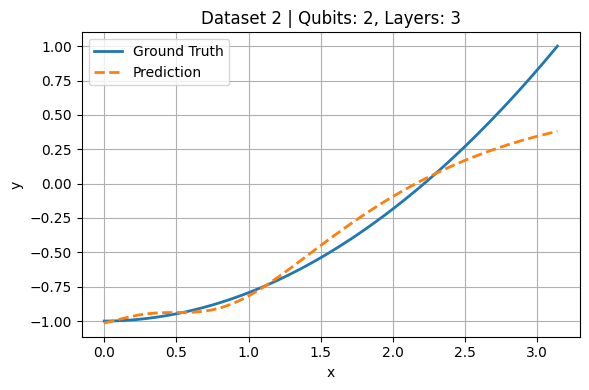

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.280217]


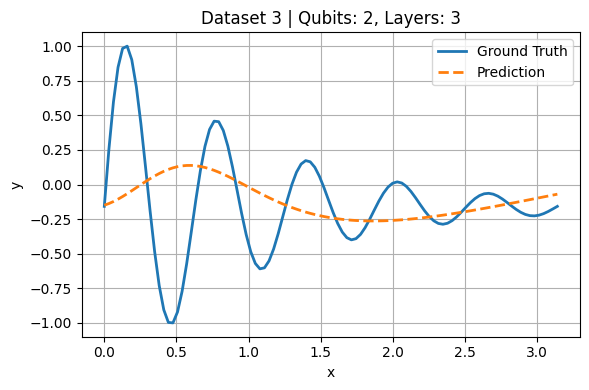

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.025086]


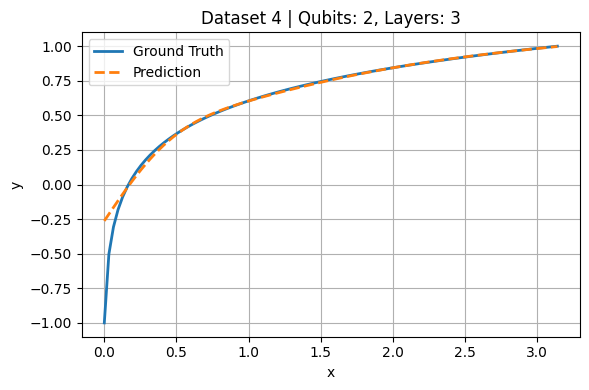

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.030871]


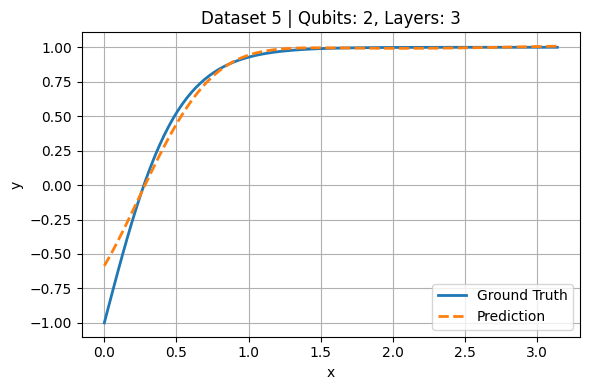

Model (2×3) Training: 100%|██████████| 200/200 [02:04<00:00,  1.61it/s, loss=0.071090]


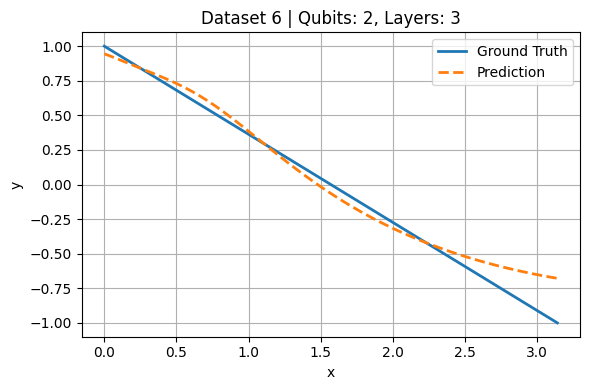

Model (2×3) Training: 100%|██████████| 200/200 [02:05<00:00,  1.59it/s, loss=0.523541]


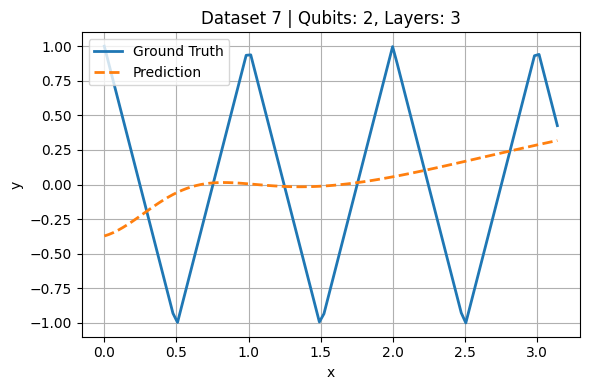

Model (2×3) Training: 100%|██████████| 200/200 [02:05<00:00,  1.59it/s, loss=0.094665]


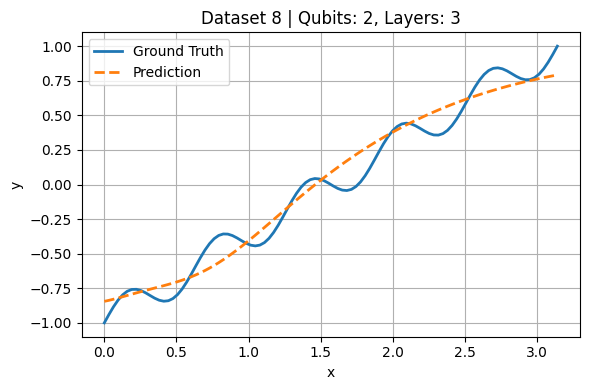

Model (2×3) Training: 100%|██████████| 200/200 [02:05<00:00,  1.60it/s, loss=0.140019]


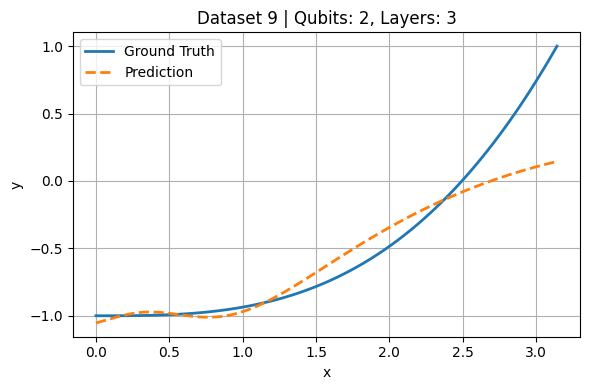

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.096824]


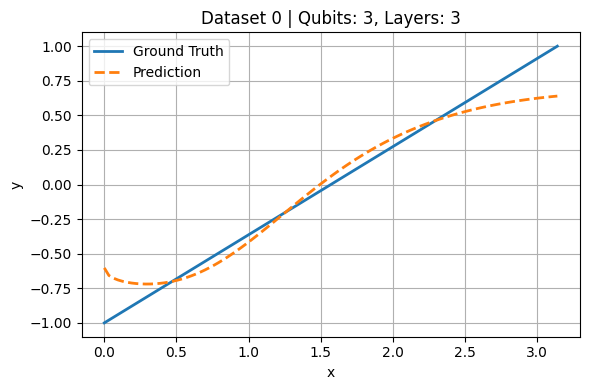

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.247331]


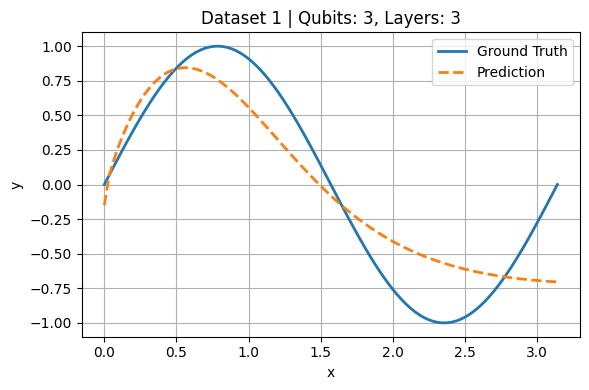

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.132973]


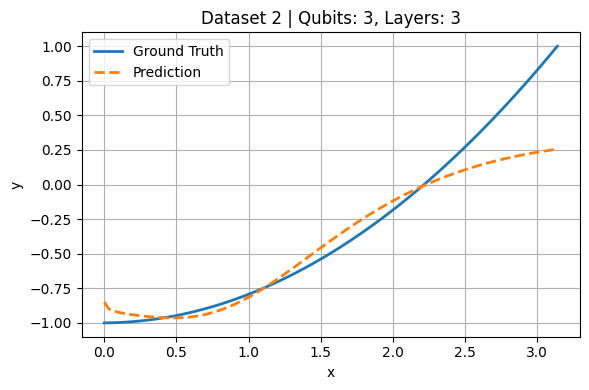

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.258004]


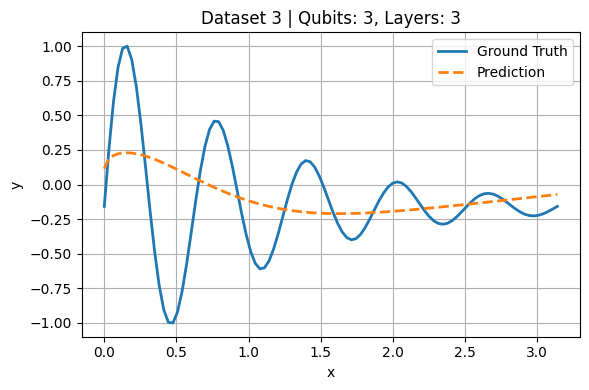

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.049975]


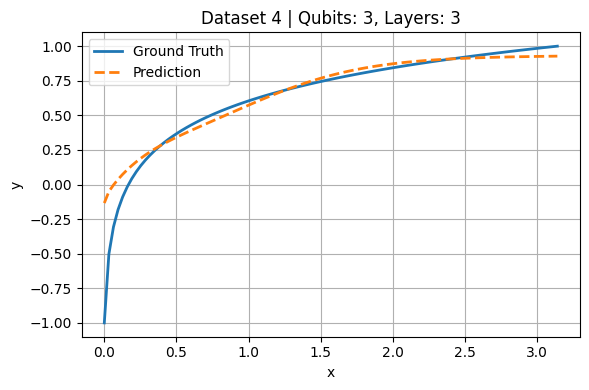

Model (3×3) Training: 100%|██████████| 200/200 [02:55<00:00,  1.14it/s, loss=0.097602]


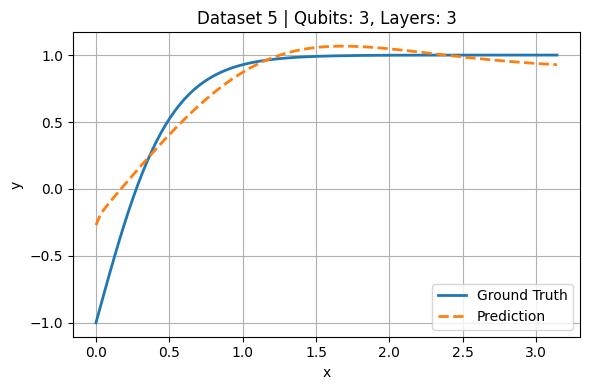

Model (3×3) Training: 100%|██████████| 200/200 [02:53<00:00,  1.15it/s, loss=0.131500]


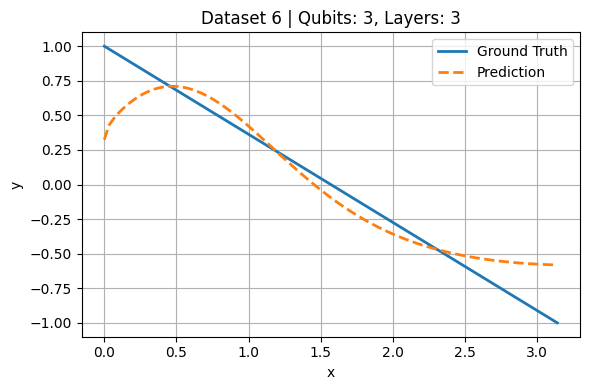

Model (3×3) Training: 100%|██████████| 200/200 [02:51<00:00,  1.17it/s, loss=0.493821]


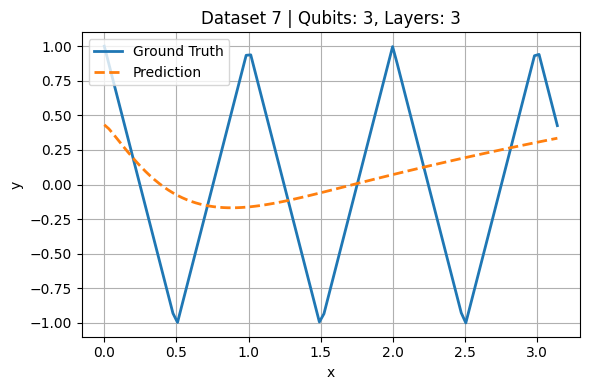

Model (3×3) Training: 100%|██████████| 200/200 [02:54<00:00,  1.14it/s, loss=0.114138]


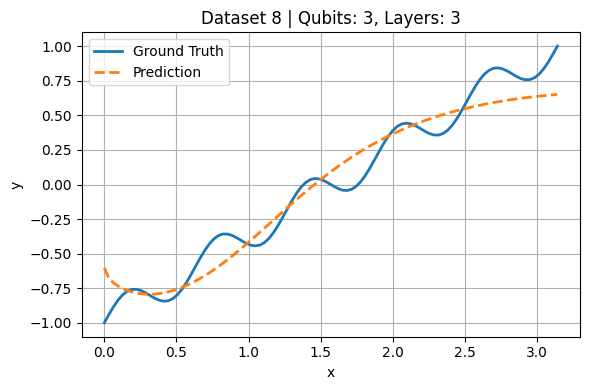

Model (3×3) Training: 100%|██████████| 200/200 [02:54<00:00,  1.14it/s, loss=0.152514]


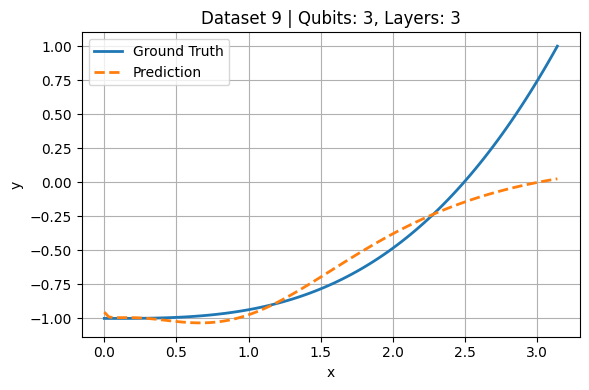

Model (4×3) Training: 100%|██████████| 200/200 [03:56<00:00,  1.18s/it, loss=0.093408]


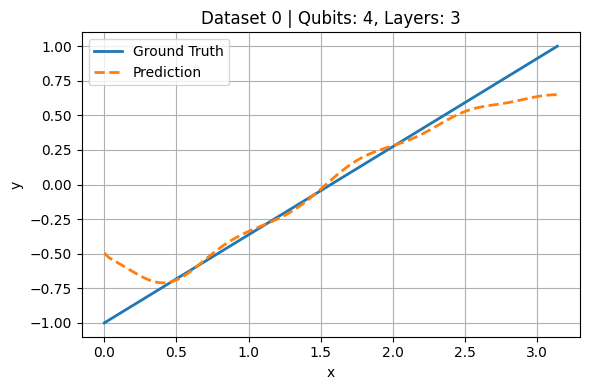

Model (4×3) Training: 100%|██████████| 200/200 [03:55<00:00,  1.18s/it, loss=0.205491]


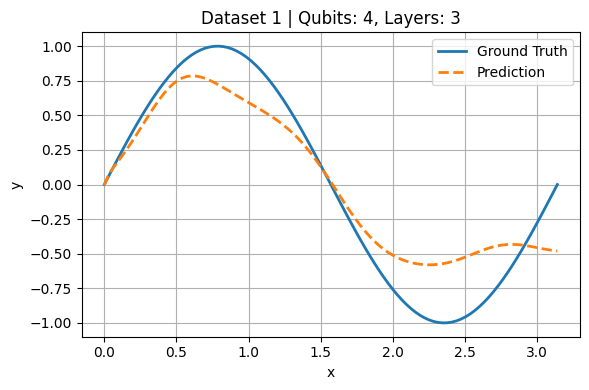

Model (4×3) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.164397]


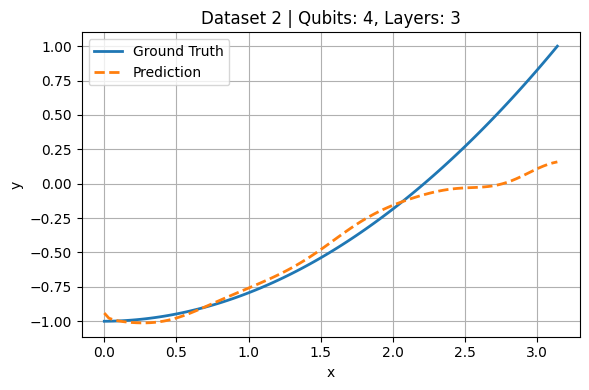

Model (4×3) Training: 100%|██████████| 200/200 [03:56<00:00,  1.18s/it, loss=0.258351]


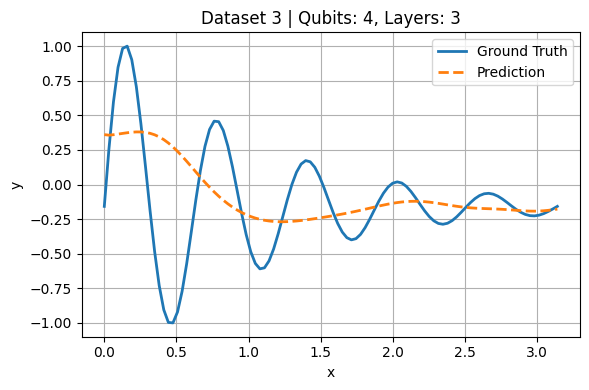

Model (4×3) Training: 100%|██████████| 200/200 [03:56<00:00,  1.18s/it, loss=0.076942]


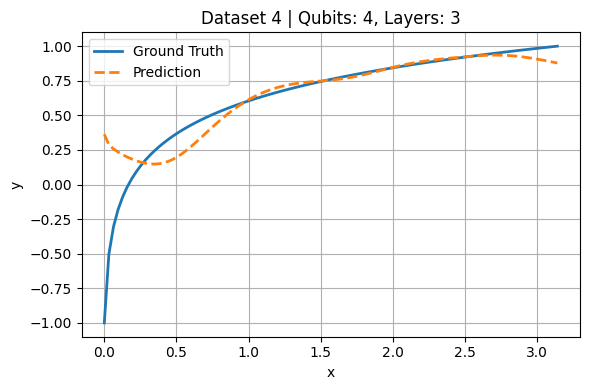

Model (4×3) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.073358]


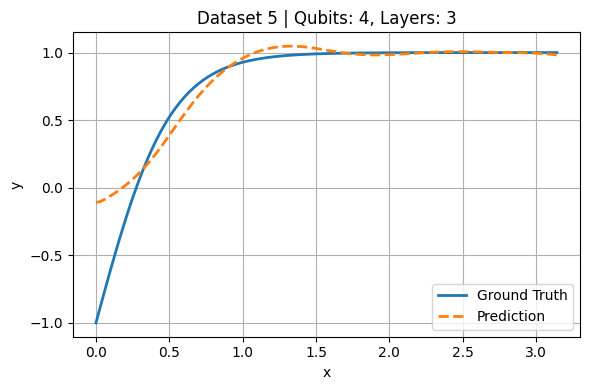

Model (4×3) Training: 100%|██████████| 200/200 [03:56<00:00,  1.18s/it, loss=0.202417]


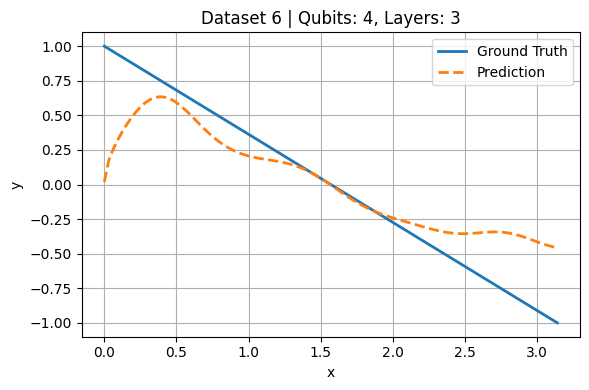

Model (4×3) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.480356]


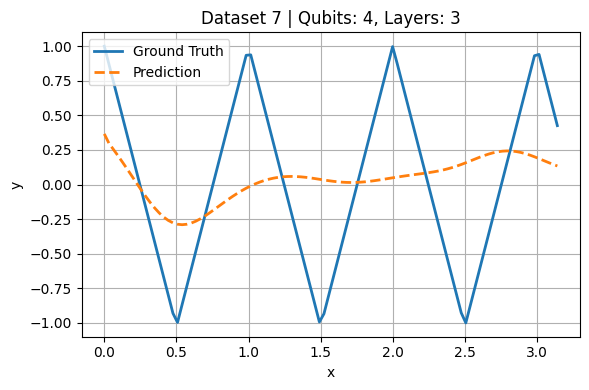

Model (4×3) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.126324]


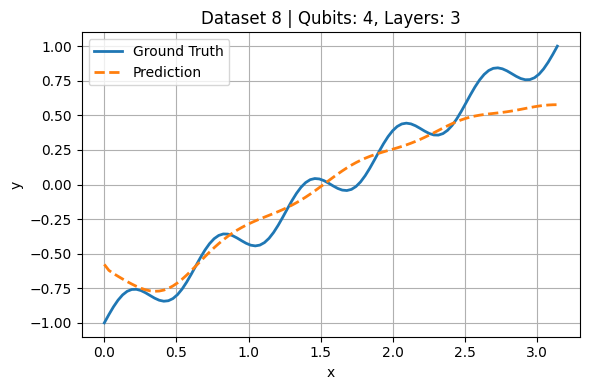

Model (4×3) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.163178]


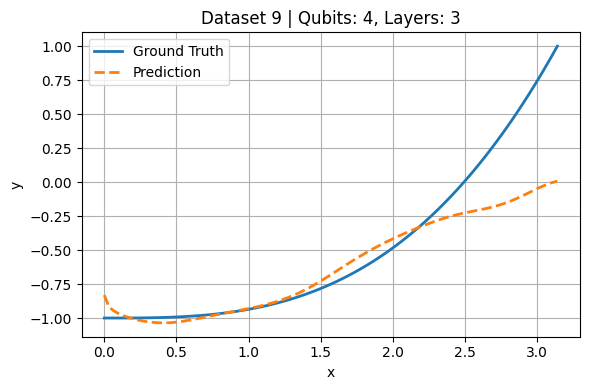

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.076330]


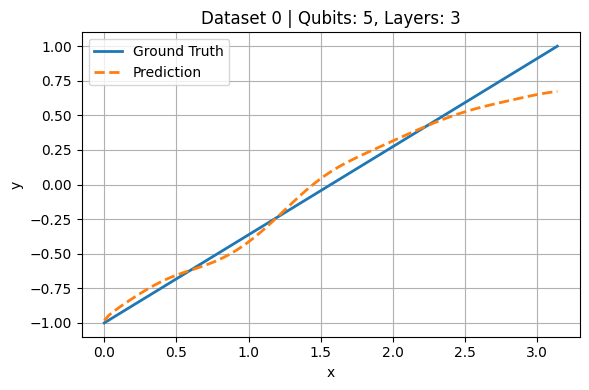

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.313386]


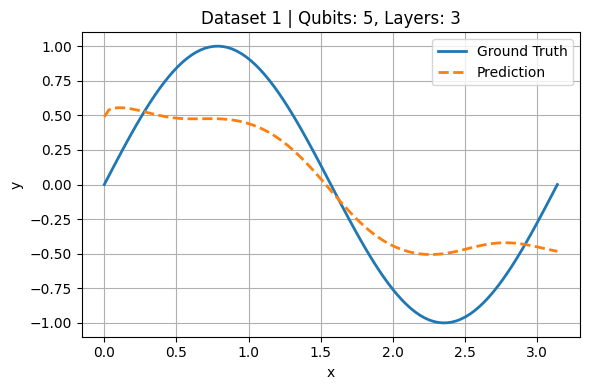

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.122456]


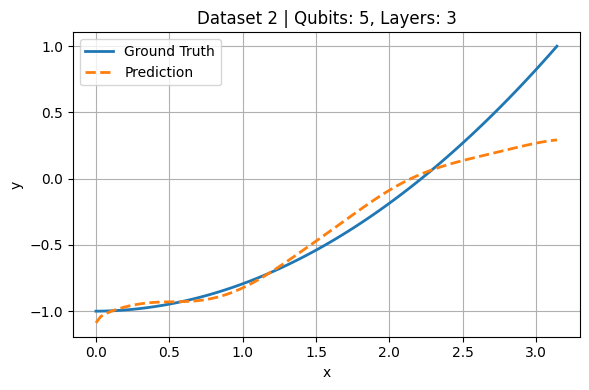

Model (5×3) Training: 100%|██████████| 200/200 [04:52<00:00,  1.46s/it, loss=0.250639]


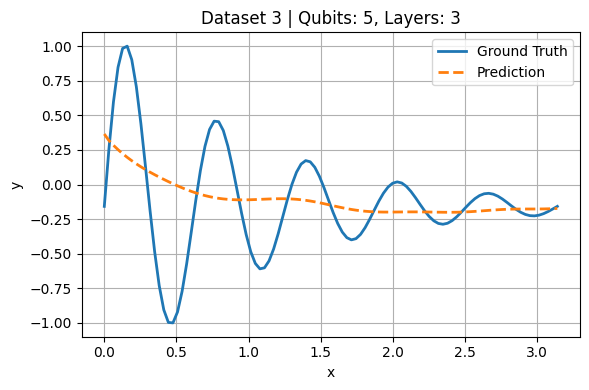

Model (5×3) Training: 100%|██████████| 200/200 [04:39<00:00,  1.40s/it, loss=0.027848]


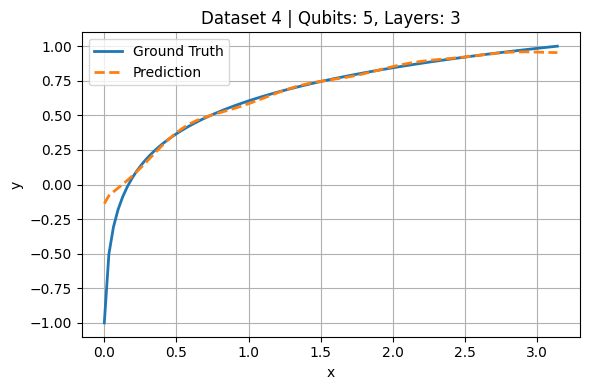

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.077640]


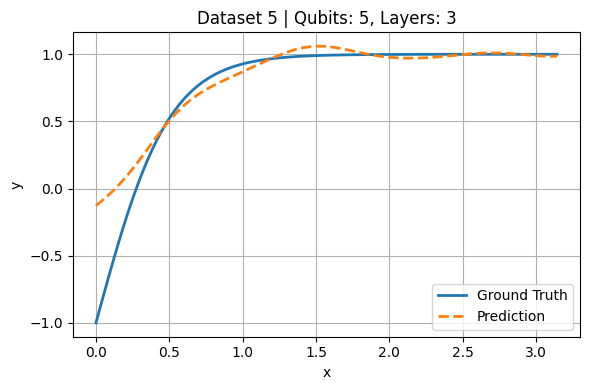

Model (5×3) Training: 100%|██████████| 200/200 [04:45<00:00,  1.43s/it, loss=0.089581]


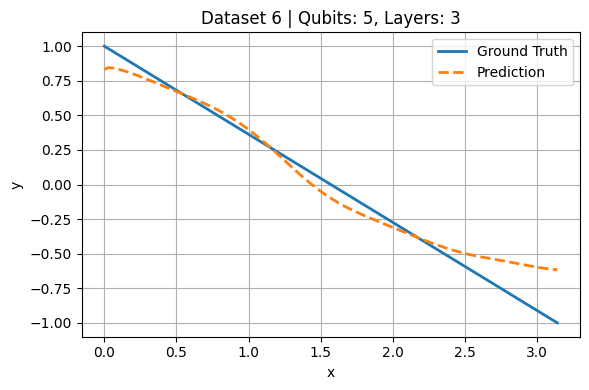

Model (5×3) Training: 100%|██████████| 200/200 [04:42<00:00,  1.41s/it, loss=0.502070]


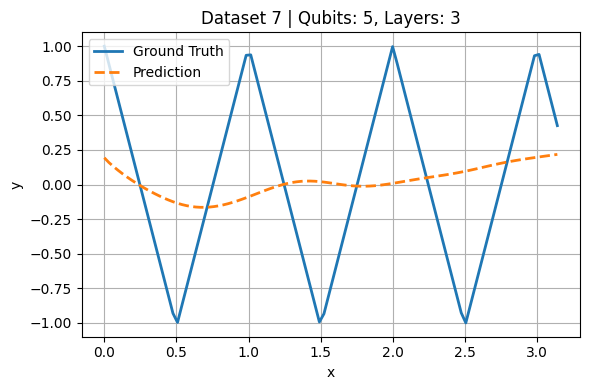

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.103262]


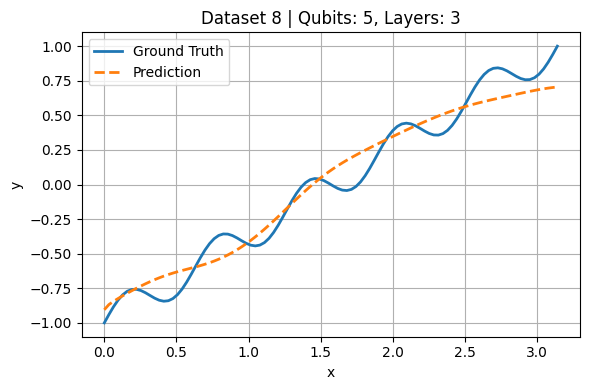

Model (5×3) Training: 100%|██████████| 200/200 [04:49<00:00,  1.45s/it, loss=0.152784]


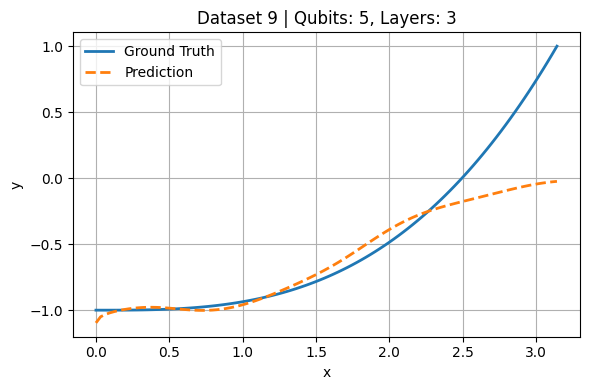

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.63it/s, loss=0.135201]


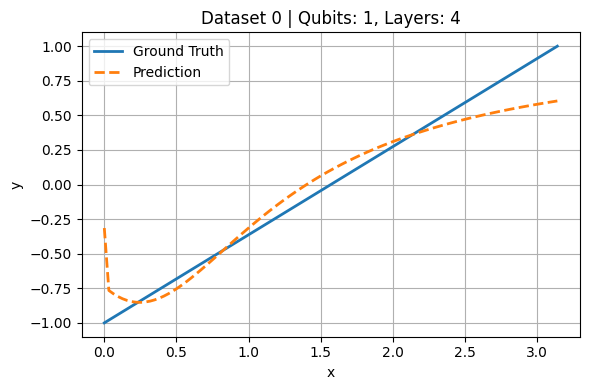

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.63it/s, loss=0.373748]


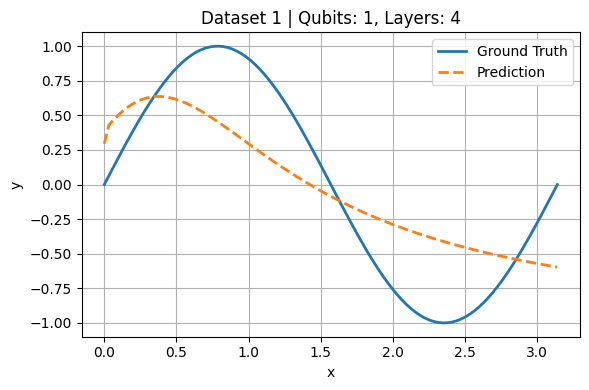

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.63it/s, loss=0.184236]


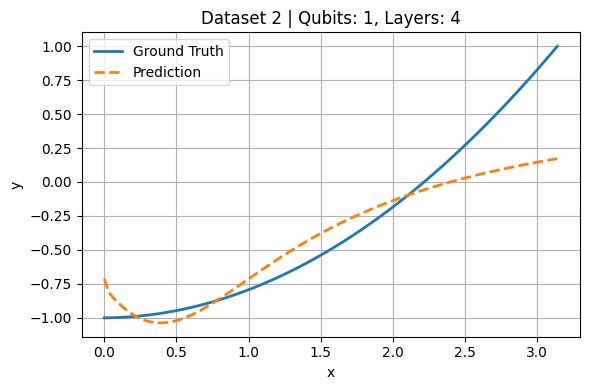

Model (1×4) Training: 100%|██████████| 200/200 [01:15<00:00,  2.63it/s, loss=0.289450]


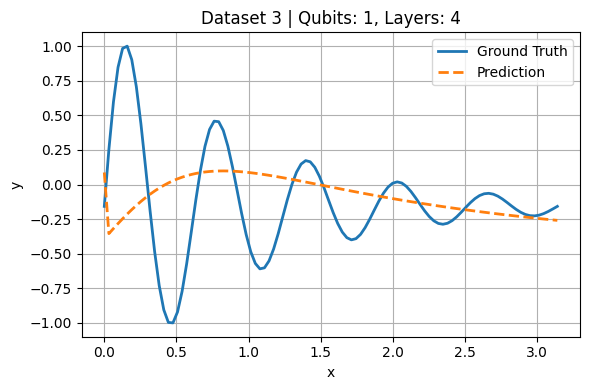

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.62it/s, loss=0.056616]


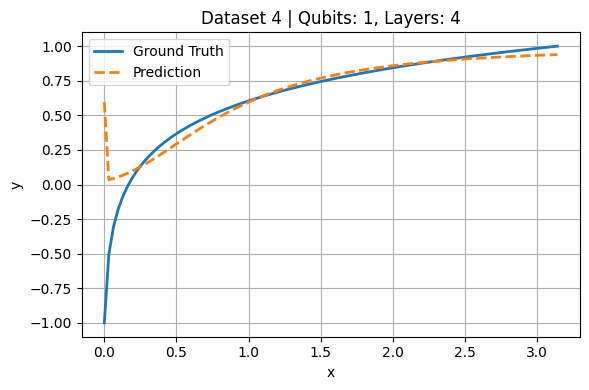

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.62it/s, loss=0.073226]


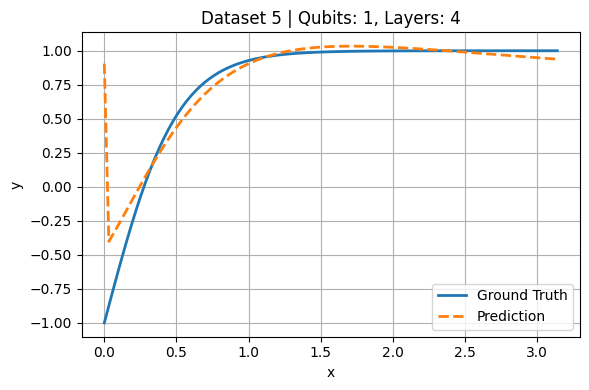

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.63it/s, loss=0.114644]


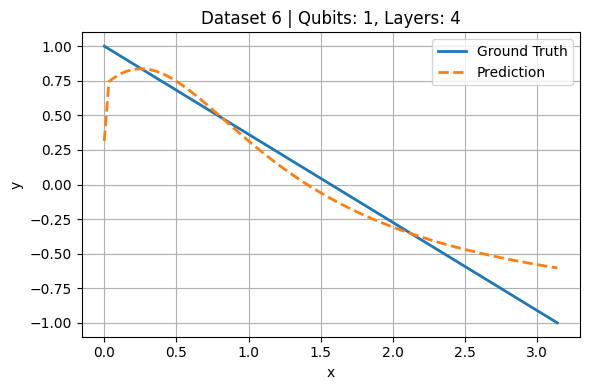

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.63it/s, loss=0.555558]


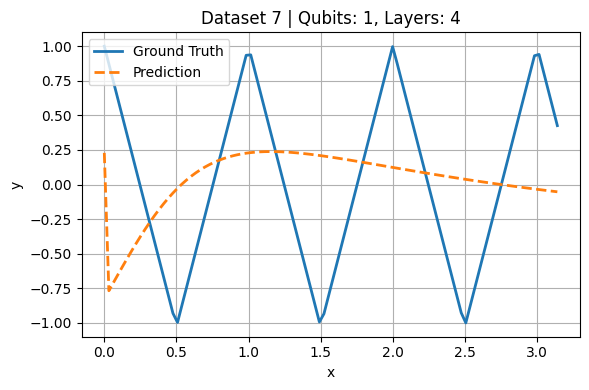

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.62it/s, loss=0.124193]


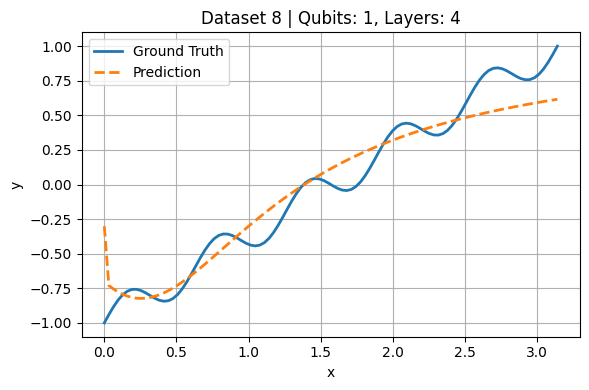

Model (1×4) Training: 100%|██████████| 200/200 [01:16<00:00,  2.62it/s, loss=0.211308]


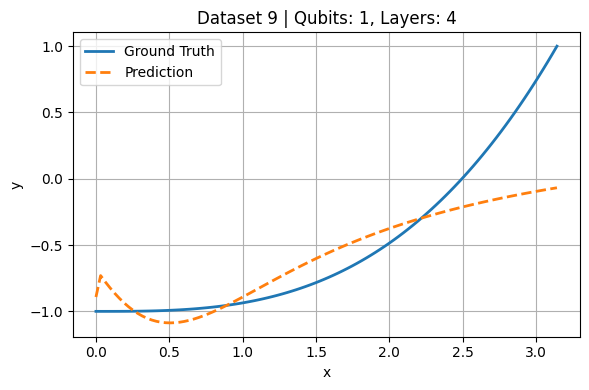

Model (2×4) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.085840]


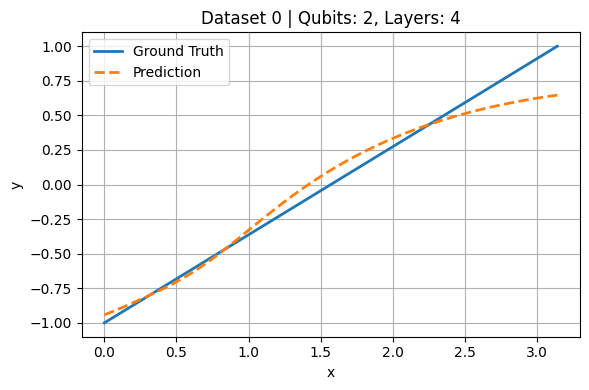

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.216067]


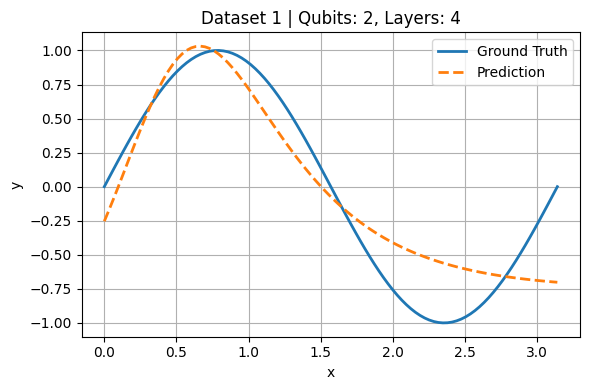

Model (2×4) Training: 100%|██████████| 200/200 [02:37<00:00,  1.27it/s, loss=0.124812]


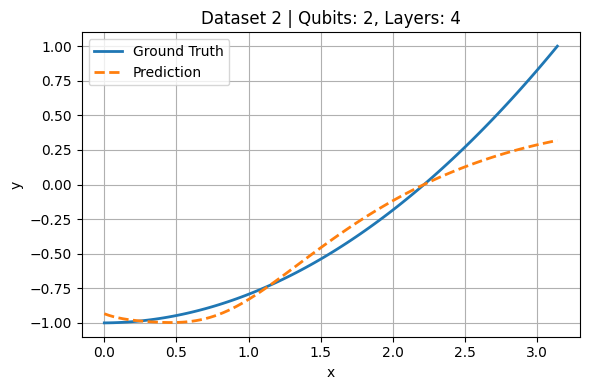

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.244122]


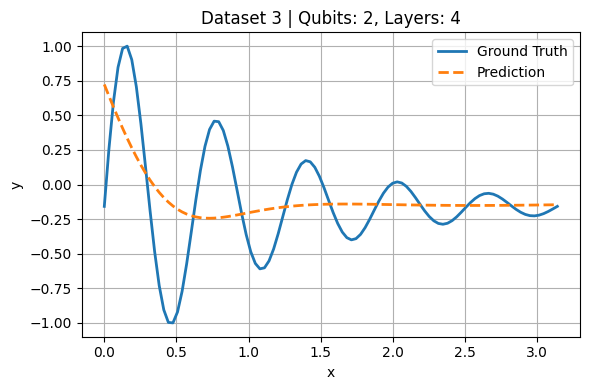

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.021549]


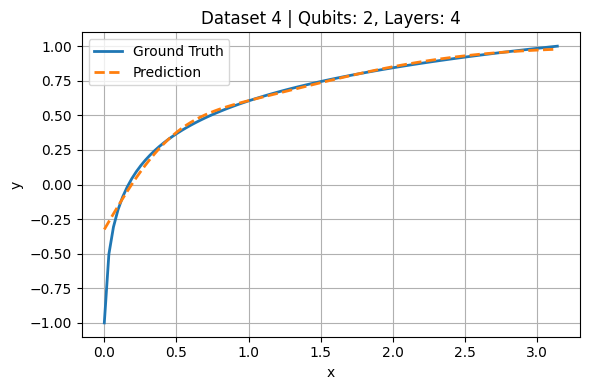

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.033264]


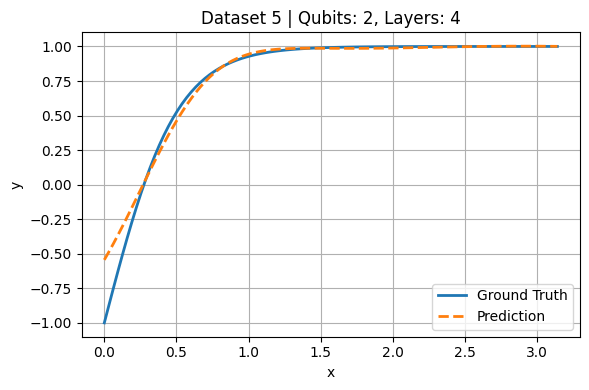

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.102718]


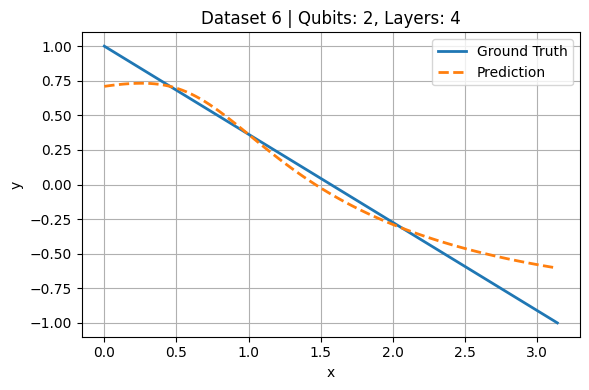

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.481945]


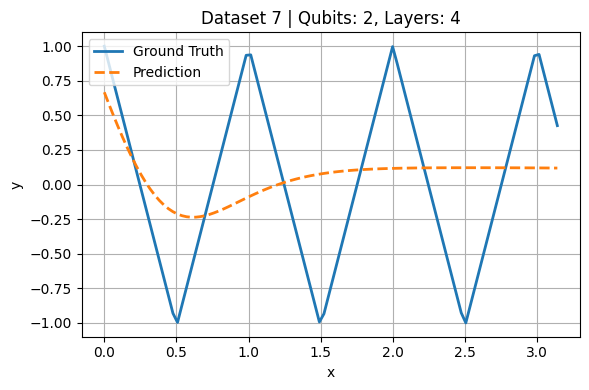

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.142389]


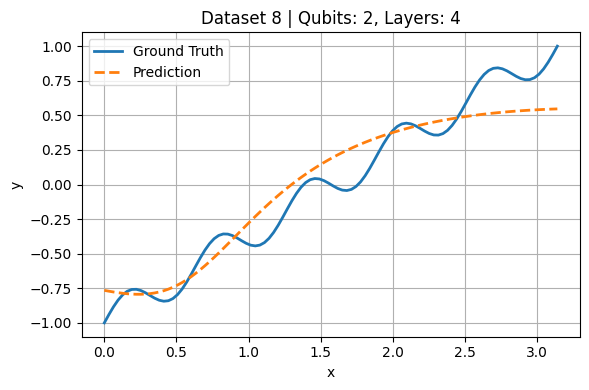

Model (2×4) Training: 100%|██████████| 200/200 [02:38<00:00,  1.26it/s, loss=0.139230]


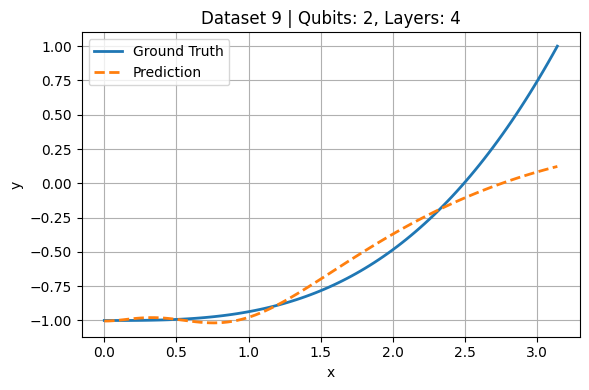

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.101564]


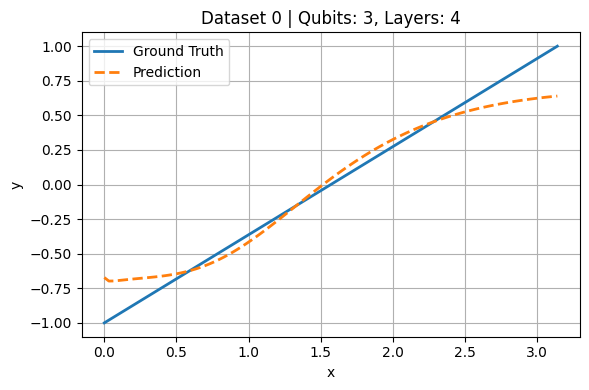

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.257256]


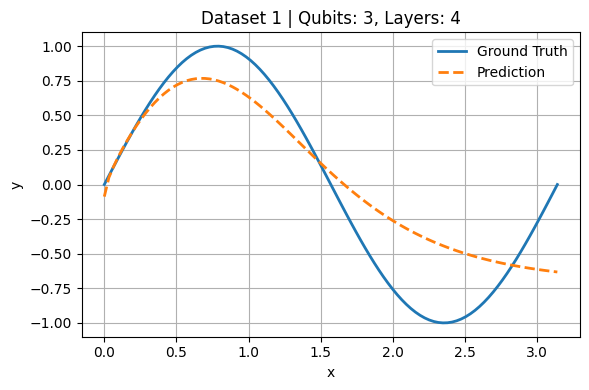

Model (3×4) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.123274]


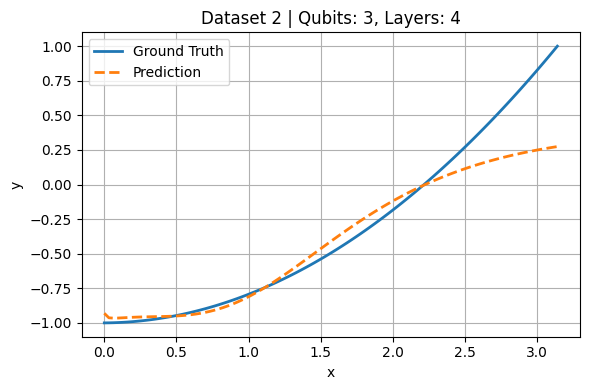

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.253331]


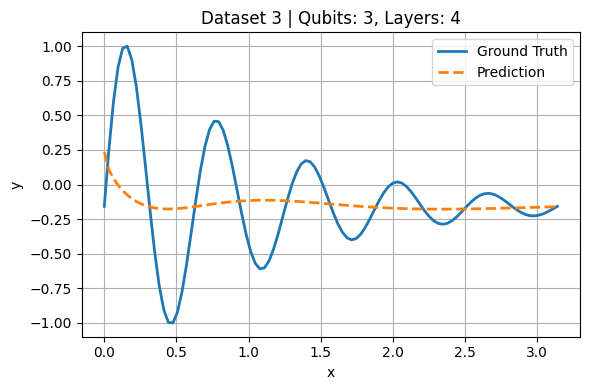

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.044526]


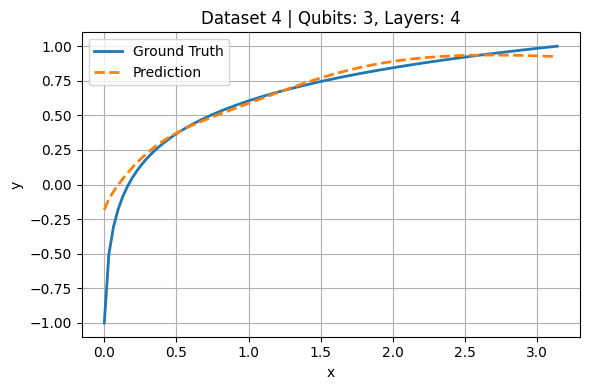

Model (3×4) Training: 100%|██████████| 200/200 [03:57<00:00,  1.19s/it, loss=0.067060]


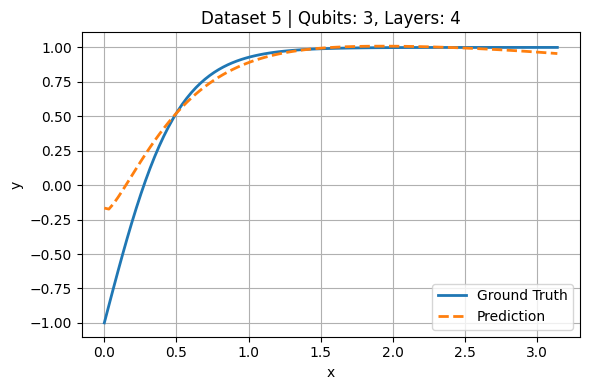

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.096405]


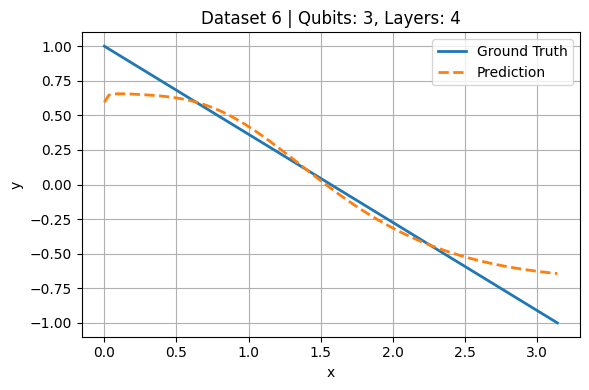

Model (3×4) Training: 100%|██████████| 200/200 [03:58<00:00,  1.19s/it, loss=0.502040]


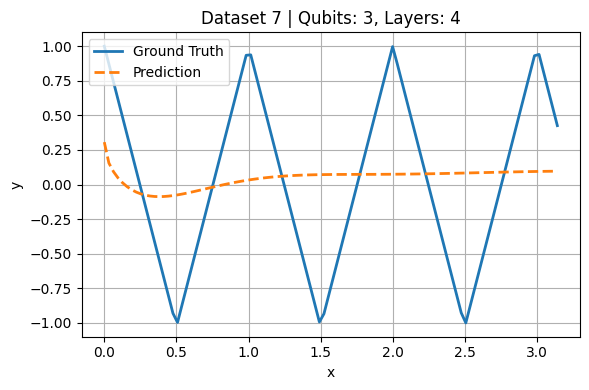

Model (3×4) Training: 100%|██████████| 200/200 [03:59<00:00,  1.20s/it, loss=0.113882]


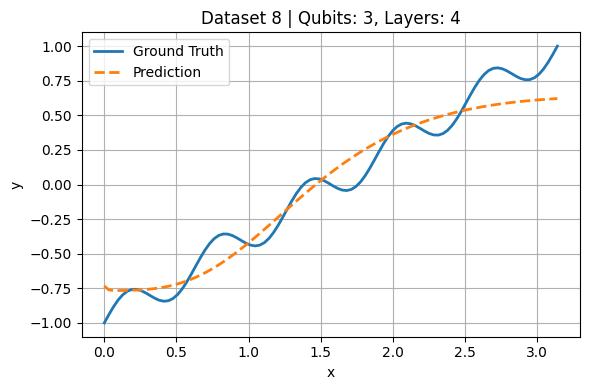

Model (3×4) Training: 100%|██████████| 200/200 [04:00<00:00,  1.20s/it, loss=0.143542]


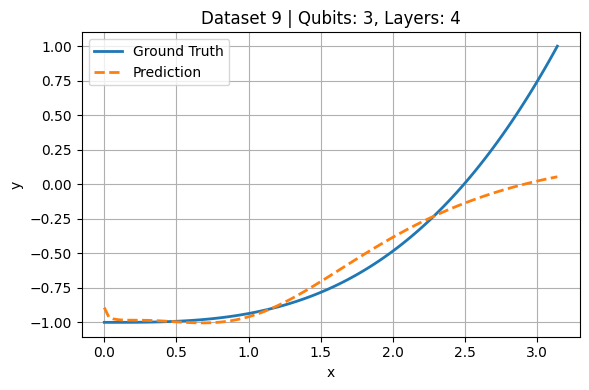

Model (4×4) Training: 100%|██████████| 200/200 [05:09<00:00,  1.55s/it, loss=0.072066]


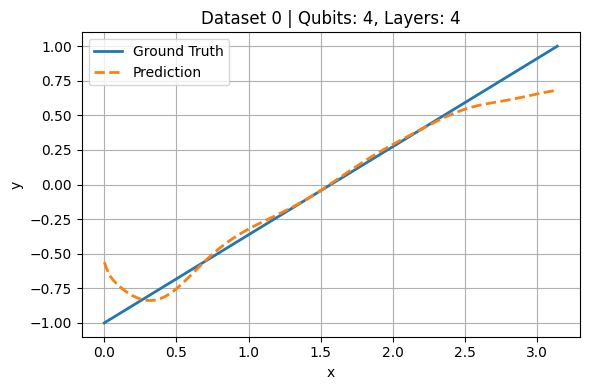

Model (4×4) Training: 100%|██████████| 200/200 [05:08<00:00,  1.54s/it, loss=0.130088]


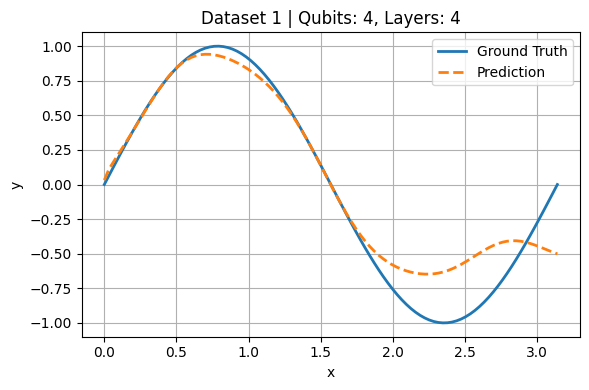

Model (4×4) Training: 100%|██████████| 200/200 [05:06<00:00,  1.53s/it, loss=0.140729]


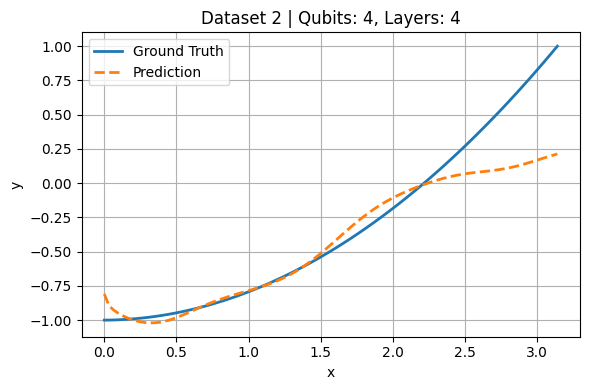

Model (4×4) Training: 100%|██████████| 200/200 [05:06<00:00,  1.53s/it, loss=0.239124]


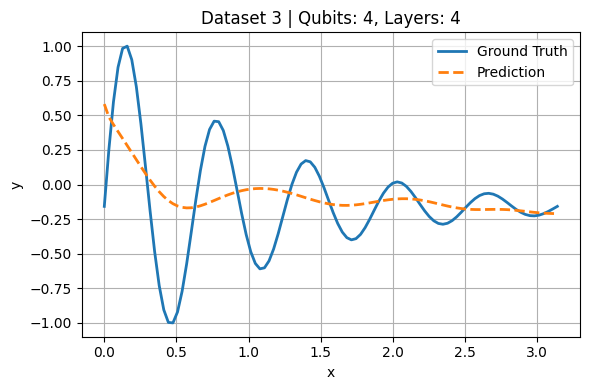

Model (4×4) Training: 100%|██████████| 200/200 [05:06<00:00,  1.53s/it, loss=0.053305]


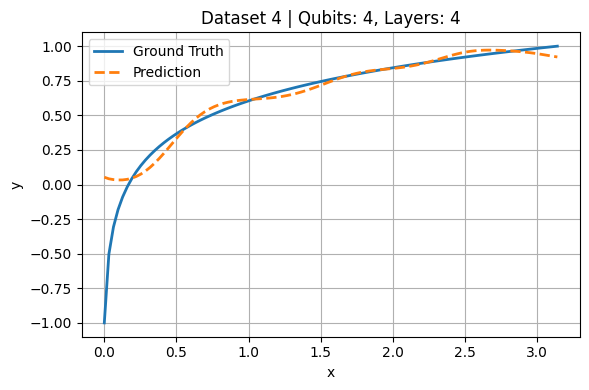

Model (4×4) Training: 100%|██████████| 200/200 [05:08<00:00,  1.54s/it, loss=0.062974]


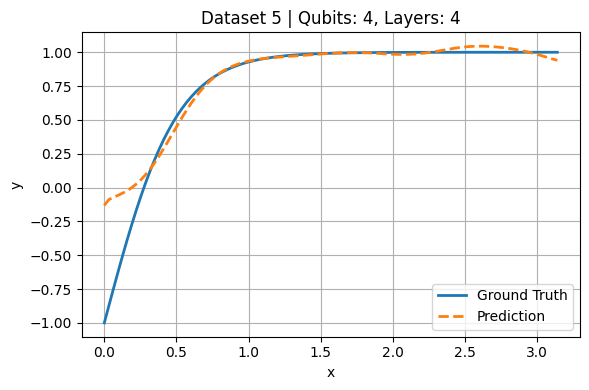

Model (4×4) Training: 100%|██████████| 200/200 [05:07<00:00,  1.54s/it, loss=0.073471]


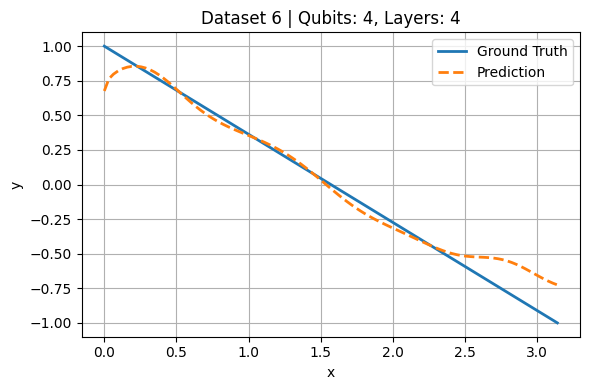

Model (4×4) Training: 100%|██████████| 200/200 [05:07<00:00,  1.54s/it, loss=0.444598]


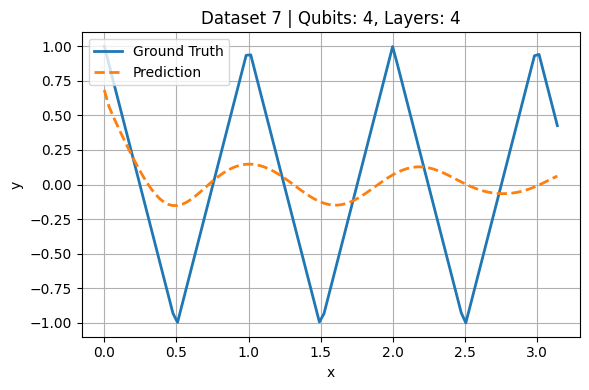

Model (4×4) Training: 100%|██████████| 200/200 [05:07<00:00,  1.54s/it, loss=0.094672]


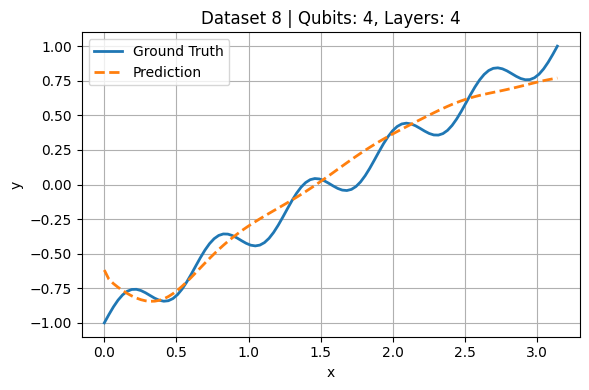

Model (4×4) Training: 100%|██████████| 200/200 [05:06<00:00,  1.53s/it, loss=0.140605]


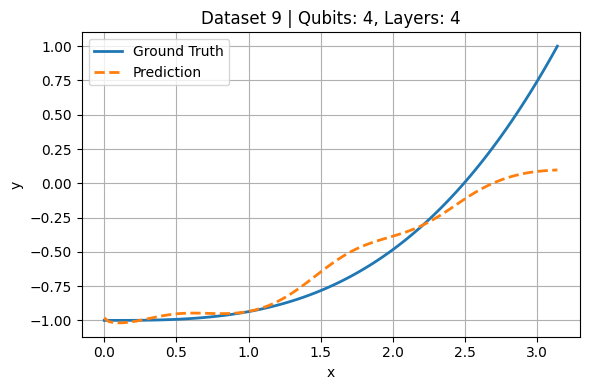

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.182590]


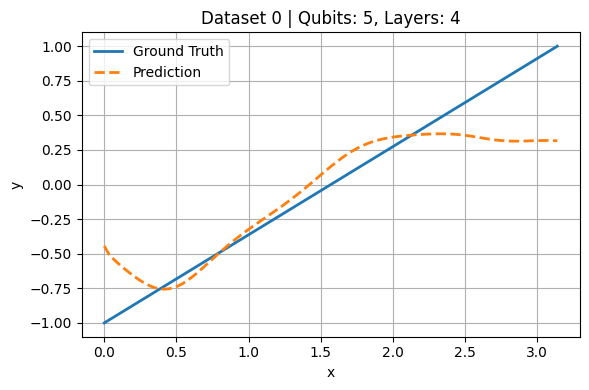

Model (5×4) Training: 100%|██████████| 200/200 [06:15<00:00,  1.88s/it, loss=0.252547]


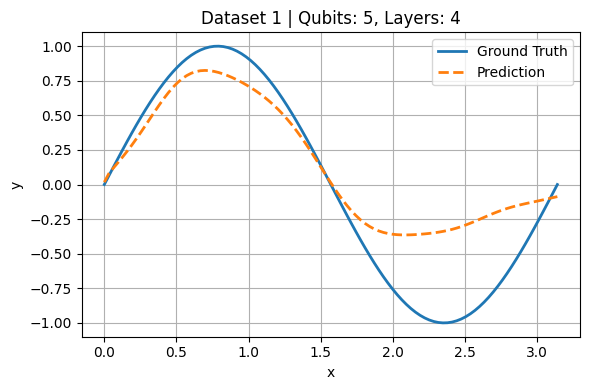

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.249429]


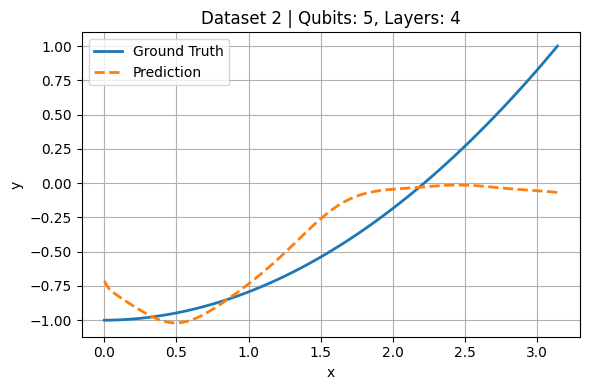

Model (5×4) Training: 100%|██████████| 200/200 [06:26<00:00,  1.93s/it, loss=0.250675]


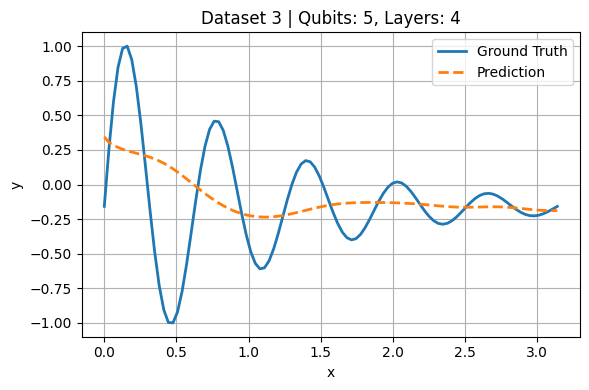

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.093270]


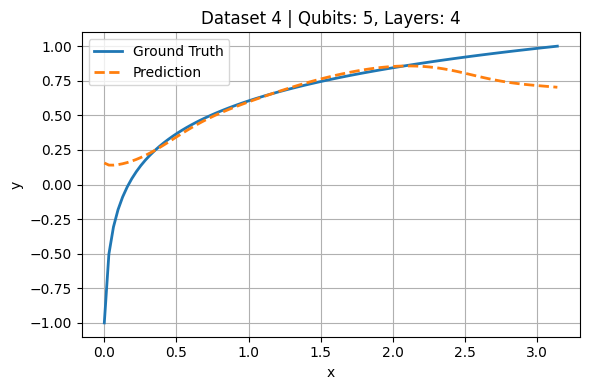

Model (5×4) Training: 100%|██████████| 200/200 [06:12<00:00,  1.86s/it, loss=0.135474]


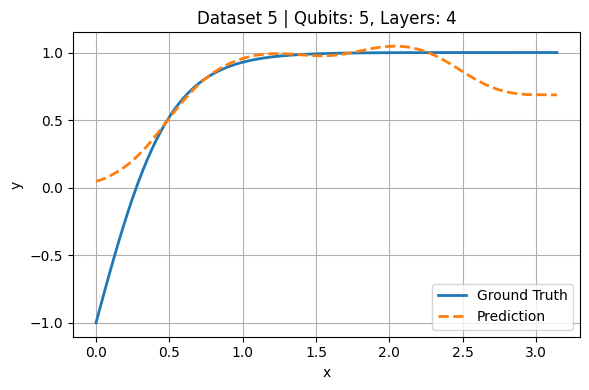

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.206615]


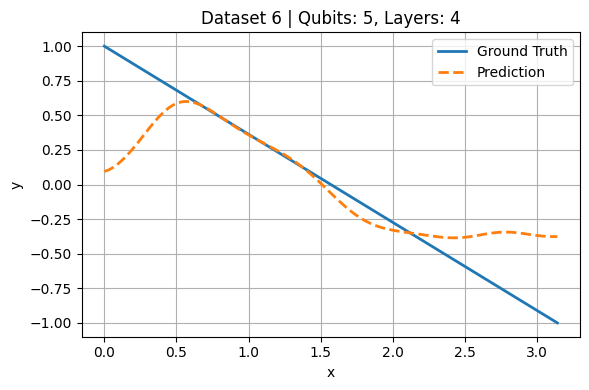

Model (5×4) Training: 100%|██████████| 200/200 [06:15<00:00,  1.88s/it, loss=0.485662]


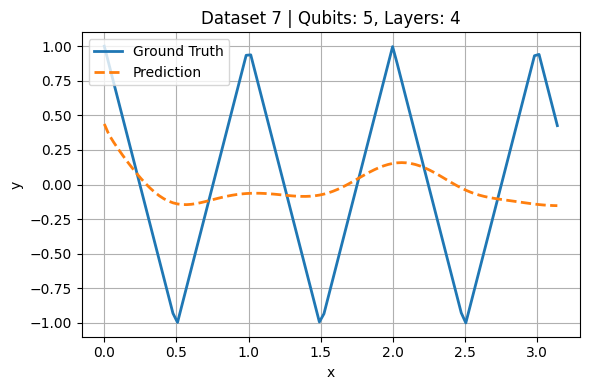

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.209440]


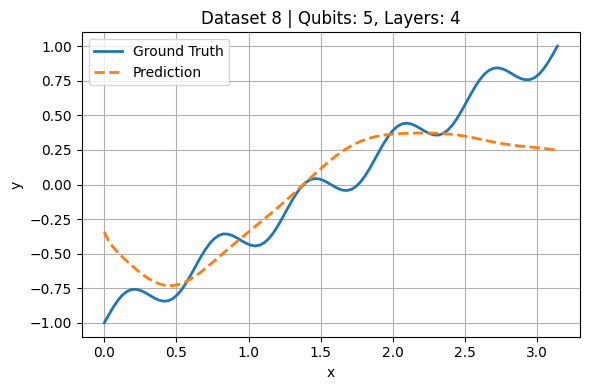

Model (5×4) Training: 100%|██████████| 200/200 [06:13<00:00,  1.87s/it, loss=0.211632]


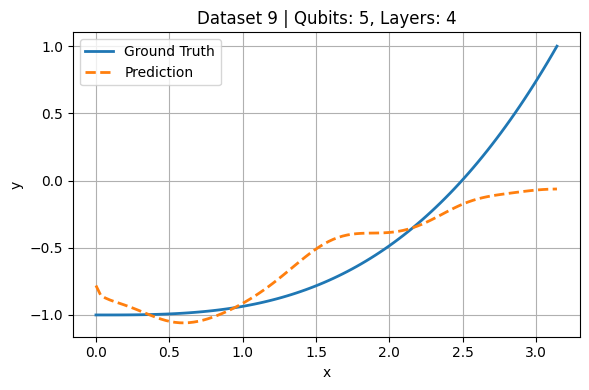

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.119007]


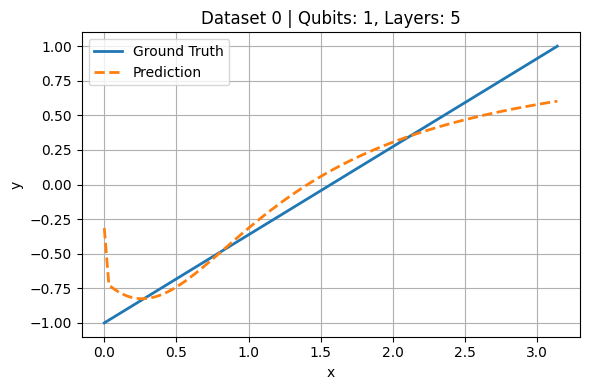

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.367379]


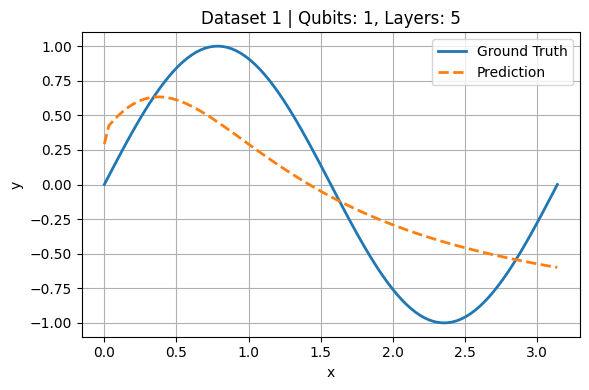

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.24it/s, loss=0.186701]


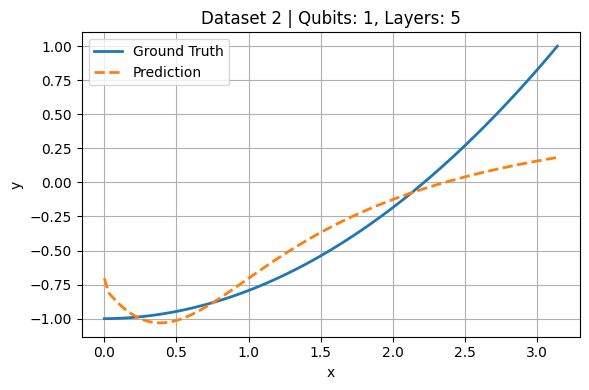

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.22it/s, loss=0.295733]


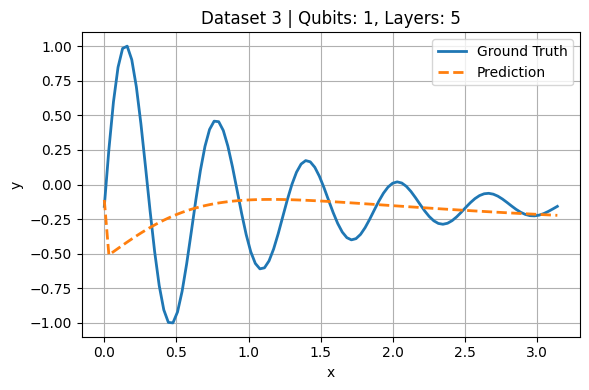

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.063283]


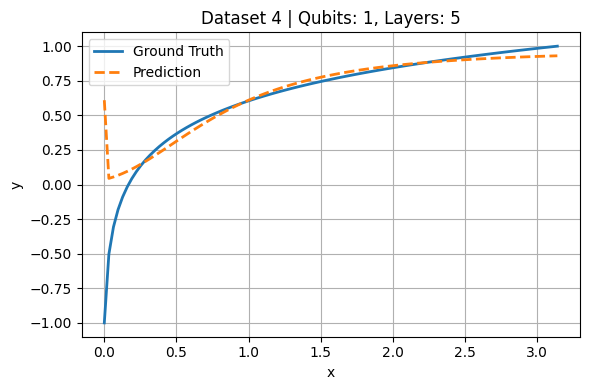

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.073115]


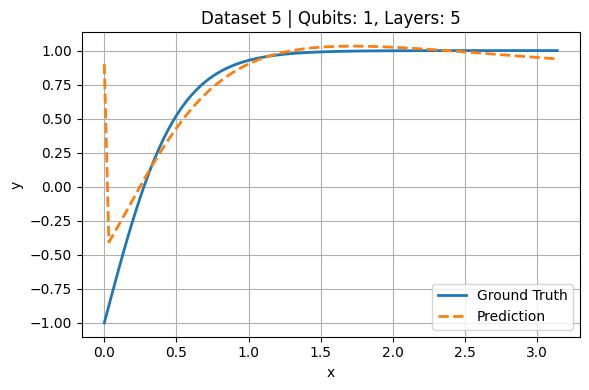

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.125701]


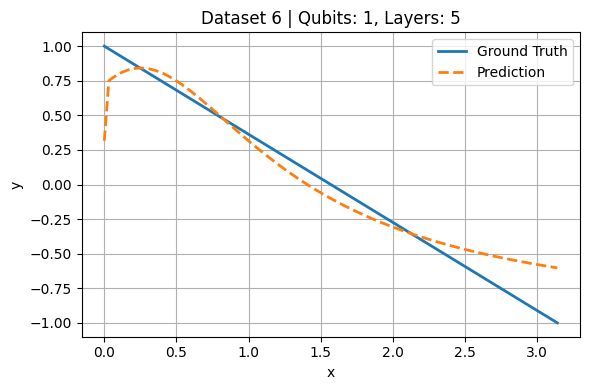

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.23it/s, loss=0.559160]


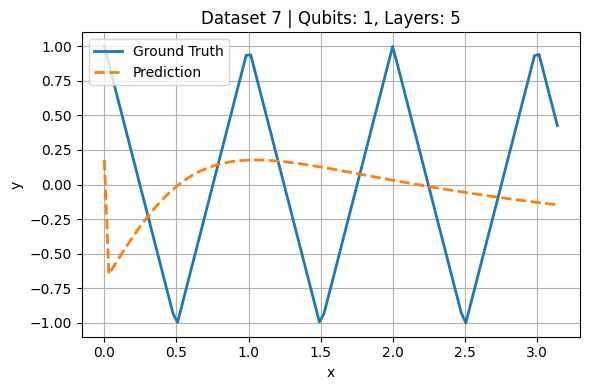

Model (1×5) Training: 100%|██████████| 200/200 [01:29<00:00,  2.24it/s, loss=0.126826]


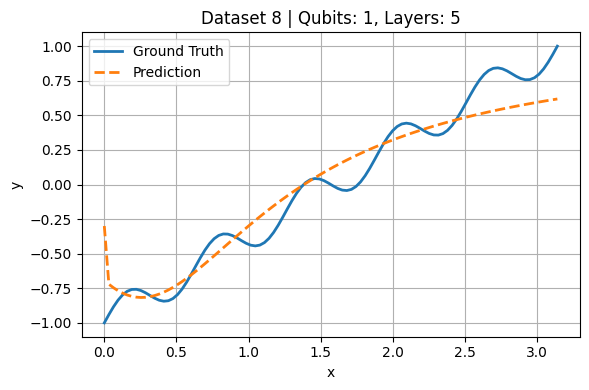

Model (1×5) Training: 100%|██████████| 200/200 [01:30<00:00,  2.22it/s, loss=0.214014]


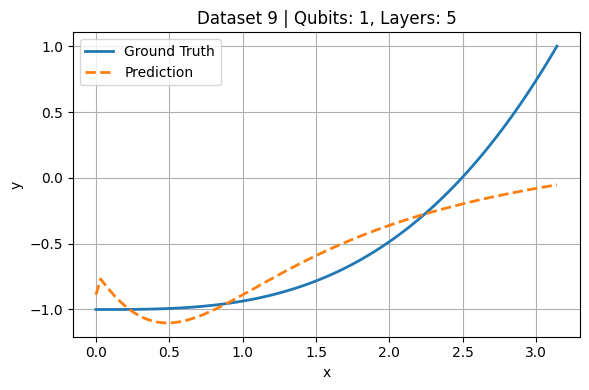

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.071547]


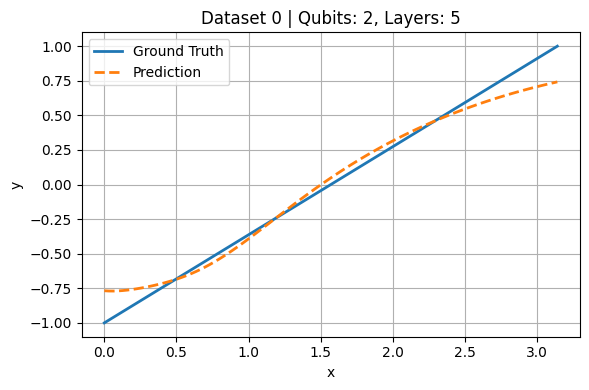

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.205336]


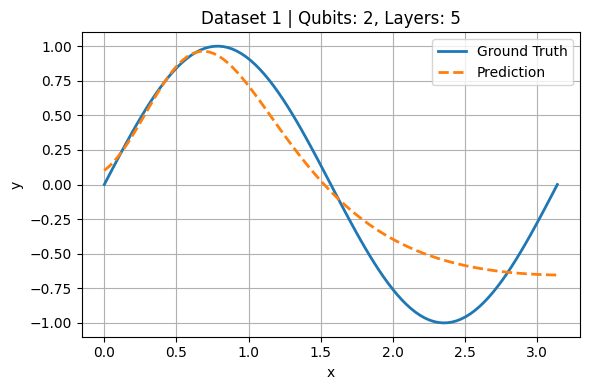

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.113691]


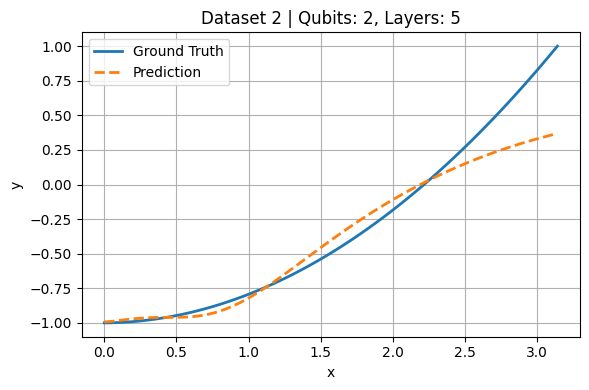

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.251803]


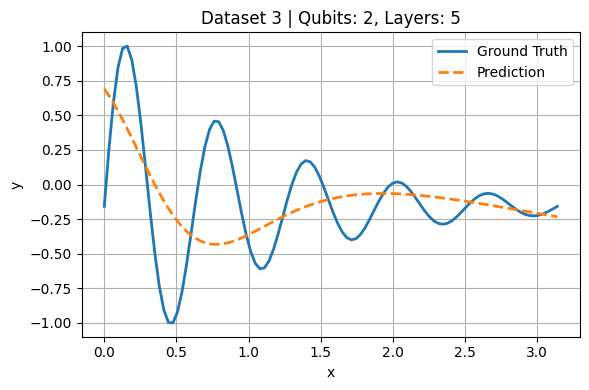

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.020578]


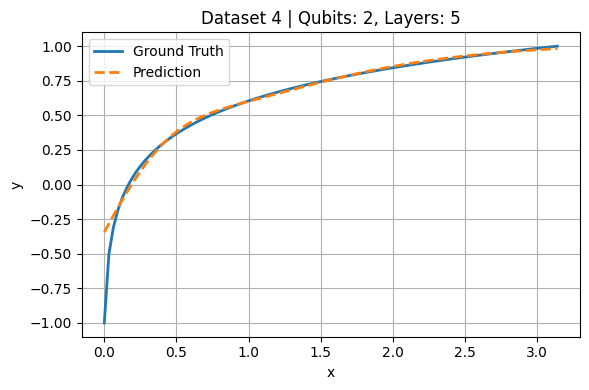

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.060717]


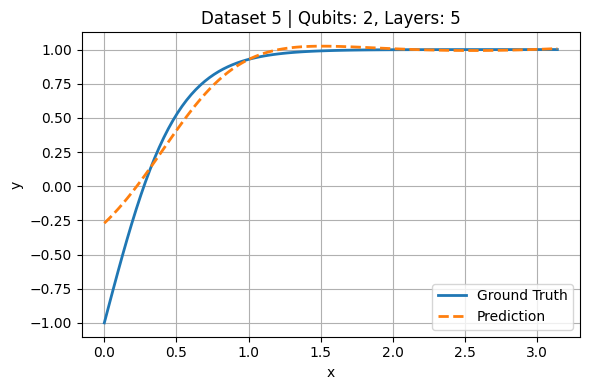

Model (2×5) Training: 100%|██████████| 200/200 [03:14<00:00,  1.03it/s, loss=0.066465]


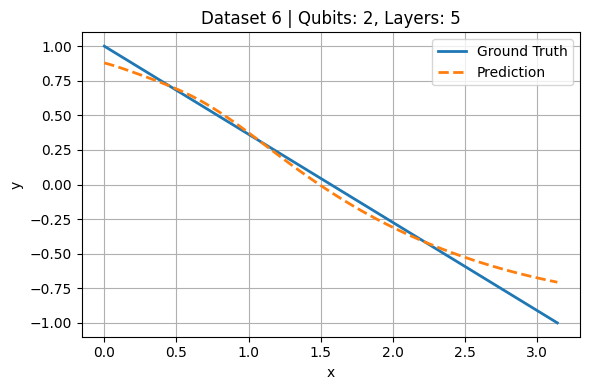

Model (2×5) Training: 100%|██████████| 200/200 [03:13<00:00,  1.03it/s, loss=0.490911]


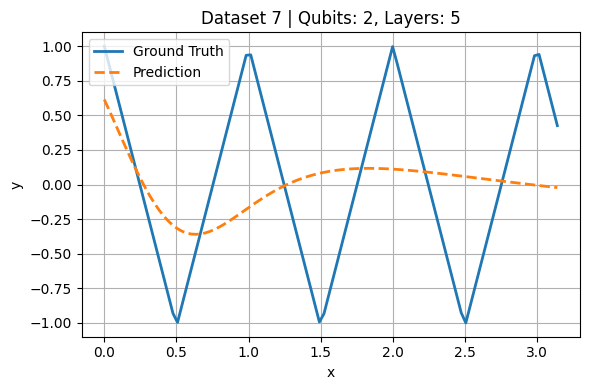

Model (2×5) Training: 100%|██████████| 200/200 [03:14<00:00,  1.03it/s, loss=0.091755]


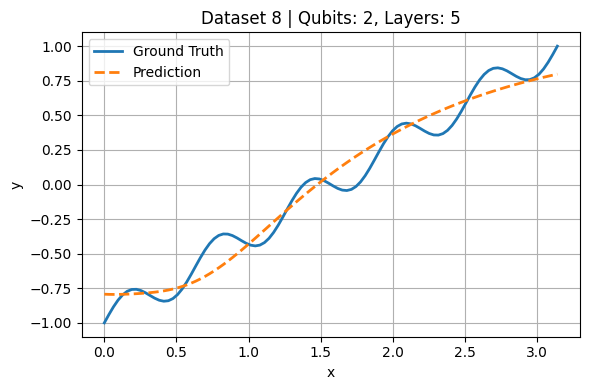

Model (2×5) Training: 100%|██████████| 200/200 [03:14<00:00,  1.03it/s, loss=0.144713]


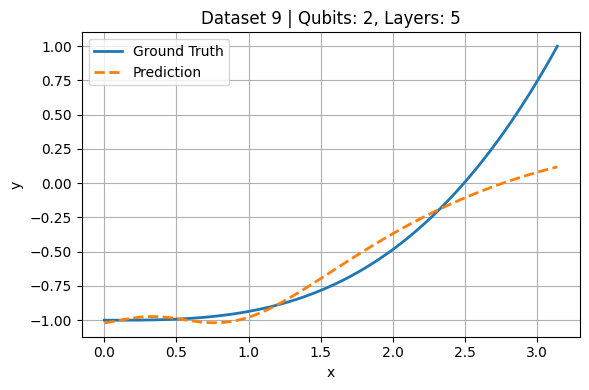

Model (3×5) Training: 100%|██████████| 200/200 [04:52<00:00,  1.46s/it, loss=0.077359]


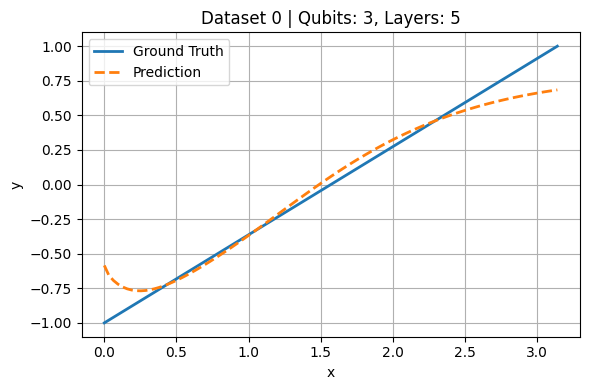

Model (3×5) Training: 100%|██████████| 200/200 [04:51<00:00,  1.46s/it, loss=0.242619]


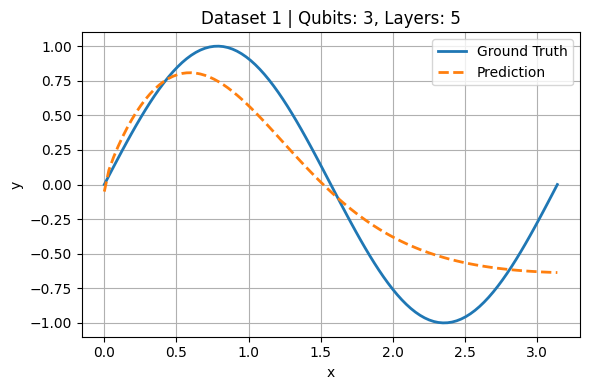

Model (3×5) Training: 100%|██████████| 200/200 [04:52<00:00,  1.46s/it, loss=0.113426]


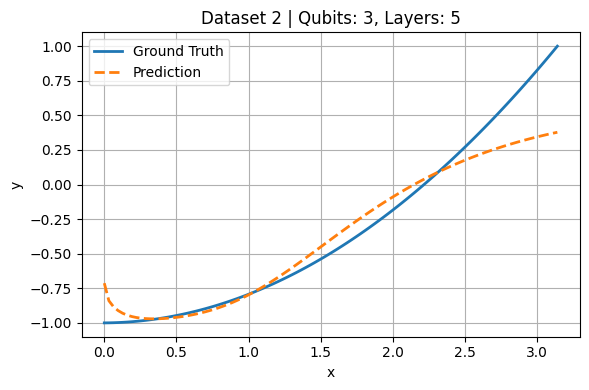

Model (3×5) Training: 100%|██████████| 200/200 [04:52<00:00,  1.46s/it, loss=0.244993]


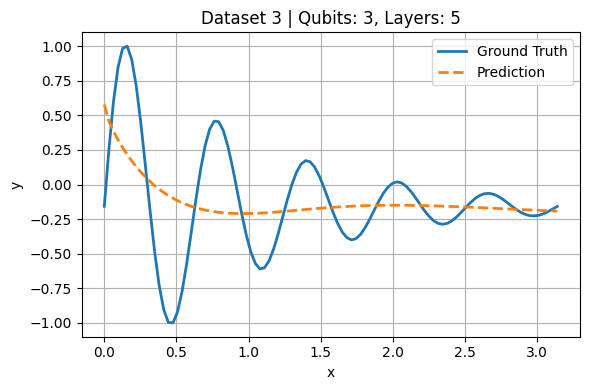

Model (3×5) Training: 100%|██████████| 200/200 [04:53<00:00,  1.47s/it, loss=0.041503]


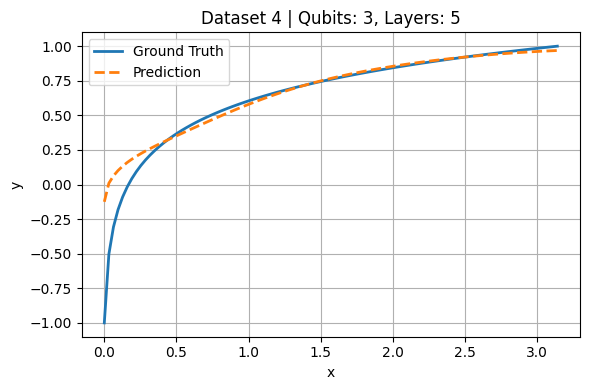

Model (3×5) Training: 100%|██████████| 200/200 [04:53<00:00,  1.47s/it, loss=0.082255]


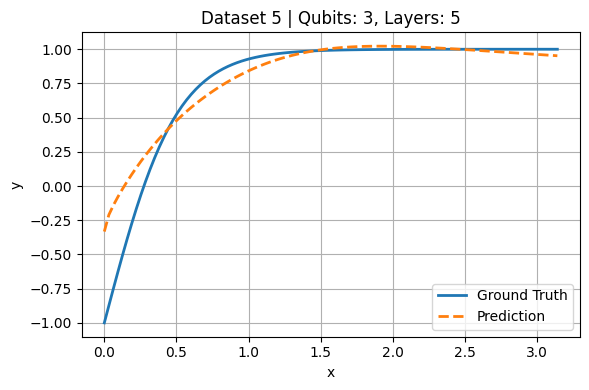

Model (3×5) Training: 100%|██████████| 200/200 [04:53<00:00,  1.47s/it, loss=0.121568]


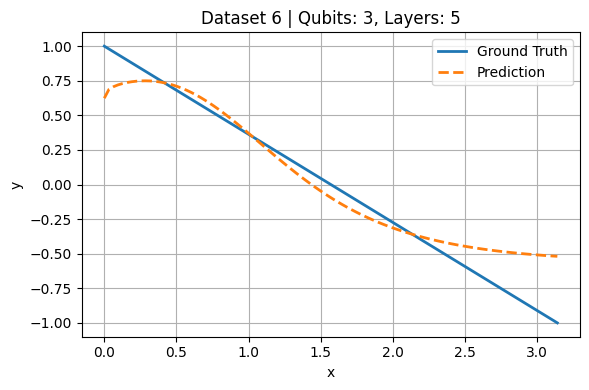

Model (3×5) Training: 100%|██████████| 200/200 [04:53<00:00,  1.47s/it, loss=0.490695]


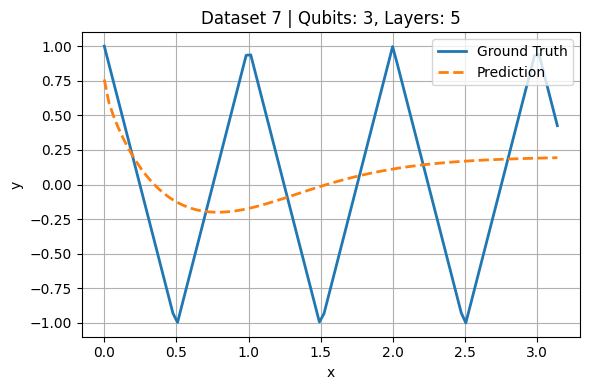

Model (3×5) Training: 100%|██████████| 200/200 [04:53<00:00,  1.47s/it, loss=0.133015]


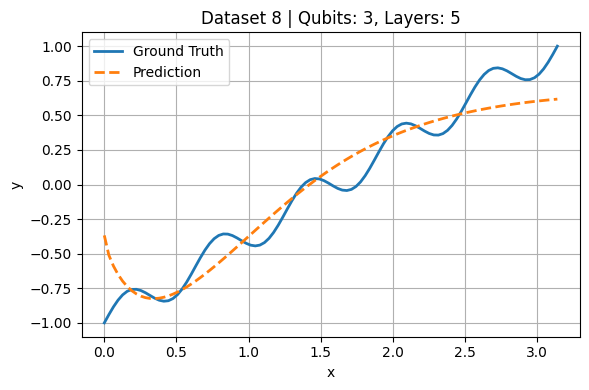

Model (3×5) Training: 100%|██████████| 200/200 [04:55<00:00,  1.48s/it, loss=0.125438]


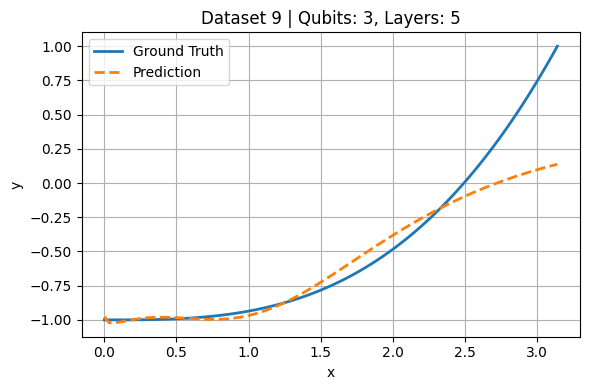

Model (4×5) Training: 100%|██████████| 200/200 [06:16<00:00,  1.88s/it, loss=0.073691]


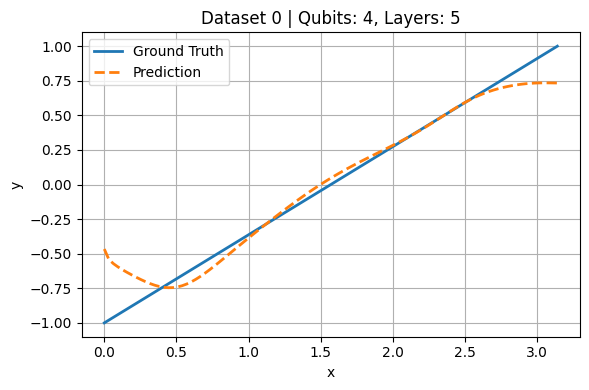

Model (4×5) Training: 100%|██████████| 200/200 [06:16<00:00,  1.88s/it, loss=0.140755]


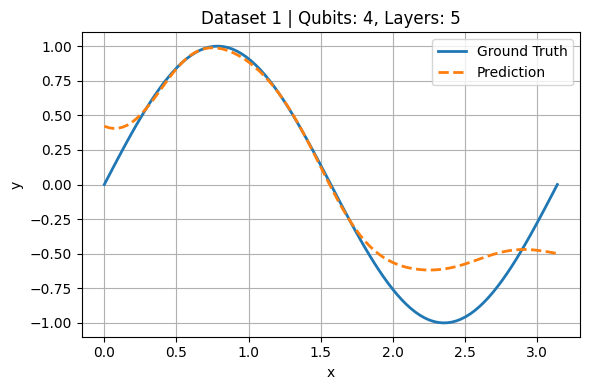

Model (4×5) Training: 100%|██████████| 200/200 [06:15<00:00,  1.88s/it, loss=0.110443]


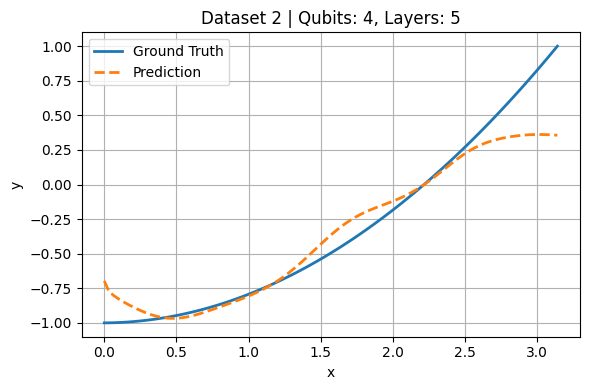

Model (4×5) Training: 100%|██████████| 200/200 [06:16<00:00,  1.88s/it, loss=0.254228]


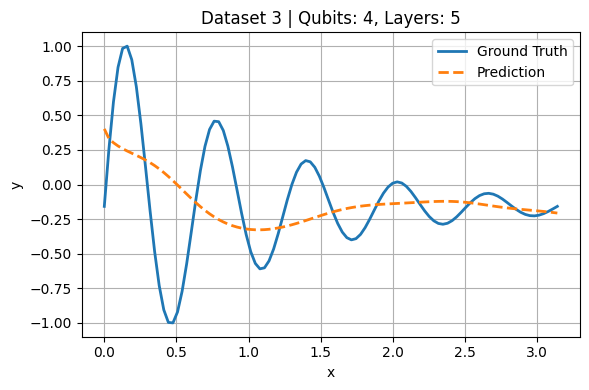

Model (4×5) Training: 100%|██████████| 200/200 [06:18<00:00,  1.89s/it, loss=0.043346]


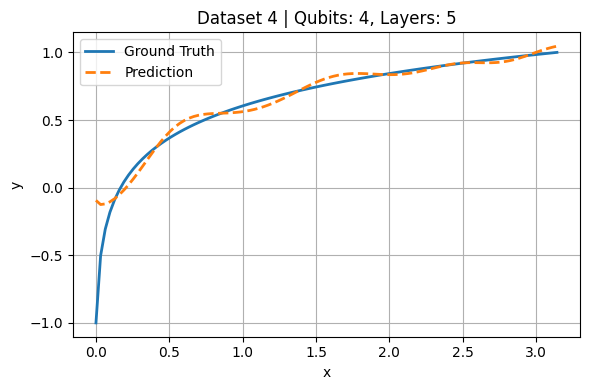

Model (4×5) Training: 100%|██████████| 200/200 [06:17<00:00,  1.89s/it, loss=0.041763]


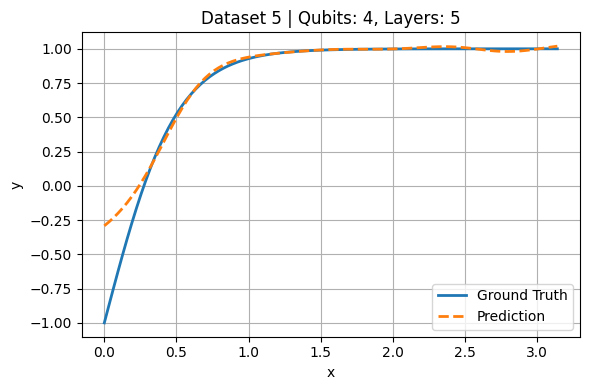

Model (4×5) Training: 100%|██████████| 200/200 [06:17<00:00,  1.89s/it, loss=0.057003]


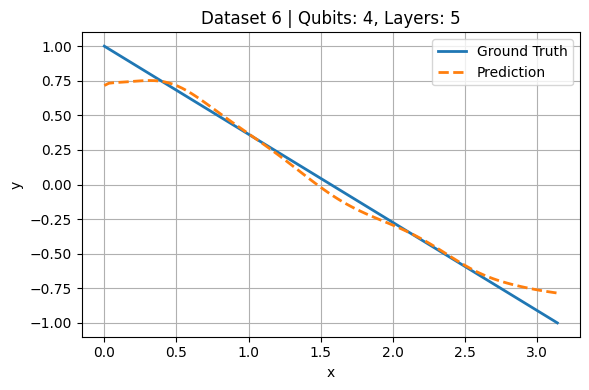

Model (4×5) Training: 100%|██████████| 200/200 [06:18<00:00,  1.89s/it, loss=0.484343]


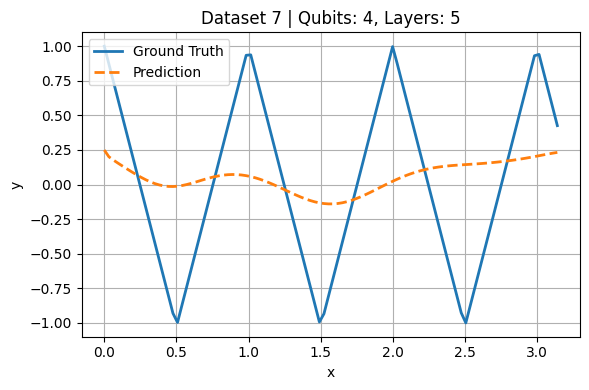

Model (4×5) Training: 100%|██████████| 200/200 [06:17<00:00,  1.89s/it, loss=0.104405]


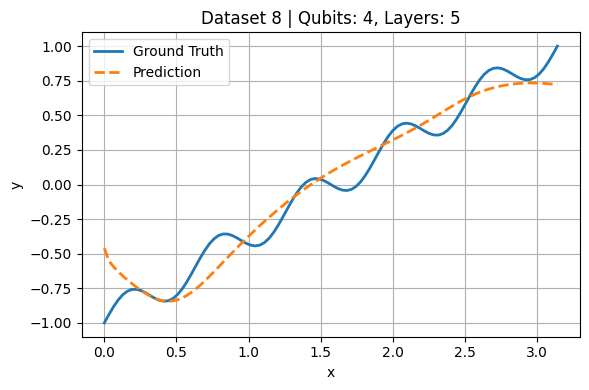

Model (4×5) Training: 100%|██████████| 200/200 [06:18<00:00,  1.89s/it, loss=0.140008]


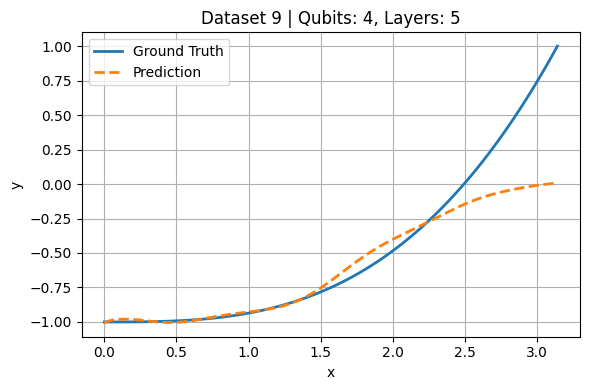

Model (5×5) Training: 100%|██████████| 200/200 [07:41<00:00,  2.31s/it, loss=0.149217]


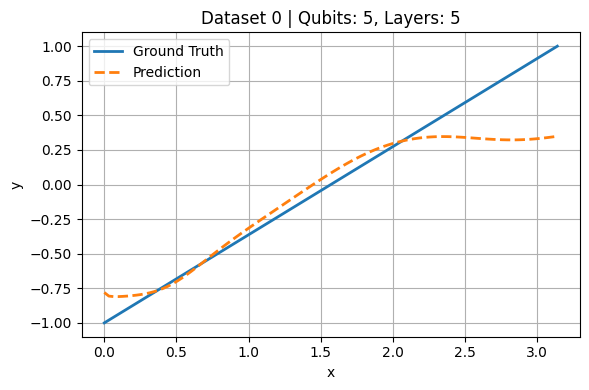

Model (5×5) Training: 100%|██████████| 200/200 [07:41<00:00,  2.31s/it, loss=0.193640]


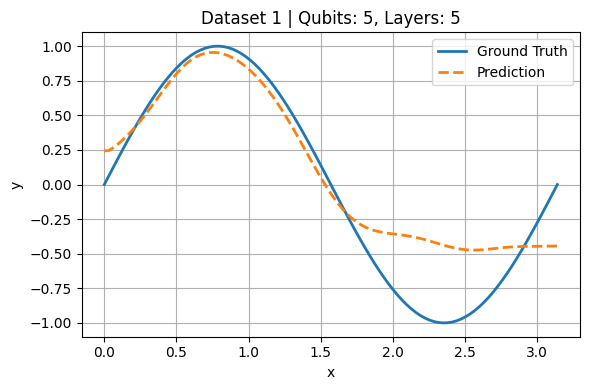

Model (5×5) Training: 100%|██████████| 200/200 [07:41<00:00,  2.31s/it, loss=0.153656]


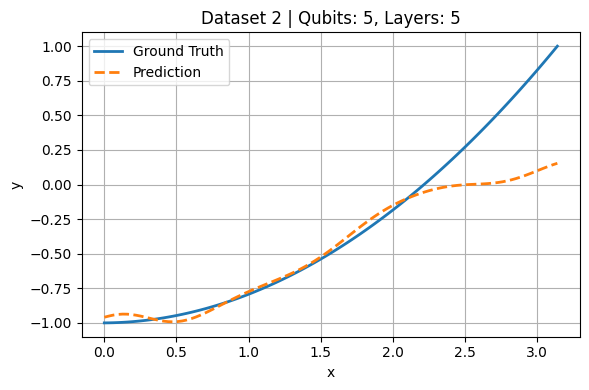

Model (5×5) Training: 100%|██████████| 200/200 [07:42<00:00,  2.31s/it, loss=0.241232]


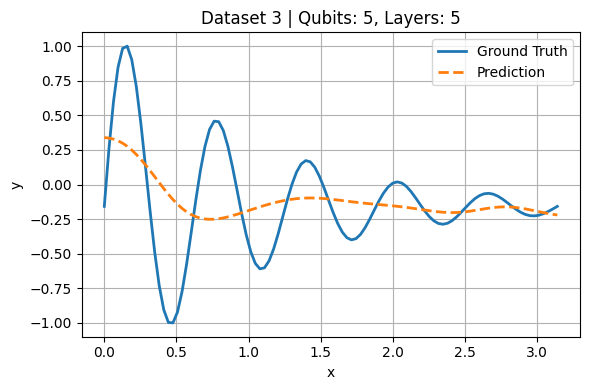

Model (5×5) Training: 100%|██████████| 200/200 [07:41<00:00,  2.31s/it, loss=0.070300]


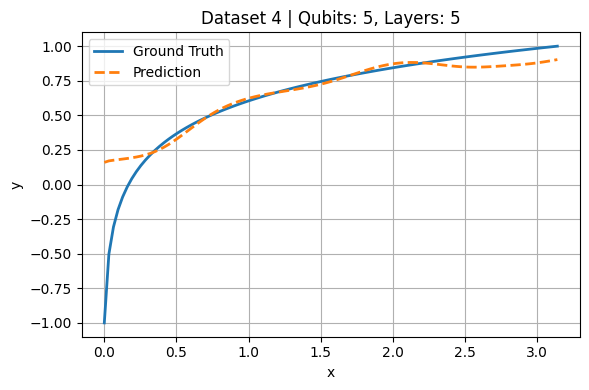

Model (5×5) Training: 100%|██████████| 200/200 [07:54<00:00,  2.37s/it, loss=0.045888]


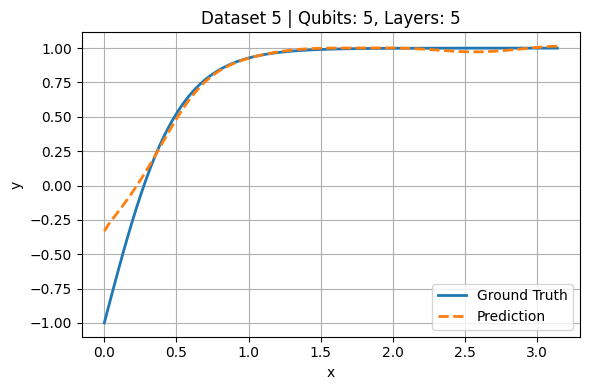

Model (5×5) Training: 100%|██████████| 200/200 [07:42<00:00,  2.31s/it, loss=0.084337]


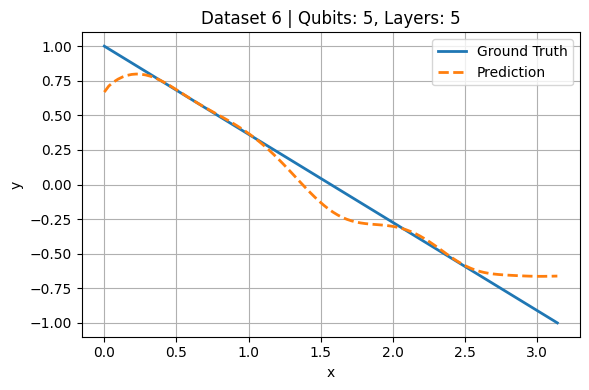

Model (5×5) Training: 100%|██████████| 200/200 [07:42<00:00,  2.31s/it, loss=0.500809]


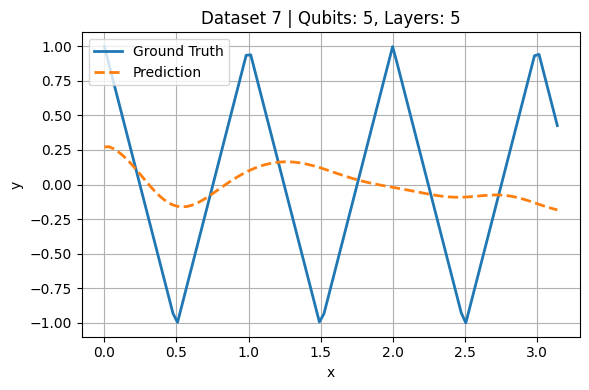

Model (5×5) Training: 100%|██████████| 200/200 [07:41<00:00,  2.31s/it, loss=0.136815]


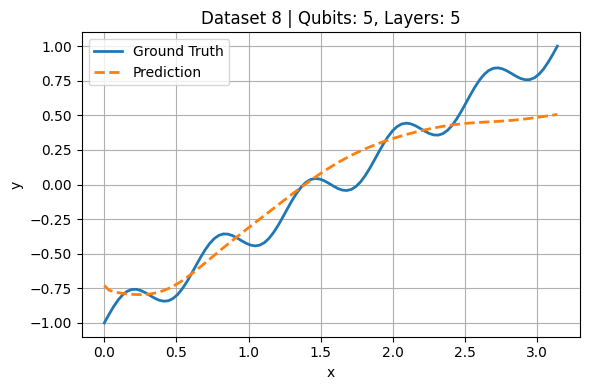

Model (5×5) Training: 100%|██████████| 200/200 [07:42<00:00,  2.31s/it, loss=0.198677]


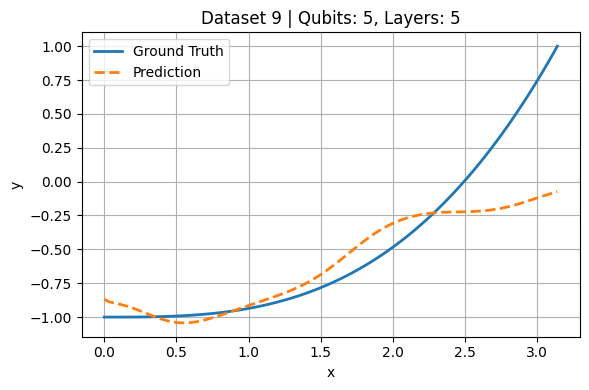

NameError: name 'pd' is not defined

In [13]:
def generate_features(x, num_features):
    funcs = [
        lambda x: x,
        lambda x: x**2,
        lambda x: np.sin(x),
        lambda x: np.cos(x),
        lambda x: np.sqrt(np.abs(x) + 1e-8),
        lambda x: np.tanh(x),
        lambda x: np.log1p(np.abs(x) + 1e-8),
        lambda x: np.exp(-x / 100),
        lambda x: np.sin(2 * x),
        lambda x: np.cos(3 * x),
        lambda x: np.sin(x**2),
        lambda x: np.tanh(x**2),
        lambda x: np.exp(-x**2),
        lambda x: np.log1p(x**2),
        lambda x: np.sin(np.sqrt(np.abs(x))),
        lambda x: np.cos(np.sqrt(np.abs(x)))
    ]

    features = []
    for f in funcs[:min(num_features, len(funcs))]:
        try:
            val = f(x)
            if not np.isfinite(val):
                val = 1e-6
        except:
            val = 1e-6
        features.append(val)

    while len(features) < num_features:
        features.append(1e-6)
    return np.array(features)

# Execução de bateria de testes
result_list = []

for n_layers in range(1, 6):
    for n_qubits in range(1, 6):
        num_features = 2 ** n_qubits

        for i, dataset in datasets.items():
            X_raw = dataset["x"].reshape(-1)
            y = dataset["y"]

            if num_features < 2:
                continue

            # Geração e normalização das features
            X = np.array([generate_features(x, num_features) for x in X_raw])
            X_norm = np.array([
                x / np.linalg.norm(x) if np.linalg.norm(x) > 1e-8 else np.full_like(x, 1e-6)
                for x in X
            ])

            # Validação antes do treinamento
            if not np.all(np.isfinite(X_norm)) or np.any(np.isnan(y)):
                print(f"[!] Dados inválidos: dataset {i}, qubits={n_qubits}, layers={n_layers}")
                continue

            try:
                model = QuantumRegressor(n_qubits=n_qubits, n_layers=n_layers)
                model.fit(X=X_norm, y=y, epochs=200)
                y_pred = model.predict(X_norm)

                stats = model.stats(y_pred, y, verbose=False)
                stats["embedding"] = "amplitude"
                stats["dataset"] = i
                stats["N_Qubits"] = n_qubits
                stats["N_layers"] = n_layers

                result_list.append(stats)
                
                # === VISUALIZAÇÃO ===
                plt.figure(figsize=(6, 4))
                plt.plot(X_raw, y, label="Ground Truth", linewidth=2)
                plt.plot(X_raw, y_pred, '--', label="Prediction", linewidth=2)
                plt.title(f"Dataset {i} | Qubits: {n_qubits}, Layers: {n_layers}")
                plt.xlabel("x")
                plt.ylabel("y")
                plt.legend()
                plt.grid(True)
                plt.tight_layout()
                plt.show()

            except Exception as e:
                print(f"[!] Erro em dataset {i}, qubits={n_qubits}, layers={n_layers}: {e}")
                continue

# Armazenar resultados
result_df = pd.DataFrame(result_list)
# Agora salva direto no Drive, por exemplo, na pasta 'MeuDrive/quantum_results'
result_df.to_csv("results_amplitude.csv", index=False)
result_df

In [15]:
import pandas as pd

In [16]:
result_df = pd.DataFrame(result_list)


In [17]:
result_df.to_csv("results_amplitude.csv", index=False)
result_df

,MSE,R2_Score,Training_Time,N_Qubits,N_layers,Circuit_Depth,embedding,dataset
0,0.048946,0.856071,31.723898,1,1,2,amplitude,0
1,0.164974,0.666803,31.844158,1,1,2,amplitude,1
2,0.069373,0.808760,32.618059,1,1,2,amplitude,2
3,0.242901,-0.713299,37.395003,1,1,2,amplitude,3
4,0.051927,0.580552,37.600500,1,1,2,amplitude,4
...,...,...,...,...,...,...,...,...
245,0.015613,0.926236,474.593377,5,5,11,amplitude,5
246,0.014986,0.955931,462.196400,5,5,11,amplitude,6
247,0.339429,0.039270,462.346807,5,5,11,amplitude,7
248,0.033479,0.899214,461.821489,5,5,11,amplitude,8
